In [ ]:
library(Signac)
library(Seurat)
library(GenomicRanges)
library(ggplot2)
library(patchwork)
library(tibble)
library(RColorBrewer)
library(ggrepel)
library(tidyr)
library(GSEABase)
library(dplyr)
library(stringr)
library(readr)
library(ComplexHeatmap)
library(circlize)
library(grid)
library(clusterProfiler)
library(cowplot)

In [ ]:
azimuth_BM_markers <- list(
    B = c("FCRL2", "FCRL1", "ARHGAP24", "FCRL5", "FCER2", "FCRLA", "PAX5", "CD19", "HLA-DOB", "CD22"),
    `CD4+ T` = c("TSHZ2", "MAL", "CCR7", "CAMK4", "LEF1", "BCL11B", "FHIT", "RCAN3", "SH3YL1", "PIK3IP1"),
    `CD8+ T` = c("GZMK", "CD160", "CD8A", "KLRB1", "LAG3", "CCL4", "XCL2", "GZMM", "XCL1", "CCL3"),
    `Plasma cell` = c("SDC1", "IGLC6", "IGLV6-57", "TNFRSF17", "IGLV3-1", "TNFRSF13B", "IGLC7", "JSRP1", "FCRL5", "IGKV1-5"),
    `Plasmablast` = c("SDC1", "TNFRSF17", "IRF4", "XBP1", "PRDM1", "BLIMP1"), 
    NK = c("SH2D1B", "PRSS23", "S1PR5", "LAIR2", "KLRC1", "PTGDR", "FGFBP2", "FCRL6", "TBX21", "KLRC2"),
    `CD14+ monocyte` = c("FOLR3", "CLEC4E", "MCEMP1", "RBP7", "CDA", "FPR1", "CD300E", "C5AR1", "CD93", "APOBEC3A"),
    `Pro-B` = c("CYGB", "UMODL1", "EBF1", "MME", "VPREB1", "DNTT", "IGLL1", "UHRF1", "BLNK", "AGPS"),
    cDC = c("IDO1", "XCR1", "TACSTD2", "CLEC9A", "WFDC21P", "CLNK", "CADM1", "DNASE1L3", "BATF3", "LGALS2"),
    GMP = c("SERPINB10", "RNASE3", "MS4A3", "PRTN3", "ELANE", "AZU1", "CTSG", "RNASE2", "RETN", "NPW"),
    `Granulocyte` = c("CEBPE", "CSF3R", "FCGR3B", "S100A8", "S100A9", "ELANE", "PRTN3", "AZU1"), 
    `CD16+ monocyte` = c("LYPD2", "VMO1", "TPPP3", "C1QA", "C5AR1", "CD300E", "GPBAR1", "LILRA1", "HES4", "APOBEC3A"),
    Ery = c("HBD", "HBM", "AHSP", "ALAS2", "CA1", "SLC4A1", "IFIT1B", "TRIM58", "SELENBP1", "TMCC2"),
    HSC = c("CRHBP", "AVP", "MYCT1", "BEX1", "NPR3", "CRYGD", "MSRB3", "CD34", "NPDC1", "MLLT3"),
    Progenitor_DC = c("ENHO", "CLEC10A", "RNASE2", "PLBD1", "FCER1A", "IGSF6", "MNDA", "SAMHD1", "ALDH2", "PAK1"),
    pDC = c("ASIP", "CLEC4C", "SCAMP5", "PROC", "PTCRA", "SCT", "SHD", "PPM1J", "LILRA4", "LRRC26"),
    MEP = c("GATA1", "GATA2", "KLF1", "TAL1", "PBX1", "MYB", "ALAS2", "AHSP", "ITGA2B", "PF4", "HPGDS", "MPIG6B"),
    #MEP = c("MYCT1", "CRHBP", "NPR3", "AVP", "GATA2", "HPGDS", "CYTL1", "CRYGD", "IGSF10", "PBX1"), #from bone marrow map
    `Perivascular cell` = c("IGFBP5", "CP", "TF", "DCN", "LUM", "COL1A2", "CRH", "TNC", "SPARCL1", "BMP5"), 
    `DC precursor` = c("ENHO", "CLEC10A", "RNASE2", "PLBD1", "FCER1A", "IGSF6", "MNDA", "SAMHD1", "ALDH2", "PAK1"),
    cDC2 = c("ENHO", "CLEC10A", "CD1C", "IL13RA1", "PLBD1", "LGALS2", "CD33", "IGSF6", "IFI30", "FCER1A"),
    cDC1 = c("IDO1", "XCR1", "TACSTD2", "CLEC9A", "WFDC21P", "CLNK", "CADM1", "DNASE1L3", "BATF3", "LGALS2"),
    `HLA-II+ monocyte` = c("FOLR3", "CLEC4E", "MCEMP1", "RBP7", "CDA", "FPR1", "CD300E", "C5AR1", "CD93", "APOBEC3A", "LYPD2", "VMO1", "TPPP3", "C1QA", "GPBAR1", "LILRA1", "HES4"), # Combined CD14 and CD16
    `CD11c+` = c("FOLR3", "CLEC4E", "MCEMP1", "RBP7", "CDA", "FPR1", "CD300E", "C5AR1", "CD93", "APOBEC3A", "LYPD2", "VMO1", "TPPP3", "C1QA", "GPBAR1", "LILRA1", "HES4"), # Combined CD14 and CD16
    MPP = c("SELL", "SPINK2"),
    #Platelet = c("RGS18", "C2orf88", "TMEM40", "GP9", "PF4", "PPBP", "DAB2", "SPARC", "RUFY1", "F13A1"),
    #Macrophage = c("SPIC", "FABP3", "CD5L", "CCL18", "C1QC", "C1QB", "FABP4", "C1QA", "APOE", "SELENOP"),
    #LMPP = c("AVP", "CRHBP", "C1QTNF4", "BEX1", "NPR3", "CD34", "NPW", "SMIM24", "CSF3R", "NPDC1"),
    LymP = c("ACY3", "PRSS2", "C1QTNF4", "SPINK2", "SMIM24", "NREP", "CD34", "DNTT", "FLT3", "SPNS3"))  

In [ ]:
gmt_file <- "/gpfs/home/ml9675/becklab_ML/ref/gmts/h.all.v2024.1.Hs.symbols.gmt.txt"
gmt <- getGmt(gmt_file)

pathway_names <- names(gmt)
head(pathway_names)

gene_sets <- geneIds(gmt)

[1] "HALLMARK_ADIPOGENESIS"        "HALLMARK_ALLOGRAFT_REJECTION"
[3] "HALLMARK_ANDROGEN_RESPONSE"   "HALLMARK_ANGIOGENESIS"       
[5] "HALLMARK_APICAL_JUNCTION"     "HALLMARK_APICAL_SURFACE"

In [ ]:
HOX_GENES <- c("HOXA9","HOXA10","HOXA7","HOXA5","HOXA3","HOXA4","HOXA6",
               "HOXB3","HOXB4","HOXB5","HOXB6","HOXB2","HOXB7", "HOXB8")

HOX_A_GENES <- c("HOXA9","HOXA10","HOXA7","HOXA5","HOXA3","HOXA4","HOXA6")

HOX_B_GENES <- c("HOXB3","HOXB4","HOXB5","HOXB6","HOXB2","HOXB7","HOXB8")


HSC_STEMNESS <- c("MEIS1", "TSC22D1","HIST1H2BG","SPINK2","MRSB3","ANGPT1")

LYMPHOID <- c("IGLL1","RAG2")

MYELOID <- c("CST3","CEBPB","CEBPA","SPI1","GATA2", "CNRIP1")

CHROMATIN_REMODELING <- c( "AFF1", "DOT1L", "MEN1", "BRD4", "CBX2", "CBX8", "PRDM16", "HMGA2", "EVI1",
  "EZH2", "KDM6A", "ASXL1", "DNMT3A", "TET2", "IDH1", "IDH2",
  "BCOR", "SUZ12", "EED", "SMARCA4", "ARID1A", "ARID1B", "CHD4",
  "SIN3A", "SIN3B", "CREBBP", "EP300", "KMT2A", "SETD2",
  "SATB2", "KAT6B")

gene_sets[["HOX_GENES"]] <- HOX_GENES
gene_sets[["HOX_A_GENES"]] <- HOX_A_GENES
gene_sets[["HOX_B_GENES"]] <- HOX_B_GENES
gene_sets[['LYMPHOID']] <- LYMPHOID
gene_sets[['HSC_STEMNESS']] <- HSC_STEMNESS
gene_sets[['MYELOID']] <- MYELOID
gene_sets[['CHROMATIN_REMODELING']] <- CHROMATIN_REMODELING

In [5]:
## add MHC Class I/II
MHC_CLASS_I_II_GENES <- c(
    'HLA-A', 'HLA-B', 'HLA-C',              # Class I
    'HLA-DRA', 'HLA-DRB1', 'HLA-DPA1',      # Class II
    'HLA-DQB1', 'CD74'                      # Class II + accessory
)
gene_sets[["MHC_CLASS_I_II_GENES"]] <- MHC_CLASS_I_II_GENES

In [7]:
selected_pathways <- c(
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB", 
  "HALLMARK_HYPOXIA", 
  "HALLMARK_TGF_BETA_SIGNALING", 
  "HALLMARK_INFLAMMATORY_RESPONSE", 
  "HALLMARK_E2F_TARGETS",  
  "HALLMARK_G2M_CHECKPOINT",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE",
  "HALLMARK_MYC_TARGETS_V1",
  "HALLMARK_MYC_TARGETS_V2",
  "HALLMARK_DNA_REPAIR",
  "HALLMARK_IL6_JAK_STAT3_SIGNALING",
  "HALLMARK_P53_PATHWAY",
  "HALLMARK_IL2_STAT5_SIGNALING",
  "HALLMARK_FATTY_ACID_METABOLISM",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION",
  "HOX_A_GENES",
  "HOX_B_GENES",
  "MHC_CLASS_I_II_GENES"
)

selected_gene_sets <- gene_sets[selected_pathways]

In [ ]:
pal_use_man <- c(
  "#003366", "#005F73", "#0A9396", # HSC, MPP, GMP
  "#BB3E03", "#CA6702", "#F7B2AD", # Ery, MEP, Platelet
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD", # DC/Mono/Macrophage
  "#EE8866", "#D4A6C8", "#99621E", "#805E73", # B lineage
  "#555c45", "#828C51", "#A6C36F", "#c99e87" # T/NK/pDC/Stroma
)

In [9]:
celltype_pal <- c(
    "B" = "#E41A1C",
    "Pro-B" = "#D7301F",
    "Plasma cell" = "#B2182B",
    "Plasmablast" = "#8C1515",
    "Perivascular cell" = "#C49A00",
    "pDC" = "#DC2D8D",
    "NK" = "#FDDC93",
    "CD8+ T" = "#7B3294",
    "CD4+ T" = "#9970AB",
    "Ery" = "#EABC90",
    "DC precursor" = "#F660B9",
    "cDC2" = "#76168E",
    "cDC1" = "#C51B7D",
    "HLA-II+ monocyte" = "#E66101",
    "CD16+ monocyte" = "#F4A582",
    "CD14+ monocyte" = "#FDDBC7",
    "CD11c+" = "#D6604D",
    "LymP" = "#2166AC",
    "MEP" = "#4393C3",
    "Granulocyte" = "#D73027",
    "GMP" = "#3DC0BE",
    "MPP" = "#80CDC1",
    "HSC" = "#A6DBA0"
)

## DEGs

In [ ]:
#matched rna seq for AML and controls
rna_seq = readRDS("/gpfs/data/aifantislab/home/sirenm01/projects/ubtf/analysis_exp/objects/integrated_rpca_projected_2024-07-17_22:37.rds")

In [ ]:
# Combine the existing selected gene sets with Azimuth markers
selected_gene_sets_combined <- c(selected_gene_sets, azimuth_BM_markers)

# If both lists have overlapping names and you want to merge by pathway name:
selected_gene_sets_combined <- modifyList(selected_gene_sets, azimuth_BM_markers)

# Update genes_use and gene_to_pathway accordingly
genes_use <- unique(unlist(selected_gene_sets_combined))
genes_use <- genes_use[genes_use %in% rownames(rna_seq)]

gene_to_pathway <- enframe(selected_gene_sets_combined) %>%
  tidyr::unnest(value) %>%
  rename(pathway = name, gene = value)


In [ ]:
Assays(rna_seq)


[1] "RNA"        "HTO"        "ADT"        "integrated"

In [ ]:
slotNames(rna_seq[["RNA"]]) 

[1] "counts"        "data"          "scale.data"    "assay.orig"   
[5] "var.features"  "meta.features" "misc"          "key"

In [ ]:
DefaultAssay(rna_seq) <- "RNA"
GetAssay(rna_seq, "RNA")

Assay data with 36601 features for 140897 cells
First 10 features:
 MIR1302-2HG, FAM138A, OR4F5, AL627309.1, AL627309.3, AL627309.2,
AL627309.5, AL627309.4, AP006222.2, AL732372.1 

## Mutation Info

In [ ]:
# === Deduplicated patient mutation groups ===
wt1_npm1 <- unique(c("AML0114", "AML1892", "AML2099", "AML3415"))
npm1     <- unique(c("AML1893", "AML1371", "AML3133", "AML2451", "AML1423", "AML2771", "AML0114", "AML1892", "AML2099", "AML3415"))
ubtf     <- unique(c("AML2918", "AML2523_PB", "AML2523", "AML1033", "AML6124", "AML0516"))
flt3     <- unique(c("AML0516", "AML2523_PB", "AML2523", "AML1885", "AML1892", "AML2099", 
                     "AML3415", "AML1893", "AML2451", "AML5226", "AML2069", "AML2771", 
                     "AML2918", "AML1033", "AML6124"))

# === Create full list of patient IDs ===
all_patient_ids <- unique(c(wt1_npm1, npm1, ubtf, flt3))

#wt1 <- c("AML0516", "AML2918", "AML2523", "AML0183", "AML0114", "AML3133", "AML1371", "AML1423")
wt1 <- c("AML0114", "AML1892", "AML2099", "AML3415","AML0516", "AML2918", "AML2523", "AML0183") ##LAST 4 are from ATAC oncoanlyzer


mutation_df <- tibble(patient_id = all_patient_ids) %>%
  mutate(
    WT1_NPM1 = if_else(patient_id %in% wt1_npm1, "MUT", "WT"),
    NPM1     = if_else(patient_id %in% npm1,     "MUT", "WT"),
    UBTF     = if_else(patient_id %in% ubtf,     "MUT", "WT"),
    FLT3     = if_else(patient_id %in% flt3,     "MUT", "WT"),
    WT1      = if_else(patient_id %in% wt1,      "MUT", "WT")
  )

mutation_df
# write.csv(mutation_df, "mutation_status_matrix_with_WT1.csv", row.names = FALSE)

patient_id,WT1_NPM1,NPM1,UBTF,FLT3,WT1
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AML0114,MUT,MUT,WT,WT,MUT
AML1892,MUT,MUT,WT,MUT,MUT
AML2099,MUT,MUT,WT,MUT,MUT
AML3415,MUT,MUT,WT,MUT,MUT
AML1893,WT,MUT,WT,MUT,WT
AML1371,WT,MUT,WT,WT,WT
AML3133,WT,MUT,WT,WT,WT
AML2451,WT,MUT,WT,MUT,WT
AML1423,WT,MUT,WT,WT,WT


In [6]:
# Create initial mutation status table
mutation_df <- tibble(patient_id = all_patient_ids) %>%
  mutate(
    WT1_NPM1 = if_else(patient_id %in% wt1_npm1, "MUT", "WT"),
    NPM1     = if_else(patient_id %in% npm1,     "MUT", "WT"),
    UBTF     = if_else(patient_id %in% ubtf,     "MUT", "WT"),
    FLT3     = if_else(patient_id %in% flt3,     "MUT", "WT"),
    WT1      = if_else(patient_id %in% wt1,      "MUT", "WT")
  ) %>%
  # Ensure WT1 and NPM1 are also MUT for patients in WT1_NPM1 group
  mutate(
    WT1 = if_else(patient_id %in% wt1_npm1, "MUT", WT1),
    NPM1 = if_else(patient_id %in% wt1_npm1, "MUT", NPM1)
  )
  mutation_df

patient_id,WT1_NPM1,NPM1,UBTF,FLT3,WT1
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AML0114,MUT,MUT,WT,WT,MUT
AML1892,MUT,MUT,WT,MUT,MUT
AML2099,MUT,MUT,WT,MUT,MUT
AML3415,MUT,MUT,WT,MUT,MUT
AML1893,WT,MUT,WT,MUT,WT
AML1371,WT,MUT,WT,WT,WT
AML3133,WT,MUT,WT,WT,WT
AML2451,WT,MUT,WT,MUT,WT
AML1423,WT,MUT,WT,WT,WT


In [7]:
mutation_combinations <- mutation_df %>%
  group_by(WT1_NPM1, NPM1, UBTF, FLT3, WT1) %>%
  summarise(Frequency = n(), .groups = "drop") %>%
  arrange(desc(Frequency))

mutation_combinations

WT1_NPM1,NPM1,UBTF,FLT3,WT1,Frequency
<chr>,<chr>,<chr>,<chr>,<chr>,<int>
MUT,MUT,WT,MUT,MUT,3
WT,MUT,WT,MUT,WT,3
WT,MUT,WT,WT,WT,3
WT,WT,MUT,MUT,MUT,3
WT,WT,MUT,MUT,WT,3
WT,WT,WT,MUT,WT,3
MUT,MUT,WT,WT,MUT,1


In [ ]:
# Get all unique orig.ident values
orig_ident_values <- unique(rna_seq@meta.data$orig.ident)

# Create a dataframe of all combinations of orig.ident and patient_id
expanded_matches <- expand.grid(orig.ident = orig_ident_values, patient_id = mutation_df$patient_id, stringsAsFactors = FALSE) %>%
  mutate(is_match = str_detect(orig.ident, fixed(patient_id)))

# Filter to matches only
matched_pairs <- expanded_matches %>%
  filter(is_match) %>%
  left_join(mutation_df, by = "patient_id")

# Collapse matches by orig.ident
collapsed_matches <- matched_pairs %>%
  group_by(orig.ident) %>%
  summarize(
    patient_id = str_c(unique(patient_id), collapse = ", "),
    WT1_NPM1 = if (any(WT1_NPM1 == "MUT", na.rm = TRUE)) "MUT" else "WT",
    NPM1     = if (any(NPM1 == "MUT", na.rm = TRUE))     "MUT" else "WT",
    UBTF     = if (any(UBTF == "MUT", na.rm = TRUE))     "MUT" else "WT",
    FLT3     = if (any(FLT3 == "MUT", na.rm = TRUE))     "MUT" else "WT",
    WT1      = if (any(WT1 == "MUT", na.rm = TRUE))      "MUT" else "WT",
    .groups = "drop"
  )

# Merge with all orig.ident values to include unmatched ones
match_df <- tibble(orig.ident = orig_ident_values) %>%
  left_join(collapsed_matches, by = "orig.ident") %>%
  mutate(
    match_status = if_else(is.na(WT1_NPM1) & is.na(NPM1) & is.na(UBTF) & is.na(FLT3) & is.na(WT1),
                           "No Match", "Matched")
  )

match_df

orig.ident,patient_id,WT1_NPM1,NPM1,UBTF,FLT3,WT1,match_status
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
CTRL2095_AML1892_AML1893_AML2099,"AML1892, AML2099, AML1893",MUT,MUT,WT,MUT,MUT,Matched
AML1371_1,AML1371,WT,MUT,WT,WT,WT,Matched
AML1371_2,AML1371,WT,MUT,WT,WT,WT,Matched
AML3133_1,AML3133,WT,MUT,WT,WT,WT,Matched
AML3133_2,AML3133,WT,MUT,WT,WT,WT,Matched
AML3133_3,AML3133,WT,MUT,WT,WT,WT,Matched
CTRL0002_CTRL0003_1,NA,NA,NA,NA,NA,NA,No Match
CTRL0002_CTRL0003_2,NA,NA,NA,NA,NA,NA,No Match
CTRL0002_CTRL0003_3,NA,NA,NA,NA,NA,NA,No Match


In [ ]:
# Get all unique orig.ident values
orig_ident_values <- unique(rna_seq@meta.data$orig.ident)

# Pair each orig.ident with all patient IDs, mark exact/partial matches
expanded_matches <- expand.grid(orig.ident = orig_ident_values, patient_id = mutation_df$patient_id, stringsAsFactors = FALSE) %>%
  mutate(
    is_exact = orig.ident == patient_id,
    is_partial = str_detect(orig.ident, fixed(patient_id))
  ) %>%
  filter(is_partial)  # Keep exact or partial matches only

# Pick the best match (exact match > first partial match)
best_matches <- expanded_matches %>%
  group_by(orig.ident) %>%
  arrange(desc(is_exact)) %>%
  slice(1) %>%
  ungroup() %>%
  left_join(mutation_df, by = "patient_id")

# Left join with all orig.ident values (ensures unmatched CTRLs are included)
match_df <- tibble(orig.ident = orig_ident_values) %>%
  left_join(best_matches, by = "orig.ident") %>%
  mutate(
    match_status = if_else(is.na(WT1_NPM1) & is.na(NPM1) & is.na(UBTF) & is.na(FLT3) & is.na(WT1),
                           "No Match", "Matched"),
    # Explicitly retain NA mutation status for unmatched CTRL samples
    WT1_NPM1 = if_else(match_status == "No Match" & str_detect(orig.ident, "CTRL"), "WT", WT1_NPM1),
    NPM1     = if_else(match_status == "No Match" & str_detect(orig.ident, "CTRL"), "WT", NPM1),
    UBTF     = if_else(match_status == "No Match" & str_detect(orig.ident, "CTRL"), "WT", UBTF),
    FLT3     = if_else(match_status == "No Match" & str_detect(orig.ident, "CTRL"), "WT", FLT3),
    WT1      = if_else(match_status == "No Match" & str_detect(orig.ident, "CTRL"), "WT", WT1)
  )

# View final result
match_df

orig.ident,patient_id,is_exact,is_partial,WT1_NPM1,NPM1,UBTF,FLT3,WT1,match_status
<chr>,<chr>,<lgl>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
CTRL2095_AML1892_AML1893_AML2099,AML1892,FALSE,TRUE,MUT,MUT,WT,MUT,MUT,Matched
AML1371_1,AML1371,FALSE,TRUE,WT,MUT,WT,WT,WT,Matched
AML1371_2,AML1371,FALSE,TRUE,WT,MUT,WT,WT,WT,Matched
AML3133_1,AML3133,FALSE,TRUE,WT,MUT,WT,WT,WT,Matched
AML3133_2,AML3133,FALSE,TRUE,WT,MUT,WT,WT,WT,Matched
AML3133_3,AML3133,FALSE,TRUE,WT,MUT,WT,WT,WT,Matched
CTRL0002_CTRL0003_1,NA,NA,NA,WT,WT,WT,WT,WT,No Match
CTRL0002_CTRL0003_2,NA,NA,NA,WT,WT,WT,WT,WT,No Match
CTRL0002_CTRL0003_3,NA,NA,NA,WT,WT,WT,WT,WT,No Match


In [58]:
rna_seq@meta.data <- rna_seq@meta.data %>%
  left_join(
    match_df %>%
      dplyr::select(orig.ident, WT1_NPM1, NPM1, UBTF, FLT3, WT1),
    by = "orig.ident"
  )

In [59]:
rna_seq$barcode <- colnames(rna_seq[["RNA"]])
rownames(rna_seq@meta.data) <- rna_seq$barcode

In [60]:
rna_seq@meta.data <- rna_seq@meta.data %>%
  mutate(disease.state = case_when(
    orig.ident == "CTRL2095_AML1892_AML1893_AML2099" ~ "AML",
    str_detect(orig.ident, "CTRL") ~ "CTRL",
    str_detect(orig.ident, "AML") ~ "AML",
    TRUE ~ NA_character_
  ))

In [61]:
mutation_combinations <- mutation_df %>%
  group_by(WT1_NPM1, NPM1, UBTF, FLT3, WT1) %>%
  summarise(Frequency = n(), .groups = "drop") %>%
  arrange(desc(Frequency))

mutation_combinations

WT1_NPM1,NPM1,UBTF,FLT3,WT1,Frequency
<chr>,<chr>,<chr>,<chr>,<chr>,<int>
MUT,MUT,WT,MUT,MUT,3
WT,MUT,WT,MUT,WT,3
WT,MUT,WT,WT,WT,3
WT,WT,MUT,MUT,MUT,3
WT,WT,MUT,MUT,WT,3
WT,WT,WT,MUT,WT,3
MUT,MUT,WT,WT,MUT,1


In [ ]:
## DEGs

In [ ]:
DefaultAssay(rna_seq) <- "RNA"

#cell_types <- c("MPP", "GMP", "CD14+ monocyte")
cell_types <- unique(rna_seq@meta.data$predicted_Broad_cell_identity)

# Initialize output lists
DEG_UBTF_CTRL <- list()
DEG_UBTF_MUT_WT1_MUTvsWT1_WT <- list()

for (cell in cell_types) {
  cat(sprintf("\nProcessing cell type: %s\n", cell))
  
  meta_sub <- rna_seq@meta.data[rna_seq@meta.data$predicted_Broad_cell_identity == cell, , drop = FALSE]
  
  # ----------- UBTF_MUT vs CTRL -----------
  ubtf_mut_ctrl_cells <- rownames(meta_sub[meta_sub$UBTF == "MUT" & meta_sub$disease.state == "AML", ])
  ctrl_cells <- rownames(meta_sub[meta_sub$disease.state == "CTRL", ])
  
  if (length(ubtf_mut_ctrl_cells) >= 3 & length(ctrl_cells) >= 3) {
    cat("   UBTF_MUT vs CTRL...\n")
    
    valid_cells <- intersect(c(ubtf_mut_ctrl_cells, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% ubtf_mut_ctrl_cells] <- "UBTF_MUT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "UBTF_MUT",
      ident.2 = "CTRL",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    DEG_UBTF_CTRL[[cell]] <- deg
    cat(sprintf("     UBTF_MUT vs CTRL: %d genes\n", nrow(deg)))
  }
  
  # ----------- UBTF_MUT & WT1_MUT vs UBTF_MUT & WT1_WT -----------
  #meta_aml <- meta_sub[meta_sub$disease.state == "AML", ]
  
 # group1 <- rownames(meta_aml[meta_aml$UBTF == "MUT" & meta_aml$WT1 == "MUT", ])
 # group2 <- rownames(meta_aml[meta_aml$UBTF == "MUT" & meta_aml$WT1 == "WT", ])
  
 # if (length(group1) >= 3 & length(group2) >= 3) {
 #   cat("    UBTF_MUT & WT1_MUT vs UBTF_MUT & WT1_WT...\n")
    
 #   valid_cells <- intersect(c(group1, group2), colnames(rna_seq))
 #   small_obj <- subset(rna_seq, cells = valid_cells)
    
 #   small_obj$group <- NA_character_
 #   small_obj$group[Cells(small_obj) %in% group1] <- "WT1_MUT"
 #   small_obj$group[Cells(small_obj) %in% group2] <- "WT1_WT"
 #   Idents(small_obj) <- small_obj$group

 #   if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
 #     small_obj <- NormalizeData(small_obj, verbose = FALSE)
 #   }

  #  deg <- FindMarkers(
 #     object = small_obj,
 #     ident.1 = "WT1_MUT",
 #     ident.2 = "WT1_WT",
 #     test.use = "wilcox",
 #     min.pct = 0.1
  #  ) %>% mutate(gene = rownames(.))
    
  #  DEG_UBTF_MUT_WT1_MUTvsWT1_WT[[cell]] <- deg
  #  cat(sprintf("      UBTF_MUT & WT1_MUT vs UBTF_MUT & WT1_WT: %d genes\n", nrow(deg)))
  #}
}

# Summary
cat("\n All DEG comparisons complete!\n")
cat(sprintf("UBTF_MUT vs CTRL completed for %d cell types\n", length(DEG_UBTF_CTRL)))
cat(sprintf("UBTF_MUT & WT1_MUT vs UBTF_MUT & WT1_WT completed for %d cell types\n", length(DEG_UBTF_MUT_WT1_MUTvsWT1_WT)))

In [ ]:
# 📁 Output folder for DEG results
base_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"
dir.create(base_dir, recursive = TRUE, showWarnings = FALSE)

# 🔧 Function to combine and label DEG results
combine_results_strict <- function(deg_list, comparison1, comparison2) {
  results <- list()
  for (cell in names(deg_list)) {
    df <- deg_list[[cell]]
    if (!is.null(df) && nrow(df) > 0) {
      df$cell_type <- cell
      df$comparison.1 <- comparison1
      df$comparison.2 <- comparison2
      results[[cell]] <- df
    }
  }
  bind_rows(results)
}

#Combine and label results
combined_DEG_UBTF_CTRL <- combine_results_strict(DEG_UBTF_CTRL, "UBTF_MUT", "CTRL")
#combined_DEG_UBTF_MUT_WT1_MUTvsWT1_WT <- combine_results_strict(DEG_UBTF_MUT_WT1_MUTvsWT1_WT, "UBTF_MUT_WT1_MUT", "UBTF_MUT_WT1_WT")

#Filtered versions: padj < 0.05
filtered_DEG_UBTF_CTRL <- combined_DEG_UBTF_CTRL %>% filter(p_val_adj < 0.05)
#filtered_DEG_UBTF_MUT_WT1_MUTvsWT1_WT <- combined_DEG_UBTF_MUT_WT1_MUTvsWT1_WT %>% filter(p_val_adj < 0.05)

#Save to CSV
write.csv(combined_DEG_UBTF_CTRL, file.path(base_dir, "DEG_UBTF_MUT_vs_CTRL.csv"), row.names = FALSE)
write.csv(filtered_DEG_UBTF_CTRL, file.path(base_dir, "DEG_UBTF_MUT_vs_CTRL_filtered.csv"), row.names = FALSE)

#write.csv(combined_DEG_UBTF_MUT_WT1_MUTvsWT1_WT, file.path(csv_dir, "DEG_UBTF_MUT_WT1_MUT_vs_WT1_WT.csv"), row.names = FALSE)
#write.csv(filtered_DEG_UBTF_MUT_WT1_MUTvsWT1_WT, file.path(csv_dir, "DEG_UBTF_MUT_WT1_MUT_vs_WT1_WT_filtered.csv"), row.names = FALSE)

cat("DEG CSVs and filtered versions saved to:", csv_dir, "\n")

In [ ]:
csv_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"

# Load combined and filtered DEG results
combined_DEG_UBTF_CTRL <- read_csv(file.path(csv_dir, "DEG_UBTF_MUT_vs_CTRL.csv"))
filtered_DEG_UBTF_CTRL <- read_csv(file.path(csv_dir, "DEG_UBTF_MUT_vs_CTRL_filtered.csv"))

# Optional: split back into list format by cell type
DEG_UBTF_CTRL <- split(combined_DEG_UBTF_CTRL, combined_DEG_UBTF_CTRL$cell_type)
filtered_DEG_UBTF_CTRL_list <- split(filtered_DEG_UBTF_CTRL, filtered_DEG_UBTF_CTRL$cell_type)

# Done
cat("DEG data loaded and split by cell type.\n")

#### UBTF FLT3 WT1wt and UBTF FLT3 WT1mut instead of all UBTF mut

In [ ]:
DefaultAssay(rna_seq) <- "RNA"

# Only run on specified cell types
cell_types <- unique(rna_seq@meta.data$predicted_Broad_cell_identity)

# Initialize output lists
DEG_UBTF_FLT3_wt1wt_CTRL <- list()
DEG_UBTF_FLT3_wt1mut_CTRL <- list()
DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt <- list()

for (cell in cell_types) {
  cat(sprintf("\nProcessing cell type: %s\n", cell))
  
  meta_sub <- rna_seq@meta.data[rna_seq@meta.data$predicted_Broad_cell_identity == cell, , drop = FALSE]
  ctrl_cells <- rownames(meta_sub[meta_sub$disease.state == "CTRL", ])

  # ----------- UBTF_MUT & WT1_WT vs CTRL -----------
  ubtf_wt1wt_cells <- rownames(meta_sub[
    meta_sub$UBTF == "MUT" &
    meta_sub$WT1 == "WT" &
    meta_sub$disease.state == "AML", 
  ])

  if (length(ubtf_wt1wt_cells) >= 3 & length(ctrl_cells) >= 3) {
    cat("   UBTF_MUT & WT1_WT vs CTRL...\n")
    
    valid_cells <- intersect(c(ubtf_wt1wt_cells, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% ubtf_wt1wt_cells] <- "UBTF_FLT3_WT1_WT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "UBTF_FLT3_WT1_WT",
      ident.2 = "CTRL",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    DEG_UBTF_FLT3_wt1wt_CTRL[[cell]] <- deg
    cat(sprintf("     UBTF_FLT3_WT1_WT vs CTRL: %d genes\n", nrow(deg)))
  }

  # ----------- UBTF_MUT & WT1_MUT vs CTRL -----------
  ubtf_wt1mut_cells <- rownames(meta_sub[
    meta_sub$UBTF == "MUT" &
    meta_sub$WT1 == "MUT" &
    meta_sub$disease.state == "AML", 
  ])

  if (length(ubtf_wt1mut_cells) >= 3 & length(ctrl_cells) >= 3) {
    cat("   UBTF_MUT & WT1_MUT vs CTRL...\n")
    
    valid_cells <- intersect(c(ubtf_wt1mut_cells, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% ubtf_wt1mut_cells] <- "UBTF_FLT3_WT1_MUT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "UBTF_FLT3_WT1_MUT",
      ident.2 = "CTRL",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    DEG_UBTF_FLT3_wt1mut_CTRL[[cell]] <- deg
    cat(sprintf("     UBTF_FLT3_WT1_MUT vs CTRL: %d genes\n", nrow(deg)))
  }

  # ----------- UBTF_MUT & WT1_MUT vs UBTF_MUT & WT1_WT -----------
  if (length(ubtf_wt1mut_cells) >= 3 & length(ubtf_wt1wt_cells) >= 3) {
    cat("   UBTF_MUT & WT1_MUT vs UBTF_MUT & WT1_WT...\n")
    
    valid_cells <- intersect(c(ubtf_wt1mut_cells, ubtf_wt1wt_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% ubtf_wt1mut_cells] <- "WT1_MUT"
    small_obj$group[Cells(small_obj) %in% ubtf_wt1wt_cells]  <- "WT1_WT"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "WT1_MUT",
      ident.2 = "WT1_WT",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt[[cell]] <- deg
    cat(sprintf("     WT1_MUT vs WT1_WT within UBTF_MUT: %d genes\n", nrow(deg)))
  }
}

cat("\nAll DEG comparisons complete!\n")
cat(sprintf("UBTF_FLT3_WT1_WT vs CTRL completed for %d cell types\n", length(DEG_UBTF_FLT3_wt1wt_CTRL)))
cat(sprintf("UBTF_FLT3_WT1_MUT vs CTRL completed for %d cell types\n", length(DEG_UBTF_FLT3_wt1mut_CTRL)))
cat(sprintf("WT1_MUT vs WT1_WT within UBTF_MUT completed for %d cell types\n", length(DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt)))

In [ ]:
## save above
# Output folder for DEG results
base_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"
dir.create(base_dir, recursive = TRUE, showWarnings = FALSE)

# 🔧 Function to combine and label DEG results
combine_results_strict <- function(deg_list, comparison1, comparison2) {
  results <- list()
  for (cell in names(deg_list)) {
    df <- deg_list[[cell]]
    if (!is.null(df) && nrow(df) > 0) {
      df$cell_type <- cell
      df$comparison.1 <- comparison1
      df$comparison.2 <- comparison2
      results[[cell]] <- df
    }
  }
  bind_rows(results)
}

# Combine and label results
combined_DEG_UBTF_FLT3_wt1wt_CTRL <- combine_results_strict(DEG_UBTF_FLT3_wt1wt_CTRL, "UBTF_FLT3_WT1_WT", "CTRL")
combined_DEG_UBTF_FLT3_wt1mut_CTRL <- combine_results_strict(DEG_UBTF_FLT3_wt1mut_CTRL, "UBTF_FLT3_WT1_MUT", "CTRL")
combined_DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt <- combine_results_strict(DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt, "UBTF_FLT3_WT1_MUT", "UBTF_FLT3_WT1_WT")

# Filtered versions: padj < 0.05
filtered_DEG_UBTF_FLT3_wt1wt_CTRL <- combined_DEG_UBTF_FLT3_wt1wt_CTRL %>% filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1)
filtered_DEG_UBTF_FLT3_wt1mut_CTRL <- combined_DEG_UBTF_FLT3_wt1mut_CTRL %>% filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1) 
filtered_DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt <- combined_DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt %>% filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1)

# Save to CSV
write.csv(combined_DEG_UBTF_FLT3_wt1wt_CTRL, file.path(base_dir, "DEG_UBTF_FLT3_WT1_WT_vs_CTRL.csv"), row.names = FALSE)
write.csv(filtered_DEG_UBTF_FLT3_wt1wt_CTRL, file.path(base_dir, "DEG_UBTF_FLT3_WT1_WT_vs_CTRL_filtered.csv"), row.names = FALSE)

write.csv(combined_DEG_UBTF_FLT3_wt1mut_CTRL, file.path(base_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_CTRL.csv"), row.names = FALSE)
write.csv(filtered_DEG_UBTF_FLT3_wt1mut_CTRL, file.path(base_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_CTRL_filtered.csv"), row.names = FALSE)

write.csv(combined_DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt, file.path(base_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT.csv"), row.names = FALSE)
write.csv(filtered_DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt, file.path(base_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT_filtered.csv"), row.names = FALSE)

cat("DEG CSVs and filtered versions saved to:", base_dir, "\n")


In [ ]:
# Read full and filtered DEG tables
csv_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"
DEG_UBTF_FLT3_wt1wt_CTRL <- read.csv(file.path(csv_dir, "DEG_UBTF_FLT3_WT1_WT_vs_CTRL.csv"))
DEG_UBTF_FLT3_wt1wt_CTRL_filtered <- read.csv(file.path(csv_dir, "DEG_UBTF_FLT3_WT1_WT_vs_CTRL_filtered.csv"))

DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt <- read.csv(file.path(csv_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT.csv"))
DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered <- read.csv(file.path(csv_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT_filtered.csv"))


In [188]:
all(DEG_UBTF_FLT3_wt1wt_CTRL_filtered$p_val_adj < 0.05)
all(abs(DEG_UBTF_FLT3_wt1wt_CTRL_filtered$avg_log2FC) > 1)

all(DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered$p_val_adj < 0.05)
all(abs(DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered$avg_log2FC) > 1)


[1] TRUE

[1] FALSE

[1] TRUE

[1] FALSE

In [ ]:
#Overwrite DEG filtered objects with strict thresholds
DEG_UBTF_FLT3_wt1wt_CTRL_filtered <- DEG_UBTF_FLT3_wt1wt_CTRL_filtered %>%
  filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1)

DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered <- DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered %>%
  filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1)


In [190]:
all(DEG_UBTF_FLT3_wt1wt_CTRL_filtered$p_val_adj < 0.05)
all(abs(DEG_UBTF_FLT3_wt1wt_CTRL_filtered$avg_log2FC) > 1)

all(DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered$p_val_adj < 0.05)
all(abs(DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered$avg_log2FC) > 1)


[1] TRUE

[1] TRUE

[1] TRUE

[1] TRUE

#### NPM1

In [ ]:
DefaultAssay(rna_seq) <- "RNA"

# Only run on specified cell types
cell_types <- unique(rna_seq@meta.data$predicted_Broad_cell_identity)

# Initialize output lists
DEG_NPM1_FLT3_wt1wt_CTRL <- list()
DEG_NPM1_FLT3_wt1mut_CTRL <- list()
DEG_NPM1_FLT3_wt1mut_vs_NPM1_FLT3_wt1wt <- list()

for (cell in cell_types) {
  cat(sprintf("\nProcessing cell type: %s\n", cell))
  
  meta_sub <- rna_seq@meta.data[rna_seq@meta.data$predicted_Broad_cell_identity == cell, , drop = FALSE]
  ctrl_cells <- rownames(meta_sub[meta_sub$disease.state == "CTRL", ])

  # ----------- NPM1_MUT & FLT3_MUT & WT1_WT vs CTRL -----------
  npm1flt3_wt1wt_cells <- rownames(meta_sub[
    meta_sub$NPM1 == "MUT" &
    meta_sub$FLT3 == "MUT" &
    meta_sub$WT1 == "WT" &
    meta_sub$disease.state == "AML", 
  ])

  if (length(npm1flt3_wt1wt_cells) >= 3 & length(ctrl_cells) >= 3) {
    cat("   NPM1_MUT & FLT3_MUT & WT1_WT vs CTRL...\n")
    
    valid_cells <- intersect(c(npm1flt3_wt1wt_cells, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% npm1flt3_wt1wt_cells] <- "NPM1_FLT3_WT1_WT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "NPM1_FLT3_WT1_WT",
      ident.2 = "CTRL",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    DEG_NPM1_FLT3_wt1wt_CTRL[[cell]] <- deg
    cat(sprintf("     NPM1_FLT3_WT1_WT vs CTRL: %d genes\n", nrow(deg)))
  }

  # ----------- NPM1_MUT & FLT3_MUT & WT1_MUT vs CTRL -----------
  npm1flt3_wt1mut_cells <- rownames(meta_sub[
    meta_sub$NPM1 == "MUT" &
    meta_sub$FLT3 == "MUT" &
    meta_sub$WT1 == "MUT" &
    meta_sub$disease.state == "AML", 
  ])

  if (length(npm1flt3_wt1mut_cells) >= 3 & length(ctrl_cells) >= 3) {
    cat("   NPM1_MUT & FLT3_MUT & WT1_MUT vs CTRL...\n")
    
    valid_cells <- intersect(c(npm1flt3_wt1mut_cells, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% npm1flt3_wt1mut_cells] <- "NPM1_FLT3_WT1_MUT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "NPM1_FLT3_WT1_MUT",
      ident.2 = "CTRL",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    DEG_NPM1_FLT3_wt1mut_CTRL[[cell]] <- deg
    cat(sprintf("     NPM1_FLT3_WT1_MUT vs CTRL: %d genes\n", nrow(deg)))
  }

  # ----------- NPM1_MUT & FLT3_MUT & WT1_MUT vs WT1_WT -----------
  if (length(npm1flt3_wt1mut_cells) >= 3 & length(npm1flt3_wt1wt_cells) >= 3) {
    cat("   NPM1_MUT & FLT3_MUT & WT1_MUT vs WT1_WT...\n")
    
    valid_cells <- intersect(c(npm1flt3_wt1mut_cells, npm1flt3_wt1wt_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% npm1flt3_wt1mut_cells] <- "WT1_MUT"
    small_obj$group[Cells(small_obj) %in% npm1flt3_wt1wt_cells]  <- "WT1_WT"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "WT1_MUT",
      ident.2 = "WT1_WT",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    DEG_NPM1_FLT3_wt1mut_vs_NPM1_FLT3_wt1wt[[cell]] <- deg
    cat(sprintf("     WT1_MUT vs WT1_WT within NPM1_FLT3_MUT: %d genes\n", nrow(deg)))
  }
}

cat("\nAll DEG comparisons complete!\n")
cat(sprintf("NPM1_FLT3_WT1_WT vs CTRL completed for %d cell types\n", length(DEG_NPM1_FLT3_wt1wt_CTRL)))
cat(sprintf("NPM1_FLT3_WT1_MUT vs CTRL completed for %d cell types\n", length(DEG_NPM1_FLT3_wt1mut_CTRL)))
cat(sprintf("WT1_MUT vs WT1_WT within NPM1_FLT3_MUT completed for %d cell types\n", length(DEG_NPM1_FLT3_wt1mut_vs_NPM1_FLT3_wt1wt)))


In [ ]:
base_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"
dir.create(base_dir, recursive = TRUE, showWarnings = FALSE)

# Combine and label DEG results
combine_results_strict <- function(deg_list, comparison1, comparison2) {
  results <- list()
  for (cell in names(deg_list)) {
    df <- deg_list[[cell]]
    if (!is.null(df) && nrow(df) > 0) {
      df$cell_type <- cell
      df$comparison.1 <- comparison1
      df$comparison.2 <- comparison2
      results[[cell]] <- df
    }
  }
  bind_rows(results)
}

# Combine and label results
combined_DEG_NPM1_FLT3_wt1wt_CTRL <- combine_results_strict(DEG_NPM1_FLT3_wt1wt_CTRL, "NPM1_FLT3_WT1_WT", "CTRL")
combined_DEG_NPM1_FLT3_wt1mut_CTRL <- combine_results_strict(DEG_NPM1_FLT3_wt1mut_CTRL, "NPM1_FLT3_WT1_MUT", "CTRL")
combined_DEG_NPM1_FLT3_wt1mut_vs_wt1wt <- combine_results_strict(DEG_NPM1_FLT3_wt1mut_vs_NPM1_FLT3_wt1wt, "NPM1_FLT3_WT1_MUT", "NPM1_FLT3_WT1_WT")

#Filtered versions: padj < 0.05
filtered_DEG_NPM1_FLT3_wt1wt_CTRL <- combined_DEG_NPM1_FLT3_wt1wt_CTRL %>% filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1)
filtered_DEG_NPM1_FLT3_wt1mut_CTRL <- combined_DEG_NPM1_FLT3_wt1mut_CTRL %>% filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1)
filtered_DEG_NPM1_FLT3_wt1mut_vs_wt1wt <- combined_DEG_NPM1_FLT3_wt1mut_vs_wt1wt %>% filter(p_val_adj < 0.05 & abs(avg_log2FC) > 1)

# Save to CSV
write.csv(combined_DEG_NPM1_FLT3_wt1wt_CTRL, file.path(base_dir, "DEG_NPM1_FLT3_WT1_WT_vs_CTRL.csv"), row.names = FALSE)
write.csv(filtered_DEG_NPM1_FLT3_wt1wt_CTRL, file.path(base_dir, "DEG_NPM1_FLT3_WT1_WT_vs_CTRL_filtered.csv"), row.names = FALSE)

write.csv(combined_DEG_NPM1_FLT3_wt1mut_CTRL, file.path(base_dir, "DEG_NPM1_FLT3_WT1_MUT_vs_CTRL.csv"), row.names = FALSE)
write.csv(filtered_DEG_NPM1_FLT3_wt1mut_CTRL, file.path(base_dir, "DEG_NPM1_FLT3_WT1_MUT_vs_CTRL_filtered.csv"), row.names = FALSE)

write.csv(combined_DEG_NPM1_FLT3_wt1mut_vs_wt1wt, file.path(base_dir, "DEG_NPM1_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_WT.csv"), row.names = FALSE)
write.csv(filtered_DEG_NPM1_FLT3_wt1mut_vs_wt1wt, file.path(base_dir, "DEG_NPM1_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_WT_filtered.csv"), row.names = FALSE)

cat("NPM1_FLT3 DEG CSVs and filtered versions saved to:", base_dir, "\n")


In [ ]:
## loop for other mutation groups

In [ ]:
DefaultAssay(rna_seq) <- "RNA"

cell_types <- unique(rna_seq@meta.data$predicted_Broad_cell_identity)

# Initialize DEG list
DEG_NPM1_CTRL <- list()
DEG_NPM1_FLT3_CTRL <- list()
DEG_WT1_NPM1_CTRL <- list()

for (cell in cell_types) {
  cat(sprintf("\nProcessing cell type: %s\n", cell))
  
  meta_sub <- rna_seq@meta.data[rna_seq@meta.data$predicted_Broad_cell_identity == cell, , drop = FALSE]
  
  # Shared control group
  ctrl_cells <- rownames(meta_sub[meta_sub$disease.state == "CTRL", ])

  # --- NPM1 = MUT and all others WT or NA
  group1 <- rownames(meta_sub[
    meta_sub$NPM1 == "MUT" &
      (meta_sub$WT1 != "MUT" | is.na(meta_sub$WT1)) &
      (meta_sub$FLT3 != "MUT" | is.na(meta_sub$FLT3)), 
  ])

  if (length(group1) >= 3 & length(ctrl_cells) >= 3) {
    cat("   NPM1_MUT vs CTRL...\n")
    valid_cells <- intersect(c(group1, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% group1] <- "NPM1_MUT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group
    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }
    deg <- FindMarkers(small_obj, ident.1 = "NPM1_MUT", ident.2 = "CTRL", test.use = "wilcox", min.pct = 0.1) %>% mutate(gene = rownames(.))
    DEG_NPM1_CTRL[[cell]] <- deg
    cat(sprintf("     NPM1_MUT vs CTRL: %d genes\n", nrow(deg)))
  }

  # --- NPM1 = MUT and FLT3 = MUT
  group2 <- rownames(meta_sub[meta_sub$NPM1 == "MUT" & meta_sub$FLT3 == "MUT", ])

  if (length(group2) >= 3 & length(ctrl_cells) >= 3) {
    cat("   NPM1+FLT3_MUT vs CTRL...\n")
    valid_cells <- intersect(c(group2, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% group2] <- "NPM1_FLT3_MUT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group
    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }
    deg <- FindMarkers(small_obj, ident.1 = "NPM1_FLT3_MUT", ident.2 = "CTRL", test.use = "wilcox", min.pct = 0.1) %>% mutate(gene = rownames(.))
    DEG_NPM1_FLT3_CTRL[[cell]] <- deg
    cat(sprintf("     NPM1+FLT3_MUT vs CTRL: %d genes\n", nrow(deg)))
  }

  # --- WT1 = MUT and NPM1 = MUT
  group3 <- rownames(meta_sub[meta_sub$WT1 == "MUT" & meta_sub$NPM1 == "MUT", ])

  if (length(group3) >= 3 & length(ctrl_cells) >= 3) {
    cat("   WT1+NPM1_MUT vs CTRL...\n")
    valid_cells <- intersect(c(group3, ctrl_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)
    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% group3] <- "WT1_NPM1_MUT"
    small_obj$group[Cells(small_obj) %in% ctrl_cells] <- "CTRL"
    Idents(small_obj) <- small_obj$group
    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }
    deg <- FindMarkers(small_obj, ident.1 = "WT1_NPM1_MUT", ident.2 = "CTRL", test.use = "wilcox", min.pct = 0.1) %>% mutate(gene = rownames(.))
    DEG_WT1_NPM1_CTRL[[cell]] <- deg
    cat(sprintf("     WT1+NPM1_MUT vs CTRL: %d genes\n", nrow(deg)))
  }
}

# Summary
cat("\nAll DEG comparisons complete!\n")
cat(sprintf("NPM1_MUT vs CTRL completed for %d cell types\n", length(DEG_NPM1_CTRL)))
cat(sprintf("NPM1+FLT3_MUT vs CTRL completed for %d cell types\n", length(DEG_NPM1_FLT3_CTRL)))
cat(sprintf("WT1+NPM1_MUT vs CTRL completed for %d cell types\n", length(DEG_WT1_NPM1_CTRL)))

In [ ]:
csv_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"
dir.create(csv_dir, showWarnings = FALSE, recursive = TRUE)

# Save all DEGs into one table per group
save_deg_group <- function(deg_list, prefix) {
  # Combine all DEGs
  full_df <- bind_rows(lapply(names(deg_list), function(celltype) {
    deg_list[[celltype]] %>%
      mutate(Cell_Type = celltype, .before = 1)
  }))
  
  # Save full DEG table
  write.csv(full_df, file = file.path(csv_dir, paste0("DEG_", prefix, ".csv")), row.names = FALSE)
  
  # Save filtered (padj < 0.05)
  filtered_df <- full_df %>%
    filter(!is.na(p_val_adj), p_val_adj < 0.05)
  
  write.csv(filtered_df, file = file.path(csv_dir, paste0("DEG_", prefix, "_filtered.csv")), row.names = FALSE)
}

# Save each group
save_deg_group(DEG_NPM1_CTRL, "NPM1_MUT_vs_CTRL")
save_deg_group(DEG_NPM1_FLT3_CTRL, "NPM1_FLT3_MUT_vs_CTRL")
save_deg_group(DEG_WT1_NPM1_CTRL, "WT1_NPM1_MUT_vs_CTRL")

In [ ]:
## read back
# Read full and filtered DEG tables
DEG_NPM1_CTRL <- read.csv(file.path(csv_dir, "DEG_NPM1_MUT_vs_CTRL.csv"))
filtered_DEG_NPM1_CTRL <- read.csv(file.path(csv_dir, "DEG_NPM1_MUT_vs_CTRL_filtered.csv"))

DEG_NPM1_FLT3_CTRL <- read.csv(file.path(csv_dir, "DEG_NPM1_FLT3_MUT_vs_CTRL.csv"))
filtered_DEG_NPM1_FLT3_CTRL <- read.csv(file.path(csv_dir, "DEG_NPM1_FLT3_MUT_vs_CTRL_filtered.csv"))

DEG_WT1_NPM1_CTRL <- read.csv(file.path(csv_dir, "DEG_WT1_NPM1_MUT_vs_CTRL.csv"))
filtered_DEG_WT1_NPM1_CTRL <- read.csv(file.path(csv_dir, "DEG_WT1_NPM1_MUT_vs_CTRL_filtered.csv"))


In [ ]:
DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut <- list()

for (cell in cell_types) {
  cat(sprintf("\nProcessing cell type: %s\n", cell))
  
  meta_sub <- rna_seq@meta.data[rna_seq@meta.data$predicted_Broad_cell_identity == cell, , drop = FALSE]

  ubtf_flt3_wt1mut_cells <- rownames(meta_sub[
    meta_sub$UBTF == "MUT" &
    meta_sub$FLT3 == "MUT" &
    meta_sub$WT1 == "MUT" &
    meta_sub$disease.state == "AML", 
  ])

  npm1_flt3_wt1mut_cells <- rownames(meta_sub[
    meta_sub$NPM1 == "MUT" &
    meta_sub$FLT3 == "MUT" &
    meta_sub$WT1 == "MUT" &
    meta_sub$disease.state == "AML", 
  ])

  if (length(ubtf_flt3_wt1mut_cells) >= 3 & length(npm1_flt3_wt1mut_cells) >= 3) {
    cat("   UBTF_FLT3_WT1mut vs NPM1_FLT3_WT1mut...\n")

    valid_cells <- intersect(c(ubtf_flt3_wt1mut_cells, npm1_flt3_wt1mut_cells), colnames(rna_seq))
    small_obj <- subset(rna_seq, cells = valid_cells)

    small_obj$group <- NA_character_
    small_obj$group[Cells(small_obj) %in% ubtf_flt3_wt1mut_cells] <- "UBTF_FLT3_WT1mut"
    small_obj$group[Cells(small_obj) %in% npm1_flt3_wt1mut_cells] <- "NPM1_FLT3_WT1mut"
    Idents(small_obj) <- small_obj$group

    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "UBTF_FLT3_WT1mut",
      ident.2 = "NPM1_FLT3_WT1mut",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))

    DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut[[cell]] <- deg
    cat(sprintf("     UBTF_FLT3_WT1mut vs NPM1_FLT3_WT1mut: %d genes\n", nrow(deg)))
  }
}

In [211]:
head(DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
RPS4Y1,0.000000e+00,4.414882,0.964,0.178,0.000000e+00,RPS4Y1
MT-ND5,7.959914e-276,-2.040860,0.971,1.000,2.913408e-271,MT-ND5
MT-ATP8,1.199272e-275,-3.400930,0.488,0.990,4.389456e-271,MT-ATP8
RPS14,2.100619e-265,1.753943,0.988,0.979,7.688474e-261,RPS14
RPL8,7.350730e-262,1.670637,0.989,0.960,2.690441e-257,RPL8
JUND,1.454850e-259,2.233779,0.993,0.908,5.324897e-255,JUND
ACTG1,1.066542e-255,2.273515,0.981,0.933,3.903651e-251,ACTG1
RPS2,5.787556e-249,1.675434,0.994,0.975,2.118303e-244,RPS2
RPL18,1.088648e-244,1.519082,0.987,0.951,3.984561e-240,RPL18


In [ ]:
# Combine results
combined_DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut <- combine_results_strict(
  DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut,
  "UBTF_FLT3_WT1_MUT", "NPM1_FLT3_WT1_MUT"
)

# Filter for padj < 0.05
filtered_DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut <- combined_DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut %>%
  filter(p_val_adj < 0.05)

# Save both versions
write.csv(
  combined_DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut,
  file.path(base_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_MUT.csv"),
  row.names = FALSE
)

write.csv(
  filtered_DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut,
  file.path(base_dir, "DEG_UBTF_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_MUT_filtered.csv"),
  row.names = FALSE
)

cat("UBTF_FLT3_WT1_MUT vs NPM1_FLT3_WT1_MUT CSVs saved to:", base_dir, "\n")


## specific to UBTF

In [ ]:
DefaultAssay(rna_seq) <- "RNA"

# === Define your cell types
cell_types <- unique(rna_seq@meta.data$predicted_Broad_cell_identity)

# === Subset only AML samples
meta_aml <- rna_seq@meta.data %>% filter(disease.state == "AML")

# === Define UBTF-MUT and UBTF-WT AML cell barcodes
ubtf_mut_cells <- rownames(meta_aml %>% filter(UBTF == "MUT"))
ubtf_wt_cells  <- rownames(meta_aml %>% filter(UBTF != "MUT" | is.na(UBTF)))

# === Initialize output list
DEG_UBTF_M_vs_UBTF_W <- list()

# === Loop over cell types
for (cell in cell_types) {
  cat(sprintf("\nCell type: %s\n", cell))
  
  # Subset metadata to this cell type within AML
  meta_sub <- meta_aml %>% filter(predicted_Broad_cell_identity == cell)
  
  # Group assignment
  group1 <- intersect(rownames(meta_sub), ubtf_mut_cells)
  group2 <- intersect(rownames(meta_sub), ubtf_wt_cells)

  # Skip if too few cells
  if (length(group1) >= 3 & length(group2) >= 3) {
    small_obj <- subset(rna_seq, cells = c(group1, group2))
    
    # Define group labels
    small_obj$group <- ifelse(Cells(small_obj) %in% group1, "UBTF_MUT", "UBTF_WT")
    Idents(small_obj) <- small_obj$group

    # Normalize if needed
    if (is.null(small_obj@assays$RNA@data) || nrow(small_obj@assays$RNA@data) == 0) {
      small_obj <- NormalizeData(small_obj, verbose = FALSE)
    }

    # Differential expression
    deg <- FindMarkers(
      object = small_obj,
      ident.1 = "UBTF_MUT",
      ident.2 = "UBTF_WT",
      test.use = "wilcox",
      min.pct = 0.1
    ) %>% mutate(gene = rownames(.))
    
    # Save result
    DEG_UBTF_M_vs_UBTF_W[[cell]] <- deg
    cat(sprintf("   DEG for %s: %d genes\n", cell, nrow(deg)))
  } else {
    cat("   Skipped due to low cell count\n")
  }
}

# === Summary
cat("\nUBTF_MUT vs UBTF_WT (AML) comparison complete!\n")

In [ ]:
# Combine and write DEG results
deg_combined <- bind_rows(lapply(names(DEG_UBTF_M_vs_UBTF_W), function(celltype) {
  DEG_UBTF_M_vs_UBTF_W[[celltype]] %>%
    mutate(Cell_Type = celltype, .before = 1)
}))

# Full table
write.csv(deg_combined,
          file = file.path(csv_dir, "DEG_UBTF_MUT_vs_UBTF_WT_AML.csv"),
          row.names = FALSE)

# Filtered table
deg_filtered <- deg_combined %>%
  filter(!is.na(p_val_adj), p_val_adj < 0.05)

write.csv(deg_filtered,
          file = file.path(csv_dir, "DEG_UBTF_MUT_vs_UBTF_WT_AML_filtered.csv"),
          row.names = FALSE)

### not cell type specific

In [ ]:
DefaultAssay(rna_seq) <- "RNA"

# === Initialize output objects ===
DEG_NPM1_CTRL_all <- NULL
DEG_NPM1_FLT3_CTRL_all <- NULL
DEG_WT1_NPM1_CTRL_all <- NULL
DEG_UBTF_CTRL_all <- NULL

# === Define groups from full metadata
meta <- rna_seq@meta.data

# Shared control group
ctrl_all <- rownames(meta %>% filter(disease.state == "CTRL"))

# --- NPM1 = MUT (others WT or NA) ---
group1_all <- rownames(meta %>%
  filter(
    NPM1 == "MUT",
    is.na(FLT3) | FLT3 != "MUT",
    is.na(WT1)  | WT1  != "MUT"
  ))

if (length(group1_all) >= 3 & length(ctrl_all) >= 3) {
  cat("NPM1_MUT vs CTRL (across all cells)...\n")
  valid_cells <- intersect(c(group1_all, ctrl_all), colnames(rna_seq))
  obj <- subset(rna_seq, cells = valid_cells)

  # Group assignment
  mut_cells <- intersect(colnames(obj), group1_all)
  ctrl_cells <- intersect(colnames(obj), ctrl_all)

  obj$group <- NA
  obj$group[mut_cells] <- "NPM1_MUT"
  obj$group[ctrl_cells] <- "CTRL"
  obj$group <- factor(obj$group)

  Idents(obj) <- obj$group

  DEG_NPM1_CTRL_all <- FindMarkers(obj, ident.1 = "NPM1_MUT", ident.2 = "CTRL", test.use = "wilcox", min.pct = 0.1) %>%
    mutate(gene = rownames(.))
  cat(sprintf("   NPM1_MUT vs CTRL: %d genes\n", nrow(DEG_NPM1_CTRL_all)))
}

# --- NPM1 + FLT3 = MUT ---
group2_all <- rownames(meta %>%
  filter(NPM1 == "MUT", FLT3 == "MUT"))

if (length(group2_all) >= 3 & length(ctrl_all) >= 3) {
  cat("NPM1+FLT3_MUT vs CTRL (across all cells)...\n")
  valid_cells <- intersect(c(group2_all, ctrl_all), colnames(rna_seq))
  obj <- subset(rna_seq, cells = valid_cells)

  mut_cells <- intersect(colnames(obj), group2_all)
  ctrl_cells <- intersect(colnames(obj), ctrl_all)

  obj$group <- NA
  obj$group[mut_cells] <- "NPM1_FLT3_MUT"
  obj$group[ctrl_cells] <- "CTRL"
  obj$group <- factor(obj$group)

  Idents(obj) <- obj$group

  DEG_NPM1_FLT3_CTRL_all <- FindMarkers(obj, ident.1 = "NPM1_FLT3_MUT", ident.2 = "CTRL", test.use = "wilcox", min.pct = 0.1) %>%
    mutate(gene = rownames(.))
  cat(sprintf("   NPM1+FLT3_MUT vs CTRL: %d genes\n", nrow(DEG_NPM1_FLT3_CTRL_all)))
}

# --- WT1 + NPM1 = MUT ---
group3_all <- rownames(meta %>%
  filter(WT1 == "MUT", NPM1 == "MUT"))

if (length(group3_all) >= 3 & length(ctrl_all) >= 3) {
  cat("WT1+NPM1_MUT vs CTRL (across all cells)...\n")
  valid_cells <- intersect(c(group3_all, ctrl_all), colnames(rna_seq))
  obj <- subset(rna_seq, cells = valid_cells)

  mut_cells <- intersect(colnames(obj), group3_all)
  ctrl_cells <- intersect(colnames(obj), ctrl_all)

  obj$group <- NA
  obj$group[mut_cells] <- "WT1_NPM1_MUT"
  obj$group[ctrl_cells] <- "CTRL"
  obj$group <- factor(obj$group)

  Idents(obj) <- obj$group

  DEG_WT1_NPM1_CTRL_all <- FindMarkers(obj, ident.1 = "WT1_NPM1_MUT", ident.2 = "CTRL", test.use = "wilcox", min.pct = 0.1) %>%
    mutate(gene = rownames(.))
  cat(sprintf("   WT1+NPM1_MUT vs CTRL: %d genes\n", nrow(DEG_WT1_NPM1_CTRL_all)))
}

# --- UBTF = MUT ---
group4_all <- rownames(meta %>%
  filter(UBTF == "MUT"))

if (length(group4_all) >= 3 & length(ctrl_all) >= 3) {
  cat("UBTF_MUT vs CTRL (across all cells)...\n")
  valid_cells <- intersect(c(group4_all, ctrl_all), colnames(rna_seq))
  obj <- subset(rna_seq, cells = valid_cells)

  mut_cells <- intersect(colnames(obj), group4_all)
  ctrl_cells <- intersect(colnames(obj), ctrl_all)

  obj$group <- NA
  obj$group[mut_cells] <- "UBTF_MUT"
  obj$group[ctrl_cells] <- "CTRL"
  obj$group <- factor(obj$group)

  Idents(obj) <- obj$group

  DEG_UBTF_CTRL_all <- FindMarkers(obj, ident.1 = "UBTF_MUT", ident.2 = "CTRL", test.use = "wilcox", min.pct = 0.1) %>%
    mutate(gene = rownames(.))
  cat(sprintf("   UBTF_MUT vs CTRL: %d genes\n", nrow(DEG_UBTF_CTRL_all)))
}

# === Summary
cat("\n All DEG comparisons complete!\n")
cat(sprintf("• DEG_NPM1_CTRL_all: %s\n", ifelse(is.null(DEG_NPM1_CTRL_all), "Not computed", "Done")))
cat(sprintf("• DEG_NPM1_FLT3_CTRL_all: %s\n", ifelse(is.null(DEG_NPM1_FLT3_CTRL_all), "Not computed", "Done")))
cat(sprintf("• DEG_WT1_NPM1_CTRL_all: %s\n", ifelse(is.null(DEG_WT1_NPM1_CTRL_all), "Not computed", "Done")))
cat(sprintf("• DEG_UBTF_CTRL_all: %s\n", ifelse(is.null(DEG_UBTF_CTRL_all), "Not computed", "Done")))


In [ ]:
deg_all_list <- list(
  NPM1_CTRL = DEG_NPM1_CTRL_all,
  NPM1_FLT3_CTRL = DEG_NPM1_FLT3_CTRL_all,
  WT1_NPM1_CTRL = DEG_WT1_NPM1_CTRL_all,
  UBTF_CTRL = DEG_UBTF_CTRL_all
)

# Output directory
csv_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"  #replace this with your actual path

# Loop and write CSVs
for (group in names(deg_all_list)) {
  df <- deg_all_list[[group]]
  
  # Skip if NULL
  if (is.null(df)) next
  
  # Add Cell_Type column (optional)
  df <- df %>% mutate(Cell_Type = group, .before = 1)
  
  # Full table
  write.csv(df,
            file = file.path(csv_dir, paste0("DEG_", group, "_CombinedCells.csv")),
            row.names = FALSE)
  
  # Filtered table
  df_filtered <- df %>%
    filter(!is.na(p_val_adj), p_val_adj < 0.05)
  
  write.csv(df_filtered,
            file = file.path(csv_dir, paste0("DEG_", group, "_CombinedCells_filtered.csv")),
            row.names = FALSE)
}

In [ ]:
head(combined_DEG_UBTF_CTRL)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,gene,cell_type,comparison.1,comparison.2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
S100A8...1,0,-7.996223,0.027,0.890,0,S100A8,Granulocyte,UBTF_MUT,CTRL
S100A9...2,0,-7.231200,0.047,0.908,0,S100A9,Granulocyte,UBTF_MUT,CTRL
AC020656.1...3,0,-7.188839,0.073,0.931,0,AC020656.1,Granulocyte,UBTF_MUT,CTRL
SPINK2...4,0,6.572897,0.873,0.036,0,SPINK2,Granulocyte,UBTF_MUT,CTRL
VCAN...5,0,-7.024637,0.019,0.844,0,VCAN,Granulocyte,UBTF_MUT,CTRL
SLC8A1...6,0,-5.410638,0.051,0.847,0,SLC8A1,Granulocyte,UBTF_MUT,CTRL


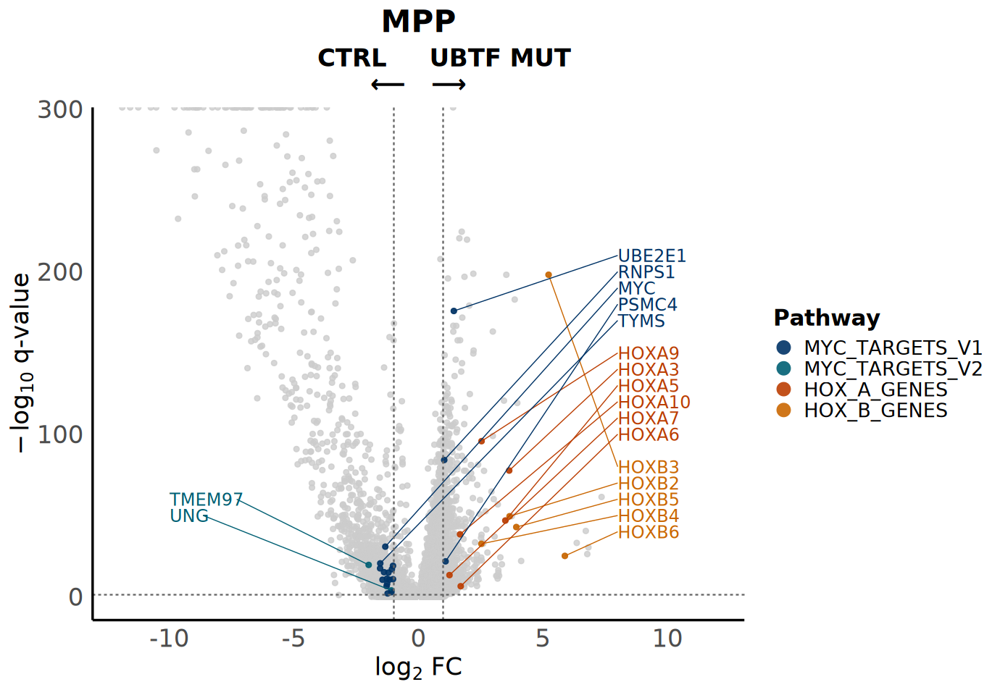

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)
# --- Read CSV ---

# --- Split into a named list by cell type ---
deg_list <- DEG_UBTF_CTRL

# --- Cell types to plot ---
celltypes_to_show <- c("MPP", "CD14+ monocyte", "GMP")

# --- Selected hallmark pathways ---
selected_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1","HALLMARK_MYC_TARGETS_V2","HOX_A_GENES", "HOX_B_GENES"
)

# --- Custom color palette ---
pal_use_man <- c(
  "#003366", "#005F73", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)
#"#0A9396",

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[selected_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = c("HOX_A_GENES", "HOX_B_GENES","HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2"),
  label_x = c(8, 8, 8, -10),
  y_start = c(160, 90, 20, 70),
  y_spacing = c(-10, -10, -10, -10)
)
celltypes_to_show <- c("MPP")
# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top 3 MYC_TARGETS_V1 genes by significance ---
    myc_top1 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V1") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top2 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V2") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # Combine top MYC pathway genes
    myc_top <- bind_rows(myc_top1, myc_top2)

    #sig_other_genes <- deg_df %>%
    #  filter(is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    #sig_other_top <- bind_rows(
    #  sig_other_genes %>% arrange(desc(avg_log2FC), desc(log10_qval)) %>% head(5),
    #  sig_other_genes %>% arrange(avg_log2FC, desc(log10_qval)) %>% head(5)
    #)

    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        #label = paste0(gsub("HALLMARK_", "", pathway), " (", pct, "% ", direction, ")") #to keep LOGFC in figure legend
        label = gsub("HALLMARK_", "", pathway)

      ) %>%
      arrange(desc(pct))

    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)
    valid_pathways <- intersect(
  c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES"),
  concordance_labels$pathway
)
    pathway_colors <- setNames(pal_use_man[1:length(valid_pathways)], valid_pathways)

    label_genes <- c("MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
                     "HOXA6", "HOXB3", "HOXB4", "HOXB5", "HOXB6", "HOXB2", "HOXB7")

    # --- Label positioning ---
    sig_pathway_labeled <- sig_pathway_genes %>%
        filter(gene_label %in% label_genes) %>%
        bind_rows(myc_top) %>%
        distinct(gene_label, .keep_all = TRUE)


    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),  # more accurate estimate
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        )%>%
        ungroup()
    }

    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
    geom_segment(
    data = sig_pathway_labeled,
    aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
    size = 0.3, show.legend = FALSE
    ) +
    geom_text(
    data = sig_pathway_labeled,
    aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
    size = 5, show.legend = FALSE
    ) +
      #geom_text_repel(data = sig_other_top,
      #                aes(x = avg_log2FC, y = log10_qval, label = gene_label),
      #                color = "grey", size = 5, max.overlaps = 100,
      #                box.padding = 0.4, show.legend = FALSE) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = valid_pathways,
        labels = pretty_labels[valid_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "      CTRL     UBTF MUT\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        axis.text.x = element_text(size = 20),
        axis.text.y = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        panel.background = element_blank(),
        axis.line = element_line(color = "black")
      )
    # --- Always label MYC ---
    #myc_label_df <- deg_df %>% filter(gene_label == "MYC")

    #p <- p +
    #  geom_text_repel(
    #    data = myc_label_df,
    #    aes(x = avg_log2FC, y = log10_qval, label = gene_label),
    #    color = "black", size = 5, box.padding = 0.4,
    #    max.overlaps = Inf, show.legend = FALSE
    #  )

    print(p)
  } else {
    warning(paste("\u26A0\uFE0F Skipping", cell, "because no DEP results were found."))
  }
}

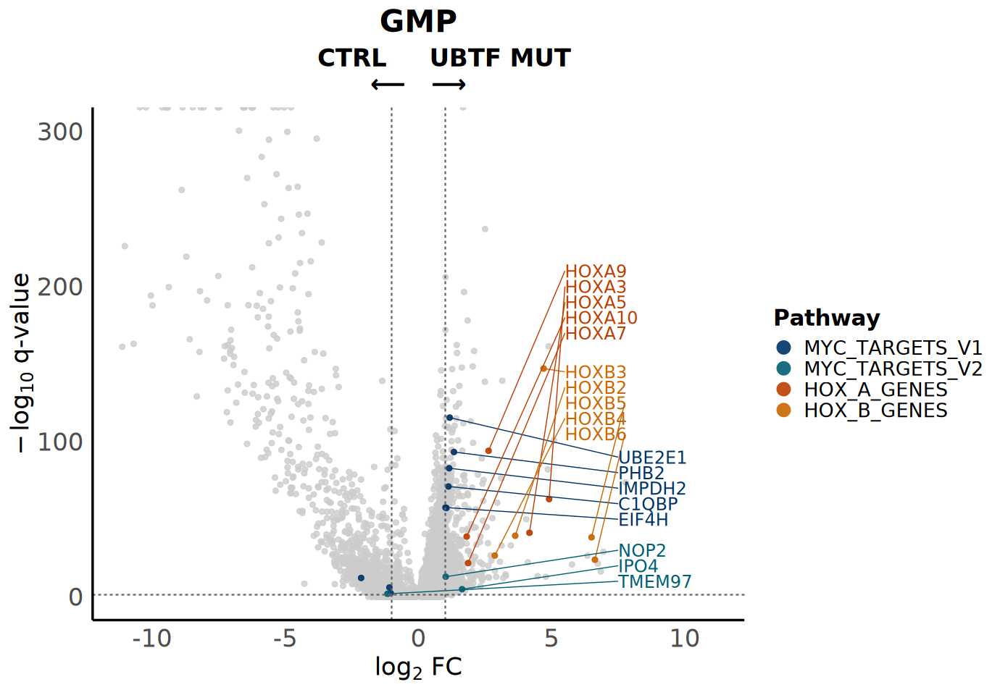

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)
# --- Read CSV ---

# --- Split into a named list by cell type ---
deg_list <- DEG_UBTF_CTRL

# --- Cell types to plot ---
celltypes_to_show <- c("MPP", "CD14+ monocyte", "GMP")

# --- Selected hallmark pathways ---
selected_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1","HALLMARK_MYC_TARGETS_V2","HOX_A_GENES", "HOX_B_GENES"
)

# --- Custom color palette ---
pal_use_man <- c(
  "#003366", "#005F73", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)
#"#0A9396",

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[selected_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = c("HOX_A_GENES", "HOX_B_GENES","HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2"),
  label_x = c(5.5, 5.5, 7.5, 7.5),
  y_start = c(220, 155, 100, 40),
  y_spacing = c(-10, -10, -10, -10)
)
celltypes_to_show <- c("GMP")
# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top 3 MYC_TARGETS_V1 genes by significance ---
    myc_top1 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V1") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top2 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V2") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # Combine top MYC pathway genes
    myc_top <- bind_rows(myc_top1, myc_top2)

    #sig_other_genes <- deg_df %>%
    #  filter(is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    #sig_other_top <- bind_rows(
    #  sig_other_genes %>% arrange(desc(avg_log2FC), desc(log10_qval)) %>% head(5),
    #  sig_other_genes %>% arrange(avg_log2FC, desc(log10_qval)) %>% head(5)
    #)

    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        #label = paste0(gsub("HALLMARK_", "", pathway), " (", pct, "% ", direction, ")") #to keep LOGFC in figure legend
        label = gsub("HALLMARK_", "", pathway)

      ) %>%
      arrange(desc(pct))

    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)
    # Desired legend order
    ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES")

    # Relevel pathway factor
    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)

    # Valid pathways that are actually present
    valid_pathways <- intersect(ordered_pathways, unique(sig_pathway_genes$pathway))

    pathway_colors <- setNames(pal_use_man[1:length(valid_pathways)], valid_pathways)

    label_genes <- c("MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
                     "HOXA6", "HOXB3", "HOXB4", "HOXB5", "HOXB6", "HOXB2", "HOXB7")

    # --- Label positioning ---
    sig_pathway_labeled <- sig_pathway_genes %>%
        filter(gene_label %in% label_genes) %>%
        bind_rows(myc_top) %>%
        distinct(gene_label, .keep_all = TRUE)


    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),  # more accurate estimate
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        )%>%
        ungroup()
    }

    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
    geom_segment(
    data = sig_pathway_labeled,
    aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
    size = 0.3, show.legend = FALSE
    ) +
    geom_text(
    data = sig_pathway_labeled,
    aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
    size = 5, show.legend = FALSE
    ) +
      #geom_text_repel(data = sig_other_top,
      #                aes(x = avg_log2FC, y = log10_qval, label = gene_label),
      #                color = "grey", size = 5, max.overlaps = 100,
      #                box.padding = 0.4, show.legend = FALSE) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = valid_pathways,
        labels = pretty_labels[valid_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "      CTRL     UBTF MUT\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        axis.text.x = element_text(size = 20),
        axis.text.y = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        panel.background = element_blank(),
        axis.line = element_line(color = "black")
      )
    # --- Always label MYC ---
    #myc_label_df <- deg_df %>% filter(gene_label == "MYC")

    #p <- p +
    #  geom_text_repel(
    #    data = myc_label_df,
    #    aes(x = avg_log2FC, y = log10_qval, label = gene_label),
    #   color = "black", size = 5, box.padding = 0.4,
    #    max.overlaps = Inf, show.legend = FALSE
    # )

    print(p)
  } else {
    warning(paste("\u26A0\uFE0F Skipping", cell, "because no DEP results were found."))
  }
}

In [ ]:
## add MHC class I/II genes? immune escape and leukemic stem-like state

## UBTF M vs AML, what sets UBTF apart?

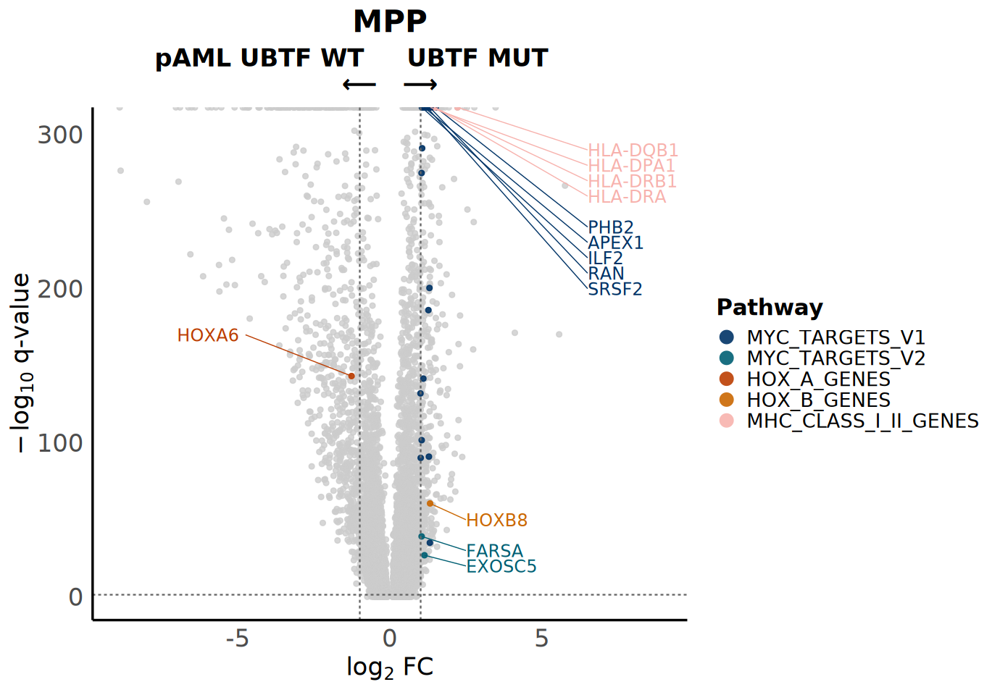

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_UBTF_M_vs_UBTF_W 
celltypes_to_show <- c("MPP")

# --- Selected hallmark pathways ---
selected_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES"
)

# --- Custom color palette ---
pal_use_man <- c(
  "#003366", "#005F73", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[selected_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = c("HOX_A_GENES", "HOX_B_GENES", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "MHC_CLASS_I_II_GENES"),
  label_x = c(-7, 2.5, 6.5, 2.5, 6.5),
  y_start = c(180, 60, 250, 40, 300),
  y_spacing = c(-10, -10, -10, -10, -10)
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    # --- Add top MYC pathway genes ---
    myc_top1 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V1") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top2 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V2") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top <- bind_rows(myc_top1, myc_top2)

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # Combine all top labeled genes from pathways
    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Label positioning ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", "HOXB3", "HOXB4", "HOXB5", "HOXB6", "HOXB2", "HOXB7", "HOXB8"
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(desc(pct))

    ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    valid_pathways <- intersect(ordered_pathways, unique(sig_pathway_genes$pathway))
    pathway_colors <- setNames(pal_use_man[1:length(valid_pathways)], valid_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = valid_pathways,
        labels = pretty_labels[valid_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "pAML UBTF WT     UBTF MUT         \n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

In [ ]:
deg_df %>%
  filter(grepl("^HOXB", gene_label)) %>%
  arrange(p_val_adj)


p_val,avg_log2FC,pct.1,pct.2,p_val_adj,gene,gene_label,log10_qval,pathway
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>
3.683544e-109,-0.7256109,0.270,0.444,1.348214e-104,HOXB4,HOXB4,103.87024,HOX_B_GENES
7.430576e-66,1.3204731,0.183,0.095,2.719665e-61,HOXB8,HOXB8,60.56548,NA
2.767060e-41,0.8954938,0.257,0.183,1.012772e-36,HOXB5,HOXB5,35.99449,HOX_B_GENES
3.499913e-08,-0.1047437,0.300,0.357,1.281003e-03,HOXB2,HOXB2,2.89245,HOX_B_GENES
1.854159e-06,0.1376246,0.689,0.719,6.786408e-02,HOXB3,HOXB3,1.16836,HOX_B_GENES
5.667798e-04,0.3942380,0.164,0.149,1.000000e+00,HOXB9,HOXB9,0.00000,NA
6.664476e-01,0.1836310,0.163,0.173,1.000000e+00,HOXB6,HOXB6,0.00000,HOX_B_GENES


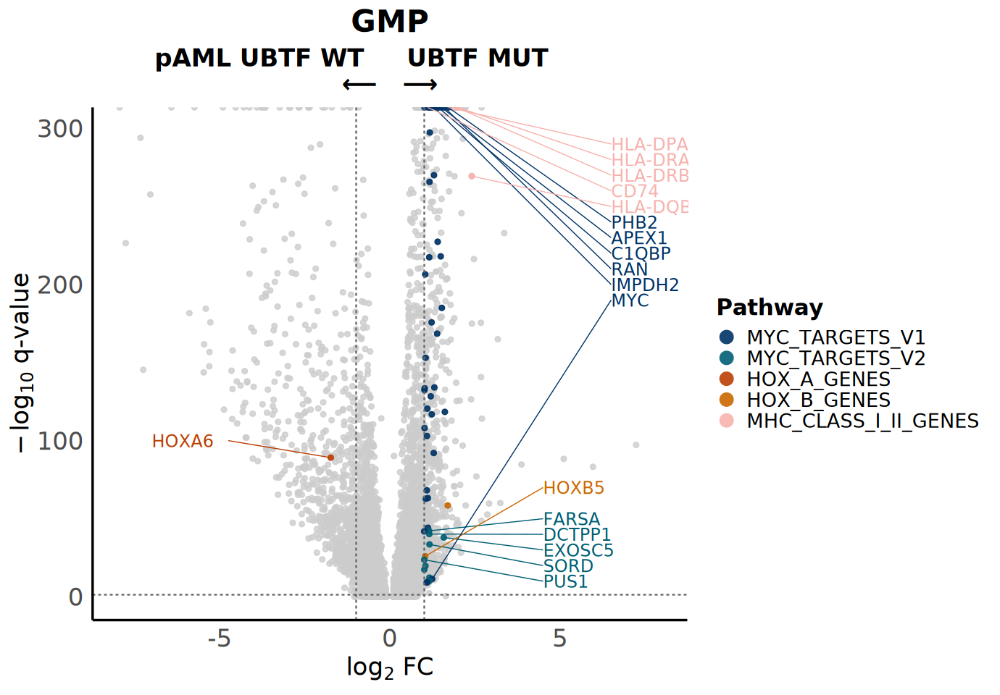

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_UBTF_M_vs_UBTF_W 
celltypes_to_show <- c("GMP")

# --- Selected hallmark pathways ---
selected_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES"
)

# --- Custom color palette ---
pal_use_man <- c(
  "#003366", "#005F73", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[selected_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = c("HOX_A_GENES", "HOX_B_GENES", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "MHC_CLASS_I_II_GENES"),
  label_x = c(-7, 4.5, 6.5, 4.5, 6.5),
  y_start = c(110, 80, 250, 60, 300),
  y_spacing = c(-10, -10, -10, -10, -10)
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    # --- Add top MYC pathway genes ---
    myc_top1 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V1") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top2 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V2") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top <- bind_rows(myc_top1, myc_top2)

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # Combine all top labeled genes from pathways
    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Label positioning ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", "HOXB3", "HOXB4", "HOXB5", "HOXB6", "HOXB2", "HOXB7"
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(desc(pct))

    ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    valid_pathways <- intersect(ordered_pathways, unique(sig_pathway_genes$pathway))
    pathway_colors <- setNames(pal_use_man[1:length(valid_pathways)], valid_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = valid_pathways,
        labels = pretty_labels[valid_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "pAML UBTF WT     UBTF MUT         \n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

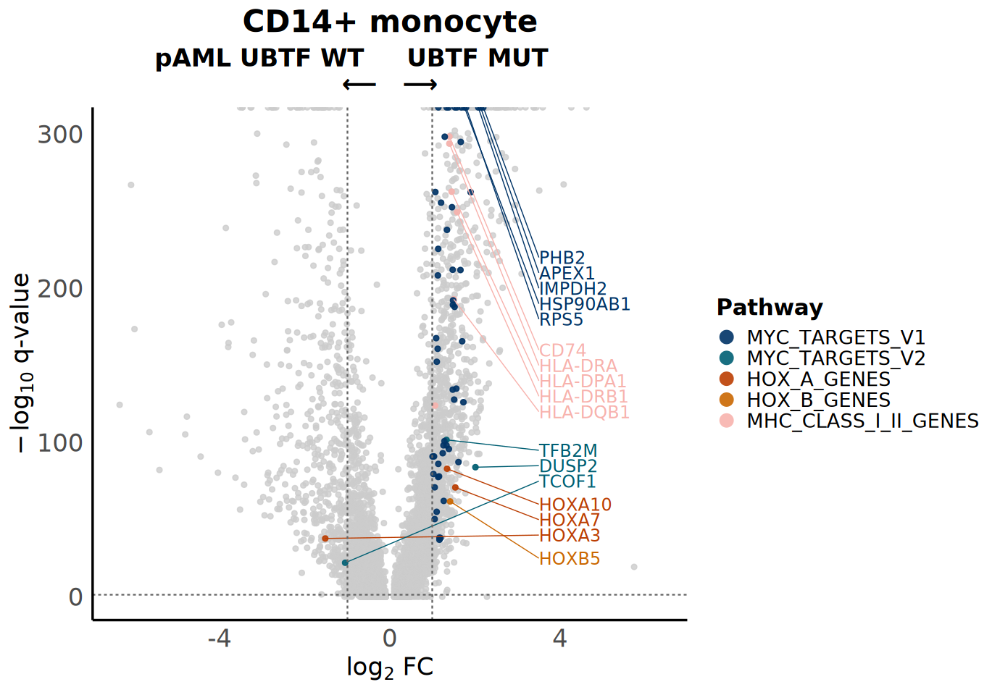

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_UBTF_M_vs_UBTF_W 
celltypes_to_show <- c("CD14+ monocyte")

# --- Selected hallmark pathways ---
selected_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES"
)

# --- Custom color palette ---
pal_use_man <- c(
  "#003366", "#005F73", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[selected_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = c("HOX_A_GENES", "HOX_B_GENES", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "MHC_CLASS_I_II_GENES"),
  label_x = c(3.5, 3.5, 3.5, 3.5, 3.5),
  y_start = c(70, 35, 230, 105, 170),
  y_spacing = c(-10, -10, -10, -10, -10)
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    # --- Add top MYC pathway genes ---
    myc_top1 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V1") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top2 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V2") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top <- bind_rows(myc_top1, myc_top2)

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # Combine all top labeled genes from pathways
    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Label positioning ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", "HOXB3", "HOXB4", "HOXB5", "HOXB6", "HOXB2", "HOXB7"
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(desc(pct))

    ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    valid_pathways <- intersect(ordered_pathways, unique(sig_pathway_genes$pathway))
    pathway_colors <- setNames(pal_use_man[1:length(valid_pathways)], valid_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = valid_pathways,
        labels = pretty_labels[valid_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "pAML UBTF WT     UBTF MUT         \n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

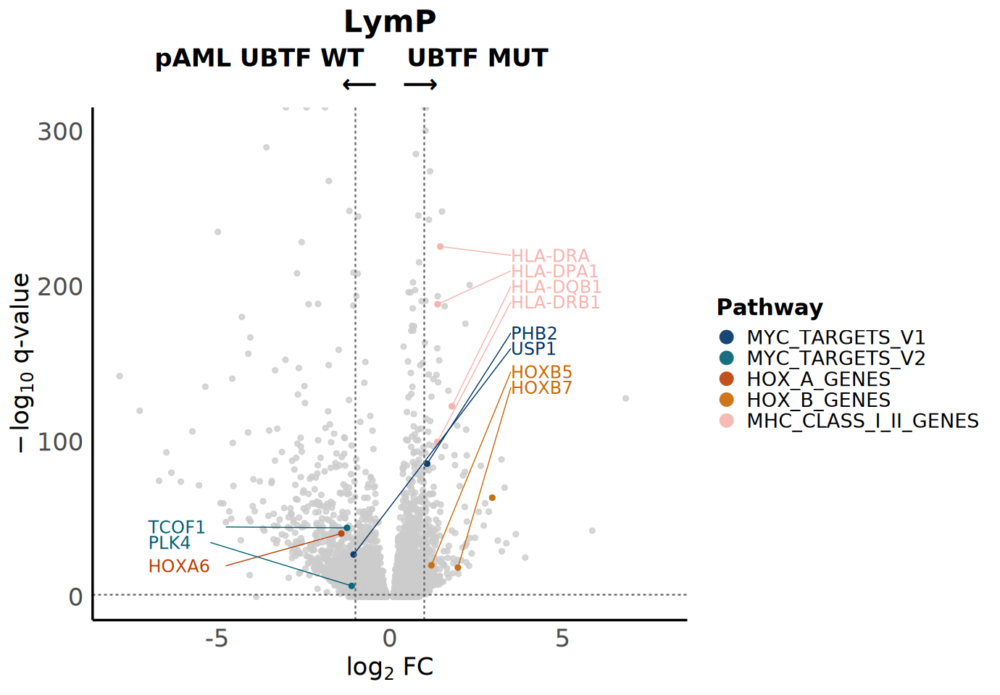

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_UBTF_M_vs_UBTF_W 
celltypes_to_show <- c("LymP")

# --- Selected hallmark pathways ---
selected_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES"
)

# --- Custom color palette ---
pal_use_man <- c(
  "#003366", "#005F73", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[selected_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = c("HOX_A_GENES", "HOX_B_GENES", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "MHC_CLASS_I_II_GENES"),
  label_x = c(-7, 3.5, 3.5, -7, 3.5),
  y_start = c(30, 155, 180, 55, 230),
  y_spacing = c(-10, -10, -10, -10, -10)
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    # --- Add top MYC pathway genes ---
    myc_top1 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V1") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top2 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V2") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top <- bind_rows(myc_top1, myc_top2)

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # Combine all top labeled genes from pathways
    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Label positioning ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", "HOXB3", "HOXB4", "HOXB5", "HOXB6", "HOXB2", "HOXB7"
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(desc(pct))

    ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    valid_pathways <- intersect(ordered_pathways, unique(sig_pathway_genes$pathway))
    pathway_colors <- setNames(pal_use_man[1:length(valid_pathways)], valid_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = valid_pathways,
        labels = pretty_labels[valid_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "pAML UBTF WT     UBTF MUT         \n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

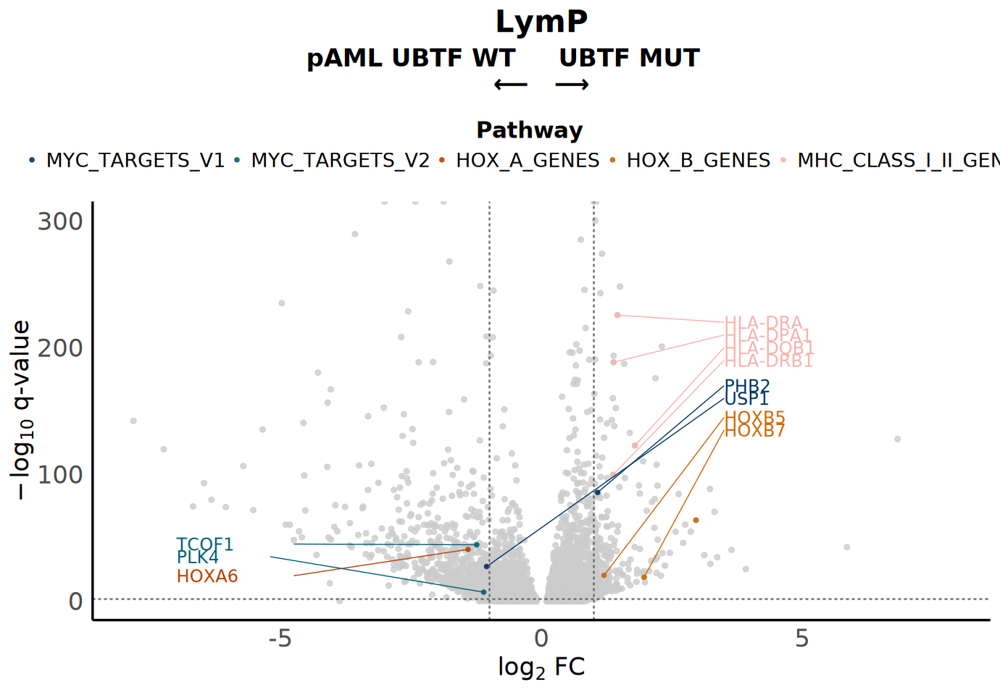

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_UBTF_M_vs_UBTF_W 
celltypes_to_show <- c("LymP")

# --- Selected hallmark pathways ---
selected_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES"
)

# --- Custom color palette ---
pal_use_man <- c(
  "#003366", "#005F73", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[selected_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = c("HOX_A_GENES", "HOX_B_GENES", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "MHC_CLASS_I_II_GENES"),
  label_x = c(-7, 3.5, 3.5, -7, 3.5),
  y_start = c(30, 155, 180, 55, 230),
  y_spacing = c(-10, -10, -10, -10, -10)
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    # --- Add top MYC pathway genes ---
    myc_top1 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V1") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top2 <- sig_pathway_genes %>%
      filter(pathway == "HALLMARK_MYC_TARGETS_V2") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    myc_top <- bind_rows(myc_top1, myc_top2)

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # Combine all top labeled genes from pathways
    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Label positioning ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", "HOXB3", "HOXB4", "HOXB5", "HOXB6", "HOXB2", "HOXB7"
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(desc(pct))

    ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    valid_pathways <- intersect(ordered_pathways, unique(sig_pathway_genes$pathway))
    pathway_colors <- setNames(pal_use_man[1:length(valid_pathways)], valid_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9, shape = 16) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = valid_pathways,
        labels = pretty_labels[valid_pathways],
        name = "Pathway",
        guide = guide_legend(title.position = "top", nrow =1, byrow = TRUE, overide.aes = list(shape = 19, size = 30))
      ) +
      labs(
        title = cell,
        subtitle = "pAML UBTF WT     UBTF MUT         \n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        legend.position = "top",
        legend.title = element_text(size = 18, face = "bold", hjust = 0.5),
        legend.text = element_text(size = 16),
        legend.margin = margin(t = 10, r = 20, b = 10, l = 0),
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black"),
        legend.key.width = unit(0.5, "lines"),
        

      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

#### WT1 co mutations

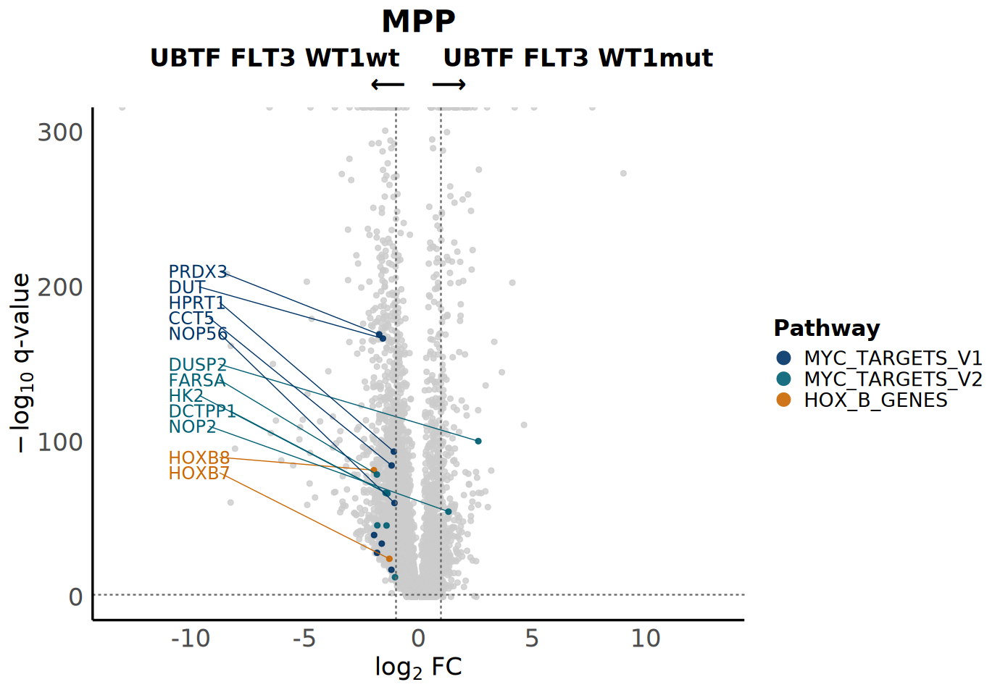

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt
celltypes_to_show <- c("MPP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(-11, -11, -11, -11, 3.5),
  y_start = c(220, 160, 120, 100, 230),
  y_spacing = rep(-10, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

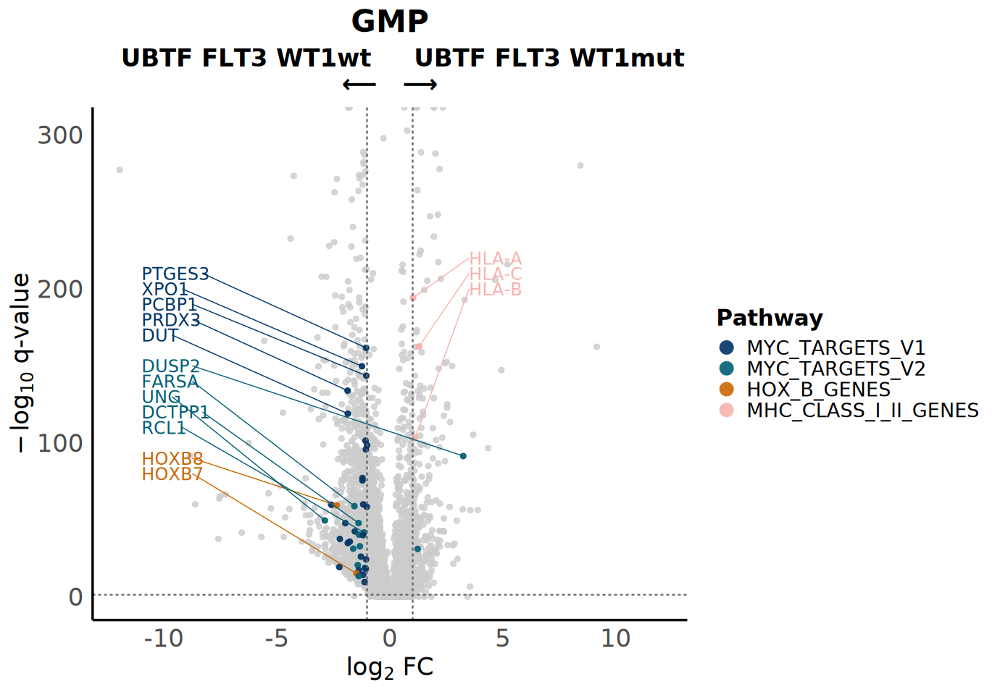

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt
celltypes_to_show <- c("GMP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(-11, -11, -11, -11, 3.5),
  y_start = c(220, 160, 120, 100, 230),
  y_spacing = rep(-10, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

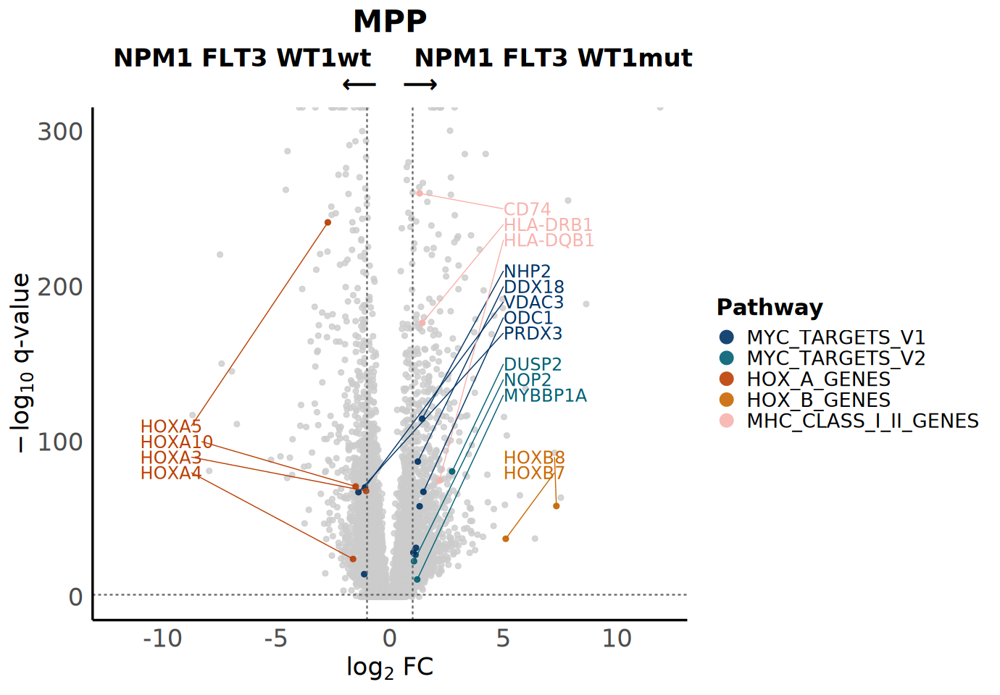

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_NPM1_FLT3_wt1mut_vs_NPM1_FLT3_wt1wt
celltypes_to_show <- c("MPP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(5, 5, -11, 5, 5),
  y_start = c(220, 160, 120, 100, 260),
  y_spacing = rep(-10, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   NPM1 FLT3 WT1wt     NPM1 FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

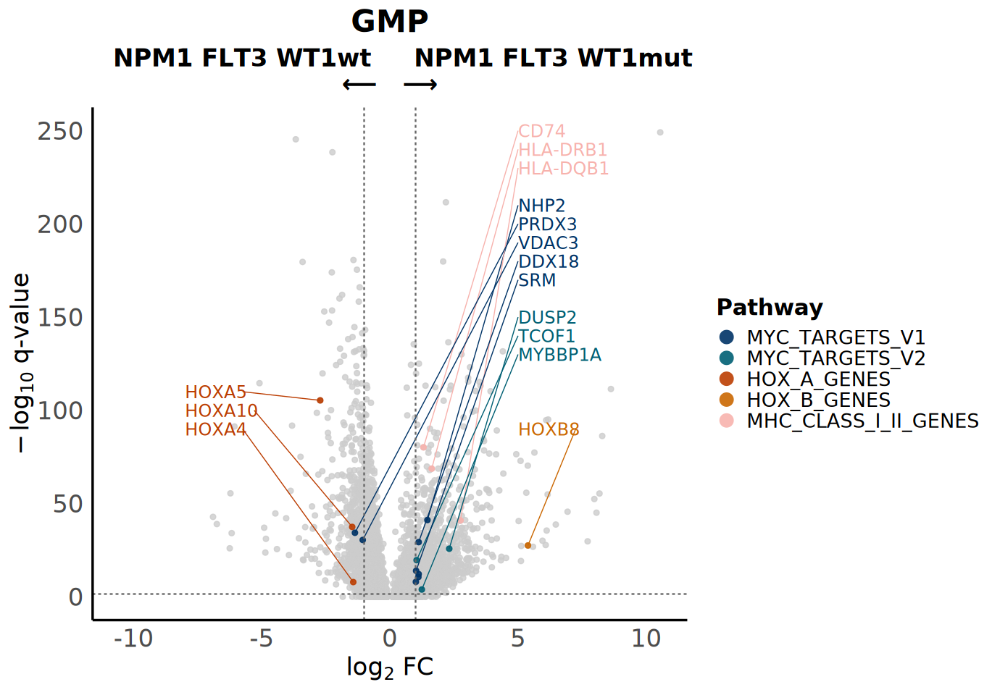

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEG_NPM1_FLT3_wt1mut_vs_NPM1_FLT3_wt1wt
celltypes_to_show <- c("GMP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(5, 5, -8, 5, 5),
  y_start = c(220, 160, 120, 100, 260),
  y_spacing = rep(-10, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   NPM1 FLT3 WT1wt     NPM1 FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

In [ ]:
## heatmap of DE

In [ ]:
# Define thresholds
logfc_cutoff <- 1
pval_cutoff <- 0.05

# Cell types of interest
celltypes_focus <- c("CD14+ monocyte", "LymP", "MEP", "GMP", "MPP", "HSC")

# Filter and extract significant genes
deg_significant <- DEG_UBTF_CTRL[celltypes_focus] %>%
  lapply(function(df) {
    df %>%
      filter(p_val_adj < pval_cutoff, abs(avg_log2FC) >= logfc_cutoff) %>%
      pull(gene) %>%
      unique()
  })

# Remove empty results if any
deg_significant <- deg_significant[lengths(deg_significant) > 0]

# Find shared genes across these cell types
shared_genes <- Reduce(intersect, deg_significant)

# Output
cat("Shared significant genes across selected cell types:", length(shared_genes), "\n")
print(shared_genes)


✅ Shared significant genes across selected cell types: 1 
[1] "CXCL8"


In [ ]:
## significant DEGs in MPPs, top 25 and lowest 25, few selected from each pathway

No legend element is put in the last 1 row under `nrow = 15`, maybe you
should set `by_row = FALSE`? Reset `nrow` to 14.



pdf 
  2

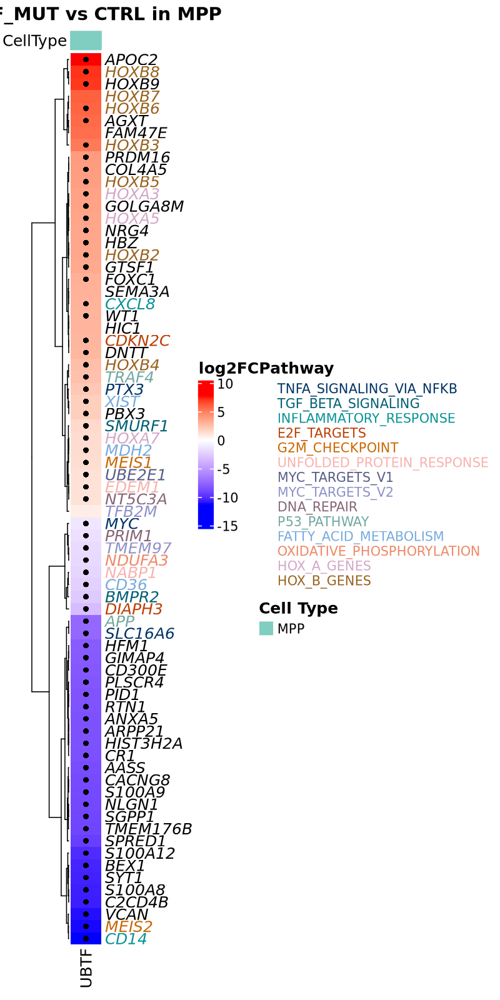

In [ ]:
# === Top annotation for cell type ===
celltype_pal <- c(
  "B" = "#E41A1C", "Pro-B" = "#D7301F", "Plasma cell" = "#B2182B",
  "Plasmablast" = "#8C1515", "Perivascular cell" = "#C49A00",
  "pDC" = "#DC2D8D", "NK" = "#FDDC93", "CD8+ T" = "#7B3294",
  "CD4+ T" = "#9970AB", "Ery" = "#EABC90", "DC precursor" = "#F660B9",
  "cDC2" = "#76168E", "cDC1" = "#C51B7D", "HLA-II+ monocyte" = "#E66101",
  "CD16+ monocyte" = "#F4A582", "CD14+ monocyte" = "#FDDBC7",
  "CD11c+" = "#D6604D", "LymP" = "#2166AC", "MEP" = "#4393C3",
  "Granulocyte" = "#D73027", "GMP" = "#3DC0BE", "MPP" = "#80CDC1",
  "HSC" = "#A6DBA0"
)
yarg
# Legend for cell types
celltype_legend <- Legend(
  title = "Cell Type",
  at = "MPP",
  labels = "MPP",
  legend_gp = gpar(fill = celltype_pal["MPP"]),
  title_gp = gpar(fontsize = 12, fontface = "bold")
)


# === Selected Pathways ===
selected_pathways <- c(
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB", 
  "HALLMARK_TGF_BETA_SIGNALING", 
  "HALLMARK_INFLAMMATORY_RESPONSE", 
  "HALLMARK_E2F_TARGETS",  
  "HALLMARK_G2M_CHECKPOINT",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE",
  "HALLMARK_MYC_TARGETS_V1",
  "HALLMARK_MYC_TARGETS_V2",
  "HALLMARK_DNA_REPAIR",
  "HALLMARK_P53_PATHWAY",
  "HALLMARK_FATTY_ACID_METABOLISM",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION",
  "HOX_A_GENES",
  "HOX_B_GENES"
)

# === Custom palette ===
pal_use_man <- c(
  "#003366", "#005F73", "#0A9396", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)
names(pal_use_man) <- gsub("HALLMARK_", "", selected_pathways)

# === Build gene to pathway mapping ===
gene_to_pathway <- lapply(selected_pathways, function(pathway) {
  genes <- gene_sets[[pathway]]
  setNames(rep(pathway, length(genes)), genes)
}) |> unlist()

# === Extract and clean MPP DEGs ===
deg_mpp <- DEG_UBTF_FLT3_wt1wt_CTRL[["MPP"]] %>%
  distinct(gene, .keep_all = TRUE) %>%
  filter(!is.na(avg_log2FC), !is.na(p_val_adj), p_val_adj < 0.05) %>%
  filter(!grepl("^AC[0-9]+\\.|^AL[0-9]+\\.|^LINC|orf|\\.|\\-|DT$", gene))

# === Get top 25 up and downregulated ===
top_up <- deg_mpp %>% filter(avg_log2FC > 0) %>% arrange(desc(avg_log2FC)) %>% slice_head(n = 25)
top_down <- deg_mpp %>% filter(avg_log2FC < 0) %>% arrange(avg_log2FC) %>% slice_head(n = 25)

# === Add 1 gene per pathway with top + and - log2FC ===
pathway_genes_df <- lapply(selected_pathways, function(pw) {
  pathway_genes <- gene_sets[[pw]]
  matched <- deg_mpp %>% filter(gene %in% pathway_genes)
  if (nrow(matched) == 0) return(NULL)
  bind_rows(
    matched %>% arrange(desc(avg_log2FC)) %>% slice_head(n = 1),
    matched %>% arrange(avg_log2FC) %>% slice_head(n = 1)
  )
}) %>% bind_rows()

# === Combine unique genes ===
selected_genes <- bind_rows(top_up, top_down, pathway_genes_df) %>%
  distinct(gene, .keep_all = TRUE)

# === Force include MYC, MEIS1, PRDM16, PBX3 ===
forced_genes <- c("MYC", "MEIS1", "PRDM16", "PBX3")
forced_gene_rows <- DEG_UBTF_CTRL[["MPP"]] %>%
  filter(gene %in% forced_genes) %>%
  distinct(gene, .keep_all = TRUE)

selected_genes <- bind_rows(
  selected_genes,
  forced_gene_rows %>% filter(!gene %in% selected_genes$gene)
)

# === Build matrix ===
avg_df <- selected_genes %>%
  dplyr::select(gene, avg_log2FC) %>%
  as.data.frame()

rownames(avg_df) <- avg_df$gene
avg_df$gene <- NULL
avg_matrix <- as.matrix(avg_df)
colnames(avg_matrix) <- "UBTF"

# Top annotation (just 1 column, labeled as MPP)
top_annot <- HeatmapAnnotation(
  CellType = anno_simple(
    rep("MPP", ncol(avg_matrix)),
    col = celltype_pal,  
    border = FALSE
  ),
  show_annotation_name = TRUE,
  annotation_name_side = "left"
)

# === Assign pathway label and color ===
gene_pathways <- gene_to_pathway[rownames(avg_matrix)]
gene_pathways_clean <- gsub("HALLMARK_", "", gene_pathways)
label_colors <- pal_use_man[gene_pathways_clean]
label_colors[is.na(label_colors)] <- "black"

# === Row annotation ===
row_names_style <- gpar(fontface = "italic", col = label_colors)

# === Pathway legend ===
pathway_legend <- Legend(
  labels = names(pal_use_man),
  title = "Pathway",
  legend_gp = gpar(col = pal_use_man),
  labels_gp = gpar(col = pal_use_man),
  title_gp = gpar(fontsize = 12, fontface = "bold"),
  ncol = 1
)
# === Precompute which genes are significant
sig_genes <- DEG_UBTF_CTRL[["MPP"]] %>%
  filter(!is.na(avg_log2FC), !is.na(p_val_adj)) %>%
  filter(p_val_adj < 0.05 & abs(avg_log2FC) >= 1) %>%
  pull(gene)

# === Create a binary significance vector for fast lookup
is_sig <- rownames(avg_matrix) %in% sig_genes
names(is_sig) <- rownames(avg_matrix)

# === Heatmap ===
ht <- Heatmap(
  avg_matrix,
  name = "log2FC",
  col = colorRamp2(c(min(avg_matrix), 0, max(avg_matrix)), c("blue", "white", "red")),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  show_column_names = TRUE,
  show_row_names = TRUE,
  row_names_gp = row_names_style,
  column_title = "UBTF_MUT vs CTRL in MPP",
  column_title_gp = gpar(fontsize = 14, fontface = "bold"),
  top_annotation = top_annot,
  heatmap_legend_param = list(
    title = "log2FC",
    title_gp = gpar(fontsize = 12, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    gene_name <- rownames(avg_matrix)[i]
    if (is_sig[gene_name]) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

# === Display & Save ===
png("heatmap_complex_pathway_labels.png", width = 800, height = 1600, res = 150)
draw(
  ht,
  annotation_legend_list = list(pathway_legend, celltype_legend),
  heatmap_legend_side = "right",
  annotation_legend_side = "right"
)
dev.off()

IRdisplay::display_png(file = "heatmap_complex_pathway_labels.png")

In [ ]:
# Print the gene names used on the y-axis (rows of the heatmap)
print(rownames(avg_matrix))


 [1] "APOC2"    "HOXB8"    "HOXB9"    "HOXB7"    "HOXB6"    "AGXT"    
 [7] "FAM47E"   "HOXB3"    "PRDM16"   "COL4A5"   "HOXB5"    "HOXA3"   
[13] "GOLGA8M"  "HOXA5"    "NRG4"     "HBZ"      "HOXB2"    "GTSF1"   
[19] "FOXC1"    "SEMA3A"   "CXCL8"    "WT1"      "HIC1"     "CDKN2C"  
[25] "DNTT"     "CD14"     "MEIS2"    "VCAN"     "C2CD4B"   "S100A8"  
[31] "SYT1"     "BEX1"     "S100A12"  "SPRED1"   "TMEM176B" "SGPP1"   
[37] "NLGN1"    "S100A9"   "CACNG8"   "AASS"     "CR1"      "HIST3H2A"
[43] "ARPP21"   "ANXA5"    "RTN1"     "PID1"     "PLSCR4"   "CD300E"  
[49] "GIMAP4"   "HFM1"     "PTX3"     "SLC16A6"  "SMURF1"   "BMPR2"   
[55] "DIAPH3"   "EDEM1"    "NABP1"    "UBE2E1"   "MYC"      "TFB2M"   
[61] "TMEM97"   "NT5C3A"   "PRIM1"    "TRAF4"    "APP"      "XIST"    
[67] "CD36"     "MDH2"     "NDUFA3"   "HOXA7"    "HOXB4"    "PBX3"    
[73] "MEIS1"   


In [ ]:
## expanding out into different cell types

In [ ]:
# Force assign HOXB* genes to HOX_B_GENES
hoxb_genes <- grep("^HOXB", rownames(avg_matrix_multi), value = TRUE)
gene_to_pathway[hoxb_genes] <- "HOX_B_GENES"

In [ ]:
mutation_group_colors <- c(
  "CTRL"             = "grey",
  "UBTF_FLT3"        = "#98c1d9",
  "UBTF_FLT3_WT1"    = "#355070",
  "WT1_NPM1"         = "#eaac8b",
  "WT1_NPM1_FLT3"    = "#f3722c",
  "NPM1_FLT3"        = "#b56576",
  "NPM1_only"        = "#e56b6f",
  "Other"            = "white"
)

In [ ]:
# Full pathway-to-color mapping (used in heatmap)
pal_use_man <- c(
  # Inflammation / Immune
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB"       = "#a50026",
  "HALLMARK_TGF_BETA_SIGNALING"            = "#d73027",
  "HALLMARK_INFLAMMATORY_RESPONSE"         = "#f46d43",

  #Proliferation / Cell Cycle
  "HALLMARK_E2F_TARGETS"                   = "#FDAE61",
  "HALLMARK_G2M_CHECKPOINT"                = "#FEE08B",

  #Stress / Apoptosis / Proteostasis
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE"     = "#A6D96A",
  "HALLMARK_P53_PATHWAY"                   = "#66BD63",

  #DNA / Repair
  "HALLMARK_DNA_REPAIR"                    = "#3288BD",

  #MYC targets (match pathway_colors)
  "HALLMARK_MYC_TARGETS_V1"                = "#003366",
  "HALLMARK_MYC_TARGETS_V2"                = "#005F73",

  #Metabolism / Mitochondria
  "HALLMARK_FATTY_ACID_METABOLISM"         = "#ABDDA4",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION"     = "#E6F598",

  #HOX genes (match pathway_colors)
  "HOX_A_GENES"                            = "#BB3E03",
  "HOX_B_GENES"                            = "#CA6702",

  #MHC Class I/II
  "MHC_CLASS_I_II_GENES"                   = "#F7B2AD"
)

No legend element is put in the last 12 rows under `nrow = 15`, maybe
you should set `by_row = FALSE`? Reset `nrow` to 3.



pdf 
  2

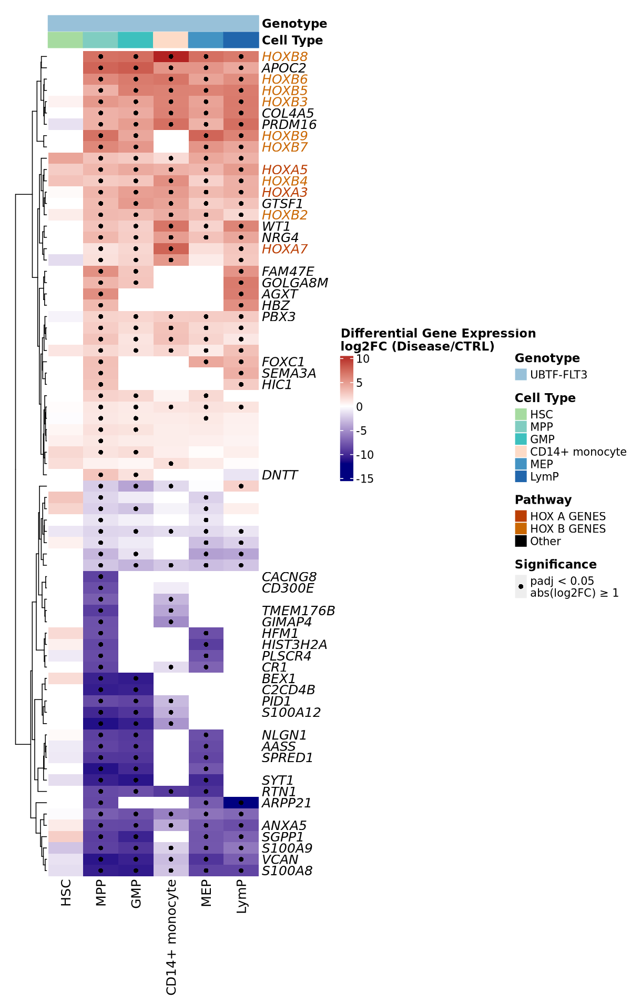

In [ ]:
# === Cell types to include
celltypes_use <- c("HSC", "MPP", "GMP", "CD14+ monocyte","MEP", "LymP")

# === Reuse selected_genes from previous step
gene_list <- unique(selected_genes$gene)

# === Merge log2FC values across cell types
avg_df_all <- DEG_UBTF_FLT3_wt1wt_CTRL[[celltypes_use[1]]] %>%
  filter(gene %in% gene_list) %>%
  distinct(gene, .keep_all = TRUE) %>%
  dplyr::select(gene, avg_log2FC) %>%
  rename(!!celltypes_use[1] := avg_log2FC)

for (ct in celltypes_use[-1]) {
  df <- DEG_UBTF_FLT3_wt1wt_CTRL[[ct]] %>%
    filter(gene %in% gene_list) %>%
    distinct(gene, .keep_all = TRUE) %>%
    dplyr::select(gene, avg_log2FC) %>%
    rename(!!ct := avg_log2FC)
  
  avg_df_all <- full_join(avg_df_all, df, by = "gene")
}

# === Convert to matrix
avg_df_all <- column_to_rownames(avg_df_all, "gene")
avg_df_all[is.na(avg_df_all)] <- 0
avg_df_all <- avg_df_all[gene_list, ]
avg_matrix_multi <- as.matrix(avg_df_all)

# === Top annotation for cell types
top_annot_multi <- HeatmapAnnotation(
  "Genotype" = anno_simple(
    rep("UBTF", ncol(avg_matrix_multi)),
    col = c("UBTF" = "#98c1d9"),
    border = FALSE
  ),
  "Cell Type" = anno_simple(
    colnames(avg_matrix_multi),
    col = celltype_pal,
    border = FALSE
  ),
  show_annotation_name = TRUE,
  annotation_name_side = "right",
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold")
)


# === Pathway mapping and coloring
gene_pathways <- gene_to_pathway[rownames(avg_matrix_multi)]
gene_pathways_clean <- gsub("HALLMARK_", "", gene_pathways)
gene_pathways_clean[is.na(gene_pathways_clean)] <- "Other"
gene_pathways_clean <- factor(gene_pathways_clean)

# Assign pathway colors (include "Other")
all_pathways <- levels(gene_pathways_clean)
color_pathways <- all_pathways[all_pathways != "Other"]
label_colors <- pal_use_man[color_pathways]
label_colors["Other"] <- "black"

# Gene name color mapping
gene_label_colors <- label_colors[as.character(gene_pathways_clean)]
names(gene_label_colors) <- rownames(avg_matrix_multi)

# === Create pathway legend (with underscores removed)
pathway_legend <- Legend(
  title = "Pathway",
  at = names(label_colors),
  labels = gsub("_", " ", names(label_colors)),  # 🔹 This line removes underscores
  legend_gp = gpar(fill = label_colors),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

# === Create cell type legend (only included types)
celltype_legend <- Legend(
  title = "Cell Type",
  at = celltypes_use,
  labels = celltypes_use,
  legend_gp = gpar(fill = celltype_pal[celltypes_use]),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

# === Identify significant genes per cell type (matrix)
sig_matrix <- sapply(celltypes_use, function(ct) {
  sig_genes <- DEG_UBTF_FLT3_wt1wt_CTRL[[ct]] %>%
    filter(!is.na(avg_log2FC), !is.na(p_val_adj)) %>%
    filter(p_val_adj < 0.05 & abs(avg_log2FC) >= 1) %>%
    pull(gene)
  rownames(avg_matrix_multi) %in% sig_genes
})
rownames(sig_matrix) <- rownames(avg_matrix_multi)

# === Main heatmap
ht_multi <- Heatmap(
  avg_matrix_multi,
  name = "log2FC",
  col = colorRamp2(
    c(min(avg_matrix_multi), 0, max(avg_matrix_multi)),
    c("navy", "white", "firebrick")
  ),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  show_column_names = TRUE,
  show_row_names = TRUE,
  row_names_side = "right",
  row_names_gp = gpar(
    col = gene_label_colors,
    fontface = "italic"
  ),
  column_title = "",
  column_title_gp = gpar(fontsize = 11, fontface = "bold"),
  top_annotation = top_annot_multi,
  heatmap_legend_param = list(
    title = "Differential Gene Expression \nlog2FC (Disease/CTRL)",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (sig_matrix[i, j]) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

# Create a blank spacer legend (no padding argument)
spacer_legend <- Legend(
  title = NULL,
  at = "",  # blank label
  labels = "",
  legend_gp = gpar(fill = NA, col = NA),
  title_gp = gpar(fontsize = 1),
  labels_gp = gpar(fontsize = 1)
)

mutation_legend <- Legend(
  title = "Genotype",
  at = c("UBTF"),
  labels = c("UBTF-FLT3"),
  legend_gp = gpar(fill = c("UBTF" = "#98c1d9")),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)
# === Significance legend (black dot)
significance_legend <- Legend(
  title = "Significance",
  legend_gp = gpar(col = "black"),
  type = "points",
  pch = 16,
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

png("heatmap_complex_pathway_labels.png", width = 1200, height = 1900, res = 150)
draw(
  ht_multi,
  annotation_legend_list = list(spacer_legend, mutation_legend, celltype_legend, pathway_legend, significance_legend),
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  padding = unit(c(5, 5, 5, 5), "mm")
)
dev.off()

IRdisplay::display_png(file = "heatmap_complex_pathway_labels.png")

pdf 
  2

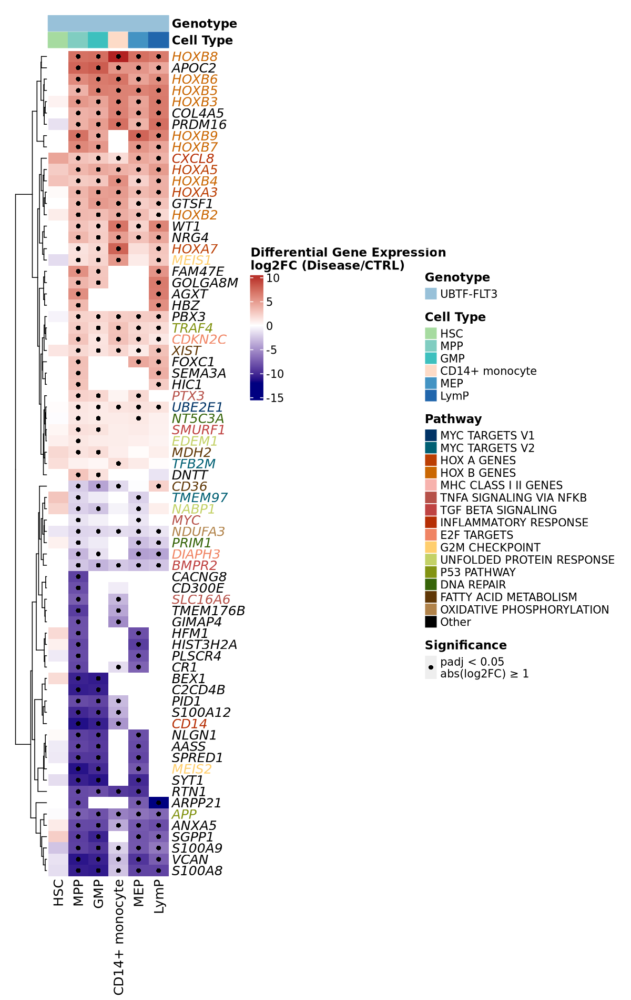

In [ ]:
# === Cell types to include
celltypes_use <- c("HSC", "MPP", "GMP", "CD14+ monocyte","MEP", "LymP")

# === Reuse selected_genes from previous step
gene_list <- unique(selected_genes$gene)

# === Merge log2FC values across cell types
avg_df_all <- DEG_UBTF_FLT3_wt1wt_CTRL[[celltypes_use[1]]] %>%
  filter(gene %in% gene_list) %>%
  distinct(gene, .keep_all = TRUE) %>%
  dplyr::select(gene, avg_log2FC) %>%
  rename(!!celltypes_use[1] := avg_log2FC)

for (ct in celltypes_use[-1]) {
  df <- DEG_UBTF_FLT3_wt1wt_CTRL[[ct]] %>%
    filter(gene %in% gene_list) %>%
    distinct(gene, .keep_all = TRUE) %>%
    dplyr::select(gene, avg_log2FC) %>%
    rename(!!ct := avg_log2FC)

  avg_df_all <- full_join(avg_df_all, df, by = "gene")
}

# === Convert to matrix
avg_df_all <- column_to_rownames(avg_df_all, "gene")
avg_df_all[is.na(avg_df_all)] <- 0
avg_df_all <- avg_df_all[gene_list, ]
avg_matrix_multi <- as.matrix(avg_df_all)

# === Top annotation for cell types
top_annot_multi <- HeatmapAnnotation(
  "Genotype" = anno_simple(
    rep("UBTF", ncol(avg_matrix_multi)),
    col = c("UBTF" = "#98c1d9"),
    border = FALSE
  ),
  "Cell Type" = anno_simple(
    colnames(avg_matrix_multi),
    col = celltype_pal,
    border = FALSE
  ),
  show_annotation_name = TRUE,
  annotation_name_side = "right",
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Manual named color mapping (ordered)
pal_use_man <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES" = "#BB3E03",
  "HOX_B_GENES" = "#CA6702",
  "MHC_CLASS_I_II_GENES" = "#F7B2AD",
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB" = "#b65149",
  "HALLMARK_TGF_BETA_SIGNALING" = "#bf4342",
  "HALLMARK_INFLAMMATORY_RESPONSE" = "#B62E04",
  "HALLMARK_E2F_TARGETS" = "#F08463",
  "HALLMARK_G2M_CHECKPOINT" = "#FFCE6D",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE" = "#C3D166",
  "HALLMARK_P53_PATHWAY" = "#829312",
  "HALLMARK_DNA_REPAIR" = "#366408",
  "HALLMARK_FATTY_ACID_METABOLISM" = "#5F3706",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION" = "#B1834A"
)

# === Pathway mapping and coloring
gene_pathways <- gene_to_pathway[rownames(avg_matrix_multi)]
gene_pathways[is.na(gene_pathways)] <- "Other"

# Use original keys in pal_use_man
label_colors <- pal_use_man
label_colors["Other"] <- "black"

# Map pathway to color
gene_label_colors <- label_colors[gene_pathways]
names(gene_label_colors) <- rownames(avg_matrix_multi)


# Set order based on pal_use_man (ensures legend follows this order)
ordered_pathways <- names(pal_use_man)
ordered_colors <- pal_use_man

# Add "Other" if not already there
if (!"Other" %in% ordered_pathways) {
  ordered_pathways <- c(ordered_pathways, "Other")
  ordered_colors["Other"] <- "black"
}

pathway_legend <- Legend(
  title = "Pathway",
  at = ordered_pathways,
  labels = gsub("_", " ", gsub("HALLMARK_", "", ordered_pathways)),
  legend_gp = gpar(fill = ordered_colors[ordered_pathways]),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

celltype_legend <- Legend(
  title = "Cell Type",
  at = celltypes_use,
  labels = celltypes_use,
  legend_gp = gpar(fill = celltype_pal[celltypes_use]),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

sig_matrix <- sapply(celltypes_use, function(ct) {
  sig_genes <- DEG_UBTF_FLT3_wt1wt_CTRL[[ct]] %>%
    filter(!is.na(avg_log2FC), !is.na(p_val_adj)) %>%
    filter(p_val_adj < 0.05 & abs(avg_log2FC) >= 1) %>%
    pull(gene)
  rownames(avg_matrix_multi) %in% sig_genes
})
rownames(sig_matrix) <- rownames(avg_matrix_multi)

ht_multi <- Heatmap(
  avg_matrix_multi,
  name = "log2FC",
  col = colorRamp2(
    c(min(avg_matrix_multi), 0, max(avg_matrix_multi)),
    c("navy", "white", "firebrick")
  ),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  show_column_names = TRUE,
  show_row_names = TRUE,
  row_names_side = "right",
  row_names_gp = gpar(col = gene_label_colors, fontface = "italic"),
  column_title = "",
  column_title_gp = gpar(fontsize = 11, fontface = "bold"),
  top_annotation = top_annot_multi,
  heatmap_legend_param = list(
    title = "Differential Gene Expression \nlog2FC (Disease/CTRL)",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (sig_matrix[i, j]) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

spacer_legend <- Legend(
  title = NULL,
  at = "",
  labels = "",
  legend_gp = gpar(fill = NA, col = NA),
  title_gp = gpar(fontsize = 1),
  labels_gp = gpar(fontsize = 1)
)

mutation_legend <- Legend(
  title = "Genotype",
  at = c("UBTF"),
  labels = c("UBTF-FLT3"),
  legend_gp = gpar(fill = c("UBTF" = "#98c1d9")),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

significance_legend <- Legend(
  title = "Significance",
  legend_gp = gpar(col = "black"),
  type = "points",
  pch = 16,
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

png("heatmap_complex_pathway_labels.png", width = 1200, height = 1900, res = 150)
draw(
  ht_multi,
  annotation_legend_list = list(spacer_legend, mutation_legend, celltype_legend, pathway_legend, significance_legend),
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  padding = unit(c(5, 5, 5, 5), "mm")
)
dev.off()

IRdisplay::display_png(file = "heatmap_complex_pathway_labels.png")

In [ ]:
## keeping the same genes as above, adding other mutation groups 

In [14]:
mutation_group_colors <- c(
  "CTRL"             = "grey",
  "UBTF_FLT3"        = "#98c1d9",
  "UBTF_FLT3_WT1"    = "#355070",
  "WT1_NPM1"         = "#eaac8b",
  "WT1_NPM1_FLT3"    = "#f3722c",
  "NPM1_FLT3"        = "#b56576",
  "NPM1_only"        = "#e56b6f",
  "Other"            = "white"
)

pdf 
  2

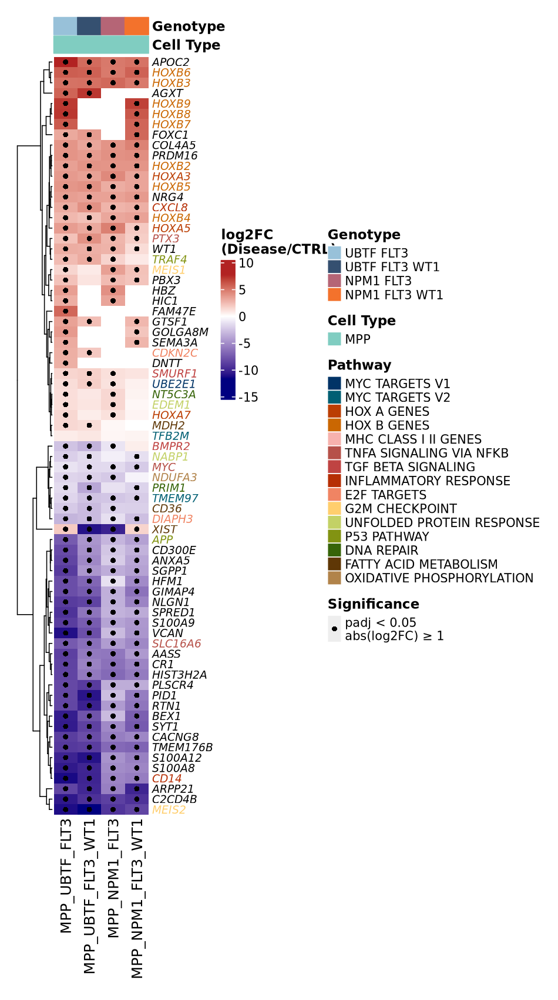

In [ ]:
## ---- parameters ----
celltypes_use   <- c("MPP")
gene_list       <- unique(selected_genes$gene)
gene_list_all   <- gene_list

DEG_lists <- list(
  UBTF_FLT3      = DEG_UBTF_FLT3_wt1wt_CTRL,
  UBTF_FLT3_WT1  = DEG_UBTF_FLT3_wt1mut_CTRL,
  NPM1_FLT3      = DEG_NPM1_FLT3_wt1wt_CTRL,
  NPM1_FLT3_WT1  = DEG_NPM1_FLT3_wt1mut_CTRL
)

mutation_colors <- c(
  UBTF_FLT3      = "#98c1d9",
  UBTF_FLT3_WT1  = "#355070",
  NPM1_FLT3      = "#b56576",
  NPM1_FLT3_WT1  = "#f3722c"
)

default_ct_col <- "grey80"

## ---- manual pathway color mapping ----
pal_use_man <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES" = "#BB3E03",
  "HOX_B_GENES" = "#CA6702",
  "MHC_CLASS_I_II_GENES" = "#F7B2AD",
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB" = "#b65149",
  "HALLMARK_TGF_BETA_SIGNALING" = "#bf4342",
  "HALLMARK_INFLAMMATORY_RESPONSE" = "#B62E04",
  "HALLMARK_E2F_TARGETS" = "#F08463",
  "HALLMARK_G2M_CHECKPOINT" = "#FFCE6D",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE" = "#C3D166",
  "HALLMARK_P53_PATHWAY" = "#829312",
  "HALLMARK_DNA_REPAIR" = "#366408",
  "HALLMARK_FATTY_ACID_METABOLISM" = "#5F3706",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION" = "#B1834A"
)

## ---- construct unified matrix ----
combined_df <- NULL
combined_sig <- NULL
colnames_list <- c()

for (group_name in names(DEG_lists)) {
  DEG <- DEG_lists[[group_name]]

  for (ct in celltypes_use) {
    colname <- paste(ct, group_name, sep = "_")
    df_ct <- DEG[[ct]] %>%
      filter(gene %in% gene_list_all) %>%
      distinct(gene, .keep_all = TRUE) %>%
      dplyr::select(gene, avg_log2FC, p_val_adj) %>%
      mutate(sig = p_val_adj < 0.05 & abs(avg_log2FC) >= 1) %>%
      dplyr::select(gene, avg_log2FC, sig)

    df_expr <- df_ct %>% dplyr::select(gene, avg_log2FC) %>% rename(!!colname := avg_log2FC)
    df_sig <- df_ct %>% dplyr::select(gene, sig) %>% rename(!!colname := sig)

    combined_df <- if (is.null(combined_df)) df_expr else full_join(combined_df, df_expr, by = "gene")
    combined_sig <- if (is.null(combined_sig)) df_sig else full_join(combined_sig, df_sig, by = "gene")

    colnames_list <- c(colnames_list, colname)
  }
}

combined_df <- combined_df %>%
  right_join(tibble(gene = gene_list_all), by = "gene") %>%
  distinct(gene, .keep_all = TRUE) %>%
  replace(is.na(.), 0) %>%
  column_to_rownames("gene")

combined_sig <- combined_sig %>%
  right_join(tibble(gene = gene_list_all), by = "gene") %>%
  distinct(gene, .keep_all = TRUE) %>%
  mutate(across(everything(), ~replace(., is.na(.), FALSE))) %>%
  column_to_rownames("gene")

avg_matrix <- as.matrix(combined_df)
sig_matrix <- as.matrix(combined_sig)

## ---- gene label coloring ----
gene_pathways <- gene_to_pathway[rownames(avg_matrix)]
gene_pathways[is.na(gene_pathways)] <- "Other"
gene_label_colors <- pal_use_man[gene_pathways]
gene_label_colors[is.na(gene_label_colors)] <- "black"
names(gene_label_colors) <- rownames(avg_matrix)

## ---- annotation ----
col_ct <- sapply(strsplit(colnames(avg_matrix), "_"), `[`, 1)
col_group <- sapply(strsplit(colnames(avg_matrix), "_", fixed = TRUE), function(x) paste(x[-1], collapse = "_"))
col_group_display <- gsub("_", " ", col_group)

celltype_colors <- celltype_pal[celltypes_use]
celltype_colors[is.na(celltype_colors)] <- default_ct_col

top_annot <- HeatmapAnnotation(
  "Genotype" = anno_simple(col_group_display, col = setNames(mutation_colors, gsub("_", " ", names(mutation_colors)))),
  "Cell Type" = anno_simple(col_ct, col = celltype_colors),
  show_annotation_name = TRUE,
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold"),
  annotation_name_side = "right"
)

## ---- build heatmap ----
ht <- Heatmap(
  avg_matrix,
  name = "log2FC",
  col = colorRamp2(c(min(avg_matrix), 0, max(avg_matrix)), c("navy", "white", "firebrick")),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  show_column_names = TRUE,
  show_row_names = TRUE,
  row_names_side = "right",
  row_names_gp = gpar(col = gene_label_colors, fontface = "italic", fontsize = 9),
  top_annotation = top_annot,
  heatmap_legend_param = list(
    title = "log2FC \n(Disease/CTRL)",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (sig_matrix[i, j]) {
      grid.points(x, y, pch = 16, gp = gpar(col = "black"), size = unit(2, "mm"))
    }
  }
)

## ---- legends ----
pathway_legend <- Legend(
  title = "Pathway",
  at = names(pal_use_man),
  labels = gsub("_", " ", gsub("HALLMARK_", "", names(pal_use_man))),
  legend_gp = gpar(fill = pal_use_man),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

celltype_legend <- Legend(
  title = "Cell Type",
  at = celltypes_use,
  labels = celltypes_use,
  legend_gp = gpar(fill = celltype_pal[celltypes_use]),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

significance_legend <- Legend(
  title = "Significance",
  legend_gp = gpar(col = "black"),
  type = "points",
  pch = 16,
  labels = "padj < 0.05\nabs(log2FC) \u2265 1",
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

mutation_legend <- Legend(
  title = "Genotype",
  at = gsub("_", " ", names(mutation_colors)),
  labels = gsub("_", " ", names(mutation_colors)),
  legend_gp = gpar(fill = mutation_colors),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

## ---- save and display ----
png("combined_DEG_heatmaps_integrated.png", width = 950, height = 1700, res = 150)
draw(
  ht,
  annotation_legend_list = list(mutation_legend, celltype_legend, pathway_legend, significance_legend),
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  padding = unit(c(5, 5, 5, 5), "mm")
)
dev.off()

IRdisplay::display_png(file = "combined_DEG_heatmaps_integrated.png")


In [ ]:
print(head(rownames(avg_matrix_multi)))
print(head(names(gene_label_colors)))

[1] "APOC2" "HOXB8" "HOXB9" "AGXT"  "HOXB6" "HOXB3"
[1] "APOC2" "HOXB8" "HOXB9" "AGXT"  "HOXB6" "HOXB3"


## GSEA

In [ ]:
base_path <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"
gsea_pth <- read.gmt("/gpfs/home/ml9675/becklab_ML/ref/gmts/combined_gene_sets_no_epithelial.gmt") %>%
  filter(grepl("^HALLMARK_|^PID_", term))

# List all CSV files excluding *_filtered.csv
all_csvs <- list.files(base_path, pattern = "\\.csv$", full.names = FALSE)
filtered_out <- grep("_filtered\\.csv$", all_csvs, value = TRUE, invert = TRUE)

# Create named list of file paths
DEG_files <- setNames(filtered_out, tools::file_path_sans_ext(filtered_out))

# Load and process data
DEG_data <- lapply(DEG_files, function(fname) {
  df <- read_csv(file.path(base_path, fname))
  
  # Rename gene column if not standard
  if (!"gene" %in% colnames(df)) {
    gene_col <- grep("gene", colnames(df), ignore.case = TRUE, value = TRUE)[1]
    if (!is.na(gene_col)) {
      df <- df %>% rename(gene = !!sym(gene_col))
    }
  }
  return(df)
})



clusterProfiler v4.14.6 Learn more at https://yulab-smu.top/contribution-knowledge-mining/

Please cite:

S Xu, E Hu, Y Cai, Z Xie, X Luo, L Zhan, W Tang, Q Wang, B Liu, R Wang,
W Xie, T Wu, L Xie, G Yu. Using clusterProfiler to characterize
multiomics data. Nature Protocols. 2024, 19(11):3292-3320


Attaching package: ‘clusterProfiler’


The following object is masked from ‘package:AnnotationDbi’:

    select


The following object is masked from ‘package:IRanges’:

    slice


The following object is masked from ‘package:S4Vectors’:

    rename


The following object is masked from ‘package:stats’:

    filter


Rows: 5750 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (2): Cell_Type, gene
dbl (5): p_val, avg_log2FC, pct.1, pct.2, p_val_adj

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 7043 Columns: 7
── C

In [ ]:
names(DEG_data)

[1] "DEG_NPM1_CTRL_CombinedCells"      "DEG_NPM1_FLT3_CTRL_CombinedCells"
[3] "DEG_NPM1_FLT3_MUT_vs_CTRL"        "DEG_NPM1_MUT_vs_CTRL"            
[5] "DEG_UBTF_CTRL_CombinedCells"      "DEG_UBTF_MUT_vs_CTRL"            
[7] "DEG_UBTF_MUT_vs_UBTF_WT_AML"      "DEG_WT1_NPM1_CTRL_CombinedCells" 
[9] "DEG_WT1_NPM1_MUT_vs_CTRL"

In [ ]:
## unfiltered GSEA

In [ ]:
# Clone to new object name for clarity
gsea_results_unfilt <- list()

for (df_name in names(DEG_data)) {
  df <- DEG_data[[df_name]]
  
  if (!"gene" %in% colnames(df)) {
    message(paste("Skipping", df_name, "- missing 'gene' column"))
    next
  }
  
  celltype_col <- if ("cell_type" %in% colnames(df)) "cell_type" else if ("Cell_Type" %in% colnames(df)) "Cell_Type" else NULL

  if (is.null(celltype_col)) {
    message(paste("Skipping", df_name, "- missing cell type column"))
    next
  }

  for (ct in unique(df[[celltype_col]])) {
    message(paste("[Unfilt] Running GSEA on", df_name, "-", ct))
    
    df_ct <- df %>% filter(.data[[celltype_col]] == ct)
    
    gene_list <- df_ct$avg_log2FC
    names(gene_list) <- df_ct$gene
    
    # Keep full gene list — just clean for NA names
    gene_list <- gene_list[!is.na(names(gene_list)) & !duplicated(names(gene_list))]
    
    # Optional: Still limit to gene sets to make GSEA more efficient
    gene_list <- gene_list[names(gene_list) %in% gsea_pth$gene]
    
    # Optional: Skip if too few
    if (length(gene_list) < 5) {
      message(paste("Skipping", df_name, ct, "- too few genes"))
      next
    }

    gene_list <- sort(gene_list, decreasing = TRUE)
    
    gsea_result <- tryCatch({
      GSEA(
        geneList = gene_list,
        TERM2GENE = gsea_pth,
        pvalueCutoff = 1,  # No cutoff — retain all
        verbose = FALSE,
        nPermSimple = 10000,
        eps = 0
      )
    }, error = function(e) {
      message(paste("GSEA failed for", df_name, ct, ":", e$message))
      return(NULL)
    })
    
    result_name <- paste0("gsea_res_unfilt_", df_name, "_", ct)
    gsea_results_unfilt[[result_name]] <- gsea_result
  }
}

In [ ]:
## add UBTF FLt3 WT1 vs NPM1 to list

In [ ]:
# === GSEA for UBTF_FLT3_WT1mut vs NPM1_FLT3_WT1mut ===
df_name <- "DEG_UBTF_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_MUT"
df <- combined_DEG_UBTF_FLT3_WT1mut_vs_NPM1_FLT3_WT1mut

if (!"gene" %in% colnames(df)) {
  message(paste("Skipping", df_name, "- missing 'gene' column"))
} else {
  celltype_col <- if ("cell_type" %in% colnames(df)) "cell_type" else if ("Cell_Type" %in% colnames(df)) "Cell_Type" else NULL

  if (is.null(celltype_col)) {
    message(paste("Skipping", df_name, "- missing cell type column"))
  } else {
    for (ct in unique(df[[celltype_col]])) {
      message(paste("[Unfilt] Running GSEA on", df_name, "-", ct))

      df_ct <- df %>% filter(.data[[celltype_col]] == ct)
      gene_list <- df_ct$avg_log2FC
      names(gene_list) <- df_ct$gene
      gene_list <- gene_list[!is.na(names(gene_list)) & !duplicated(names(gene_list))]
      gene_list <- gene_list[names(gene_list) %in% gsea_pth$gene]

      if (length(gene_list) < 5) {
        message(paste("Skipping", df_name, ct, "- too few genes"))
        next
      }

      gene_list <- sort(gene_list, decreasing = TRUE)

      gsea_result <- tryCatch({
        GSEA(
          geneList = gene_list,
          TERM2GENE = gsea_pth,
          pvalueCutoff = 1,
          verbose = FALSE,
          nPermSimple = 10000,
          eps = 0
        )
      }, error = function(e) {
        message(paste("GSEA failed for", df_name, ct, ":", e$message))
        return(NULL)
      })

      result_name <- paste0("gsea_res_unfilt_", df_name, "_", ct)
      gsea_results_unfilt[[result_name]] <- gsea_result
    }
  }
}


pdf 
  2

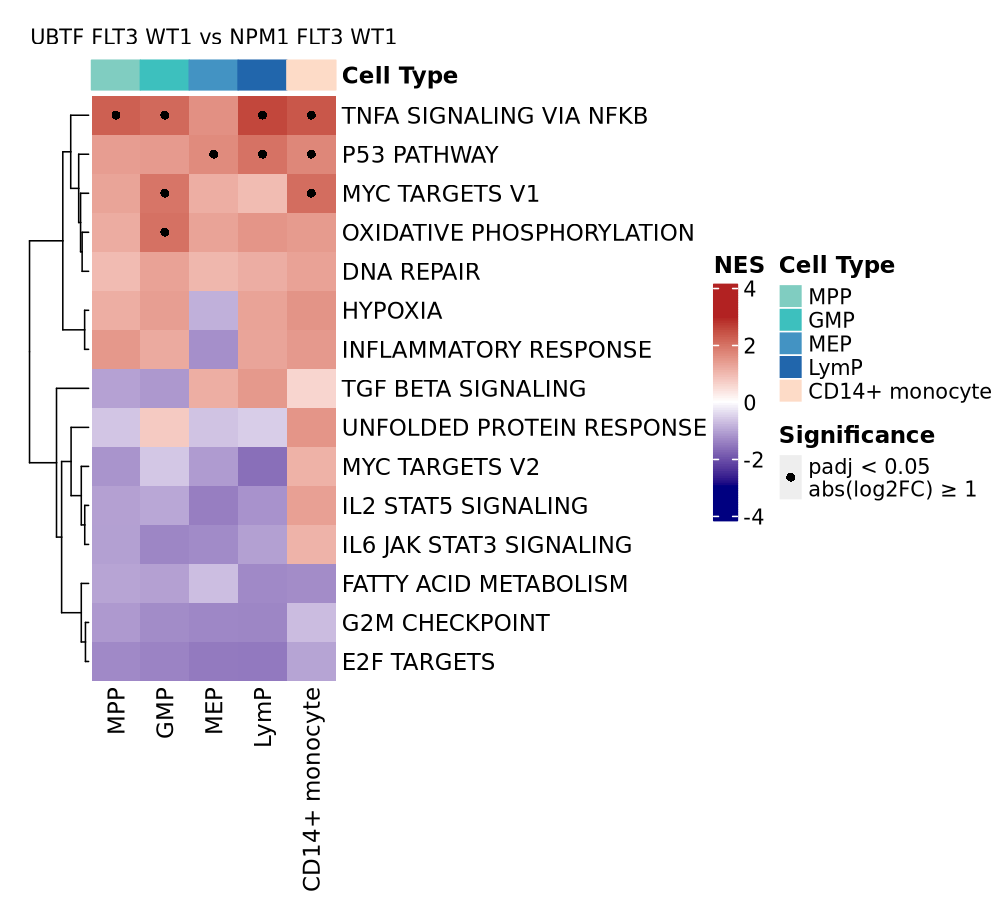

In [ ]:
# === Selected GSEA Pathways ===
selected_pathways_GSEA <- c(
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB", "HALLMARK_HYPOXIA", "HALLMARK_TGF_BETA_SIGNALING",
  "HALLMARK_INFLAMMATORY_RESPONSE", "HALLMARK_E2F_TARGETS", "HALLMARK_G2M_CHECKPOINT",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2",
  "HALLMARK_DNA_REPAIR", "HALLMARK_IL6_JAK_STAT3_SIGNALING", "HALLMARK_P53_PATHWAY",
  "HALLMARK_IL2_STAT5_SIGNALING", "HALLMARK_FATTY_ACID_METABOLISM", "HALLMARK_OXIDATIVE_PHOSPHORYLATION"
)

celltypes_use <- c("MPP", "GMP", "MEP", "LymP", "CD14+ monocyte")
row_labels <- gsub("_", " ", gsub("HALLMARK_", "", selected_pathways_GSEA))

# === Create NES and p-value matrices ===
nes_matrix <- matrix(NA, nrow = length(row_labels), ncol = length(celltypes_use),
                     dimnames = list(row_labels, celltypes_use))
pval_matrix <- nes_matrix

for (ct in celltypes_use) {
  res_name <- paste0("gsea_res_unfilt_DEG_UBTF_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_MUT_", ct)
  if (!res_name %in% names(gsea_results_unfilt)) next
  gsea_df <- as.data.frame(gsea_results_unfilt[[res_name]])
  
  if (!is.null(gsea_df)) {
    for (pathway in selected_pathways_GSEA) {
      rowname <- gsub("_", " ", gsub("HALLMARK_", "", pathway))
      value <- gsea_df %>% filter(ID == pathway)
      if (nrow(value) > 0) {
        nes_matrix[rowname, ct] <- value$NES
        pval_matrix[rowname, ct] <- value$p.adjust
      }
    }
  }
}

# === Significance asterisk ===
text_matrix <- ifelse(pval_matrix < 0.05, "*", "")

top_annot <- HeatmapAnnotation(
  "Cell Type" = anno_simple(colnames(nes_matrix), col = celltype_pal),
  annotation_name_side = "right",
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Legend: NES color function ===
col_fun <- colorRamp2(c(-3, 0, 3), c("navy", "white", "firebrick"))

# === Heatmap ===
ht_gsea <- Heatmap(
  nes_matrix,
  name = "NES",
  col = col_fun,
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  top_annotation = top_annot,
  row_names_gp = gpar(fontsize = 11),
  column_names_gp = gpar(fontsize = 11),
  column_title = "UBTF FLT3 WT1 vs NPM1 FLT3 WT1",
  column_title_gp = gpar(fontsize = 10),
  column_names_rot = 90,
  heatmap_legend_param = list(
    title = "NES",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (!is.na(pval_matrix[i, j]) && pval_matrix[i, j] < 0.05) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

# === Significance asterisk legend ===
asterisk_legend <- Legend(
  title = "Significance",
  type = "points",
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  pch = 16,
  labels_gp = gpar(fontsize = 10),
  title_gp = gpar(fontsize = 11, fontface = "bold")
)

# Subset and reverse the order of cell types
celltype_pal_sub <- rev(celltype_pal[names(celltype_pal) %in% celltypes_use])

# Generate Cell Type legend
celltype_legend <- Legend(
  title = "Cell Type",
  at = names(celltype_pal_sub),
  labels = names(celltype_pal_sub),
  legend_gp = gpar(fill = celltype_pal_sub),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)


# === Draw heatmap ===
png("gsea_heatmap_UBTF_selectedPathways.png", width = 1000, height = 900, res = 150)
draw(
  ht_gsea,
  annotation_legend_list = list(celltype_legend, asterisk_legend),
  annotation_legend_side = "right",
  heatmap_legend_side = "right",
  padding = unit(c(5, 5, 5, 5), "mm")
)
dev.off()

IRdisplay::display_png(file = "gsea_heatmap_UBTF_selectedPathways.png")

In [ ]:
unique_prefixes <- unique(sub("^(.*)_.*$", "\\1", names(gsea_results_unfilt)))
print(unique_prefixes)

[1] "gsea_res_unfilt_DEG_NPM1_CTRL_CombinedCells_NPM1"          
[2] "gsea_res_unfilt_DEG_NPM1_FLT3_CTRL_CombinedCells_NPM1_FLT3"
[3] "gsea_res_unfilt_DEG_NPM1_FLT3_MUT_vs_CTRL"                 
[4] "gsea_res_unfilt_DEG_NPM1_MUT_vs_CTRL"                      
[5] "gsea_res_unfilt_DEG_UBTF_CTRL_CombinedCells_UBTF"          
[6] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL"                      
[7] "gsea_res_unfilt_DEG_UBTF_MUT_vs_UBTF_WT_AML"               
[8] "gsea_res_unfilt_DEG_WT1_NPM1_CTRL_CombinedCells_WT1_NPM1"  
[9] "gsea_res_unfilt_DEG_WT1_NPM1_MUT_vs_CTRL"                  


In [ ]:
### filtered GSEA

In [ ]:
# Initialize result list
gsea_results <- list()

# Run GSEA for each cell type in each dataframe
for (df_name in names(DEG_data)) {
  df <- DEG_data[[df_name]]
  
  # Skip if gene column is still missing
  if (!"gene" %in% colnames(df)) {
    message(paste("❌ Skipping", df_name, "- missing 'gene' column"))
    next
  }
  
  celltype_col <- if ("cell_type" %in% colnames(df)) "cell_type" else if ("Cell_Type" %in% colnames(df)) "Cell_Type" else NULL

  if (is.null(celltype_col)) {
    message(paste("❌ Skipping", df_name, "- missing cell type column"))
    next
  }

  for (ct in unique(df[[celltype_col]])) {
    message(paste("🔍 Running GSEA on", df_name, "-", ct))
    
    # Subset by cell type
    df_ct <- df %>% filter(.data[[celltype_col]] == ct)
    
    # Prepare named vector
    gene_list <- df_ct$avg_log2FC
    names(gene_list) <- df_ct$gene
    
    # Remove NAs and duplicates
    gene_list <- gene_list[!is.na(names(gene_list)) & !duplicated(names(gene_list))]
    
    # Keep only genes that match the gene sets
    gene_list <- gene_list[names(gene_list) %in% gsea_pth$gene]
    
    # Skip if too few genes
    if (length(gene_list) < 1) {
      message(paste("Skipping", df_name, ct, "- too few matched genes for GSEA"))
      next
    }
    
    # Sort for GSEA
    gene_list <- sort(gene_list, decreasing = TRUE)
    
    # Run GSEA with error handling
    gsea_result <- tryCatch({
      GSEA(
        geneList = gene_list,
        TERM2GENE = gsea_pth,
        pvalueCutoff = 0.05,
        verbose = FALSE,
        nPermSimple = 10000,  # More robust estimation
        eps = 0               # Handle very small p-values
      )
    }, error = function(e) {
      message(paste("GSEA failed for", df_name, ct, ":", e$message))
      return(NULL)
    })
    
    # Save result
    result_name <- paste0("gsea_res_", df_name, "_", ct)
    gsea_results[[result_name]] <- gsea_result
  }
}

In [ ]:
names(gsea_results)

[1] "gsea_res_DEG_UBTF_MUT_vs_CTRL_Granulocyte"      
 [2] "gsea_res_DEG_UBTF_MUT_vs_CTRL_CD8+ T"           
 [3] "gsea_res_DEG_UBTF_MUT_vs_CTRL_CD14+ monocyte"   
 [4] "gsea_res_DEG_UBTF_MUT_vs_CTRL_NK"               
 [5] "gsea_res_DEG_UBTF_MUT_vs_CTRL_B"                
 [6] "gsea_res_DEG_UBTF_MUT_vs_CTRL_cDC2"             
 [7] "gsea_res_DEG_UBTF_MUT_vs_CTRL_CD4+ T"           
 [8] "gsea_res_DEG_UBTF_MUT_vs_CTRL_CD11c+"           
 [9] "gsea_res_DEG_UBTF_MUT_vs_CTRL_LymP"             
[10] "gsea_res_DEG_UBTF_MUT_vs_CTRL_HLA-II+ monocyte" 
[11] "gsea_res_DEG_UBTF_MUT_vs_CTRL_GMP"              
[12] "gsea_res_DEG_UBTF_MUT_vs_CTRL_Ery"              
[13] "gsea_res_DEG_UBTF_MUT_vs_CTRL_MPP"              
[14] "gsea_res_DEG_UBTF_MUT_vs_CTRL_Plasma cell"      
[15] "gsea_res_DEG_UBTF_MUT_vs_CTRL_Pro-B"            
[16] "gsea_res_DEG_UBTF_MUT_vs_CTRL_pDC"              
[17] "gsea_res_DEG_UBTF_MUT_vs_CTRL_HSC"              
[18] "gsea_res_DEG_UBTF_MUT_vs_CTRL_CD16+ monocyte"   
[19] "gsea_res_DEG_UBTF_MUT_vs_CTRL_MEP"              
[20] "gsea_res_DEG_UBTF_MUT_vs_CTRL_DC precursor"     
[21] "gsea_res_DEG_UBTF_MUT_vs_CTRL_Perivascular cell"
[22] "gsea_res_DEG_UBTF_MUT_vs_CTRL_cDC1"

In [ ]:
unique_prefixes <- unique(sub("^(.*)_.*$", "\\1", names(gsea_results)))
print(unique_prefixes)

[1] "gsea_res_DEG_UBTF_MUT_vs_CTRL"


In [ ]:
gsea_results[["gsea_res_DEG_UBTF_MUT_vs_CTRL_MPP"]] %>%
  as.data.frame()

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalue,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
PID_TOLL_ENDOGENOUS_PATHWAY,PID_TOLL_ENDOGENOUS_PATHWAY,PID_TOLL_ENDOGENOUS_PATHWAY,18,-0.7895085,-1.900959,0.0003063768,0.03492696,0.03160519,12,"tags=28%, list=0%, signal=28%",LY96/S100A9/VCAN/S100A8/CD14
HALLMARK_TNFA_SIGNALING_VIA_NFKB,HALLMARK_TNFA_SIGNALING_VIA_NFKB,HALLMARK_TNFA_SIGNALING_VIA_NFKB,124,0.3401760,1.674766,0.0002249437,0.03492696,0.03160519,192,"tags=28%, list=7%, signal=28%",PTX3/MAFF/CXCL3/JAG1/INHBA/CXCL2/NFKBIA/ICAM1/NFKBIE/ZC3H12A/NFKB1/ATF3/SMAD3/GCH1/NFAT5/RELA/YRDC/DUSP5/IER3/SQSTM1/PHLDA1/RELB/TRAF1/FUT4/NFKB2/PPP1R15A/GADD45A/EIF1/CCNL1/MAP2K3/ZFP36/FOSL1/TNIP1/TIPARP/FOSB
HALLMARK_E2F_TARGETS,HALLMARK_E2F_TARGETS,HALLMARK_E2F_TARGETS,124,-0.5255715,-1.623765,0.0006260302,0.04757829,0.04305330,675,"tags=48%, list=24%, signal=39%",MSH2/WEE1/CENPE/SMC1A/XPO1/PAICS/CCP110/PRIM2/SMC6/DUT/TP53/POLE/MCM6/TFRC/DEK/RPA2/CBX5/NASP/MCM2/POLA2/ORC6/MCM3/CKS1B/NOP56/PA2G4/RFC3/NAA38/MLH1/UNG/POLD1/MCM5/CKS2/TIPIN/MCM7/USP1/BARD1/RPA3/DNMT1/MYC/POLD3/EXOSC8/MCM4/LIG1/MAD2L1/MMS22L/RAD51C/LYAR/TMPO/CHEK1/PCNA/ASF1A/LMNB1/CHEK2/HELLS/BRCA2/STMN1/BRCA1/RAD51AP1/CIT/DIAPH3


In [ ]:
names(gsea_results_unfilt)

[1] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_Granulocyte"      
 [2] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_CD8+ T"           
 [3] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_CD14+ monocyte"   
 [4] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_NK"               
 [5] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_B"                
 [6] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_cDC2"             
 [7] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_CD4+ T"           
 [8] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_CD11c+"           
 [9] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_LymP"             
[10] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_HLA-II+ monocyte" 
[11] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_GMP"              
[12] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_Ery"              
[13] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_MPP"              
[14] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_Plasma cell"      
[15] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_Pro-B"            
[16] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_pDC"              
[17] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_HSC"              
[18] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_CD16+ monocyte"   
[19] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_MEP"              
[20] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_DC precursor"     
[21] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_Perivascular cell"
[22] "gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_cDC1"

In [ ]:
## combine the heatmaps

pdf 
  2

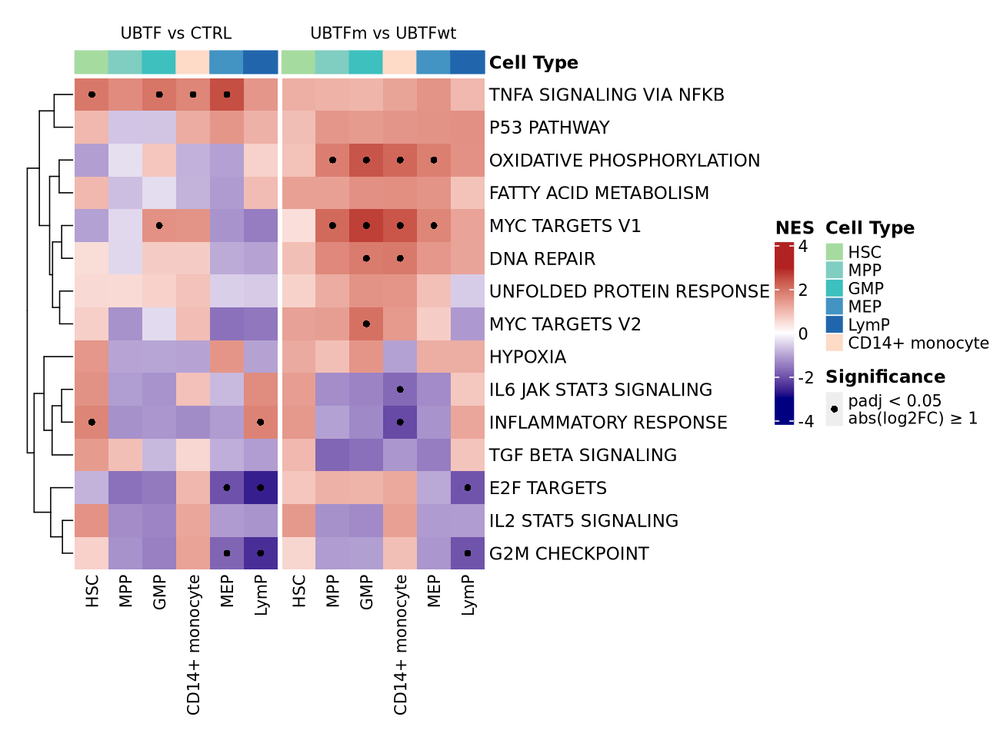

In [ ]:
# === Define pathways and cell types ===
selected_pathways_GSEA <- c(
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB", "HALLMARK_HYPOXIA", "HALLMARK_TGF_BETA_SIGNALING",
  "HALLMARK_INFLAMMATORY_RESPONSE", "HALLMARK_E2F_TARGETS", "HALLMARK_G2M_CHECKPOINT",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2",
  "HALLMARK_DNA_REPAIR", "HALLMARK_IL6_JAK_STAT3_SIGNALING", "HALLMARK_P53_PATHWAY",
  "HALLMARK_IL2_STAT5_SIGNALING", "HALLMARK_FATTY_ACID_METABOLISM", "HALLMARK_OXIDATIVE_PHOSPHORYLATION"
)

celltypes_use <- c("HSC","MPP", "GMP", "CD14+ monocyte", "MEP", "LymP")
row_labels <- gsub("_", " ", gsub("HALLMARK_", "", selected_pathways_GSEA))

# === Create NES and p-value matrices for comparison 1 ===
nes_matrix_1 <- matrix(NA, nrow = length(row_labels), ncol = length(celltypes_use),
                       dimnames = list(row_labels, celltypes_use))
pval_matrix_1 <- nes_matrix_1

for (ct in celltypes_use) {
  res_name <- paste0("gsea_res_unfilt_DEG_UBTF_MUT_vs_CTRL_", ct)
  if (!res_name %in% names(gsea_results_unfilt)) next
  gsea_df <- as.data.frame(gsea_results_unfilt[[res_name]])
  for (pathway in selected_pathways_GSEA) {
    rowname <- gsub("_", " ", gsub("HALLMARK_", "", pathway))
    value <- gsea_df %>% filter(ID == pathway)
    if (nrow(value) > 0) {
      nes_matrix_1[rowname, ct] <- value$NES
      pval_matrix_1[rowname, ct] <- value$p.adjust
    }
  }
}

# === Create NES and p-value matrices for comparison 2 ===
nes_matrix_2 <- matrix(NA, nrow = length(row_labels), ncol = length(celltypes_use),
                       dimnames = list(row_labels, celltypes_use))
pval_matrix_2 <- nes_matrix_2

for (ct in celltypes_use) {
  res_name <- paste0("gsea_res_unfilt_DEG_UBTF_MUT_vs_UBTF_WT_AML_", ct)
  if (!res_name %in% names(gsea_results_unfilt)) next
  gsea_df <- as.data.frame(gsea_results_unfilt[[res_name]])
  for (pathway in selected_pathways_GSEA) {
    rowname <- gsub("_", " ", gsub("HALLMARK_", "", pathway))
    value <- gsea_df %>% filter(ID == pathway)
    if (nrow(value) > 0) {
      nes_matrix_2[rowname, ct] <- value$NES
      pval_matrix_2[rowname, ct] <- value$p.adjust
    }
  }
}

# === Combine both comparisons ===
stopifnot(all(colnames(nes_matrix_1) == colnames(nes_matrix_2)))

combined_nes <- cbind(nes_matrix_1, nes_matrix_2)
combined_pval <- cbind(pval_matrix_1, pval_matrix_2)

group_labels <- c(
  rep("UBTF vs CTRL", ncol(nes_matrix_1)),
  rep("UBTFm vs UBTFwt", ncol(nes_matrix_2))
)

# === Top annotation (cell types only) ===
top_annot <- HeatmapAnnotation(
  'Cell Type' = anno_simple(colnames(combined_nes), col = celltype_pal),
  annotation_name_side = "right",
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Significance dot legend ===
asterisk_legend <- Legend(
  title = "Significance",
  type = "points",
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  pch = 16,
  labels_gp = gpar(fontsize = 10),
  title_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Cell type color legend ===
celltype_pal_sub <- rev(celltype_pal[names(celltype_pal) %in% celltypes_use])
celltype_legend <- Legend(
  title = "Cell Type",
  at = names(celltype_pal_sub),
  labels = names(celltype_pal_sub),
  legend_gp = gpar(fill = celltype_pal_sub),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

# === Final combined heatmap ===
ht_combined <- Heatmap(
  combined_nes,
  name = "NES",
  col = colorRamp2(c(-3, 0, 3), c("navy", "white", "firebrick")),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  column_split = factor(group_labels, levels = c("UBTF vs CTRL", "UBTFm vs UBTFwt")),
  column_title_gp = gpar(fontsize = 10),
  top_annotation = top_annot,
  row_names_gp = gpar(fontsize = 11),
  column_names_gp = gpar(fontsize = 10),
  heatmap_legend_param = list(
    title = "NES",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (!is.na(combined_pval[i, j]) && combined_pval[i, j] < 0.05) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

# === Draw final figure ===
png("gsea_combined_heatmap.png", width = 1300, height = 950, res = 150)
draw(
  ht_combined,
  annotation_legend_list = list(celltype_legend, asterisk_legend),
  annotation_legend_side = "right",
  heatmap_legend_side = "right",
  padding = unit(c(6, 6, 6, 6), "mm")
)
dev.off()
IRdisplay::display_png(file = "gsea_combined_heatmap.png")


In [ ]:
## refined DEGs - UBTF FLT3 UBTF FLT3 WT1 etc

In [ ]:
# Define paths
base_path <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs"
gsea_pth <- read.gmt("/gpfs/home/ml9675/becklab_ML/ref/gmts/combined_gene_sets_no_epithelial.gmt") %>%
  filter(grepl("^HALLMARK_|^PID_", term))

# List all CSV files excluding *_filtered.csv
all_csvs <- list.files(base_path, pattern = "\\.csv$", full.names = FALSE)
filtered_out <- grep("WT1", all_csvs, value = TRUE) %>%
  grep("_filtered\\.csv$", ., value = TRUE, invert = TRUE)

# Create named list of file paths
DEG_files <- setNames(filtered_out, tools::file_path_sans_ext(filtered_out))

# Load and process data
DEG_data <- lapply(DEG_files, function(fname) {
  df <- read_csv(file.path(base_path, fname))
  
  # Rename gene column if not standard
  if (!"gene" %in% colnames(df)) {
    gene_col <- grep("gene", colnames(df), ignore.case = TRUE, value = TRUE)[1]
    if (!is.na(gene_col)) {
      df <- df %>% rename(gene = !!sym(gene_col))
    }
  }
  return(df)
})

In [ ]:
names(DEG_data)

[1] "DEG_NPM1_FLT3_WT1_MUT_vs_CTRL"            
[2] "DEG_NPM1_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_WT"
[3] "DEG_NPM1_FLT3_WT1_WT_vs_CTRL"             
[4] "DEG_UBTF_FLT3_WT1_MUT_vs_CTRL"            
[5] "DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT"
[6] "DEG_UBTF_FLT3_WT1_WT_vs_CTRL"             
[7] "DEG_WT1_NPM1_CTRL_CombinedCells"          
[8] "DEG_WT1_NPM1_MUT_vs_CTRL"

In [ ]:
DEG_data <- DEG_data[!names(DEG_data) %in% "DEG_WT1_NPM1_CTRL_CombinedCells"]


In [ ]:
# Clone to new object name for clarity
gsea_results_unfilt <- list()

for (df_name in names(DEG_data)) {
  df <- DEG_data[[df_name]]
  
  if (!"gene" %in% colnames(df)) {
    message(paste("Skipping", df_name, "- missing 'gene' column"))
    next
  }
  
  celltype_col <- if ("cell_type" %in% colnames(df)) "cell_type" else if ("Cell_Type" %in% colnames(df)) "Cell_Type" else NULL

  if (is.null(celltype_col)) {
    message(paste("Skipping", df_name, "- missing cell type column"))
    next
  }

  for (ct in unique(df[[celltype_col]])) {
    message(paste("[Unfilt] Running GSEA on", df_name, "-", ct))
    
    df_ct <- df %>% filter(.data[[celltype_col]] == ct)
    
    gene_list <- df_ct$avg_log2FC
    names(gene_list) <- df_ct$gene
    
    # Keep full gene list — just clean for NA names
    gene_list <- gene_list[!is.na(names(gene_list)) & !duplicated(names(gene_list))]
    
    # Optional: Still limit to gene sets to make GSEA more efficient
    gene_list <- gene_list[names(gene_list) %in% gsea_pth$gene]
    
    # Optional: Skip if too few
    if (length(gene_list) < 5) {
      message(paste("Skipping", df_name, ct, "- too few genes"))
      next
    }

    gene_list <- sort(gene_list, decreasing = TRUE)
    
    gsea_result <- tryCatch({
      GSEA(
        geneList = gene_list,
        TERM2GENE = gsea_pth,
        pvalueCutoff = 1,  # No cutoff — retain all
        verbose = FALSE,
        nPermSimple = 10000,
        eps = 0
      )
    }, error = function(e) {
      message(paste("GSEA failed for", df_name, ct, ":", e$message))
      return(NULL)
    })
    
    result_name <- paste0("gsea_res_unfilt_", df_name, "_", ct)
    gsea_results_unfilt[[result_name]] <- gsea_result
  }
}

In [ ]:
# Define output directory
output_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250607_scATAC_rnaParticallyMatchedCellTypes/20250607_scATAC_scRNA_DEPs_DEGs/GSEA"

# Create output directory if it doesn't exist
if (!dir.exists(output_dir)) {
  dir.create(output_dir, recursive = TRUE)
}

# Group GSEA results by DEG comparison name
gsea_by_comparison <- split(names(gsea_results_unfilt), 
                            sapply(strsplit(names(gsea_results_unfilt), "_"), function(x) paste(x[4:length(x)-1], collapse = "_")))

# Loop through each comparison and combine cell types
for (comp_name in names(gsea_by_comparison)) {
  result_list <- gsea_by_comparison[[comp_name]]
  combined_df <- NULL
  
  for (res_name in result_list) {
    result <- gsea_results_unfilt[[res_name]]
    
    if (is.null(result)) next
    
    result_df <- as.data.frame(result)
    celltype <- tail(strsplit(res_name, "_")[[1]], 1)
    result_df$cell_type <- celltype
    
    combined_df <- bind_rows(combined_df, result_df)
  }
  
  # Save only if non-empty
  if (!is.null(combined_df)) {
    write_csv(combined_df, file.path(output_dir, paste0(comp_name, ".csv")))
  }
}

In [ ]:
unique_prefixes <- unique(sub("^(.*)_.*$", "\\1", names(gsea_results_unfilt)))
print(unique_prefixes)

[1] "gsea_res_unfilt_DEG_NPM1_FLT3_WT1_MUT_vs_CTRL"            
[2] "gsea_res_unfilt_DEG_NPM1_FLT3_WT1_MUT_vs_NPM1_FLT3_WT1_WT"
[3] "gsea_res_unfilt_DEG_NPM1_FLT3_WT1_WT_vs_CTRL"             
[4] "gsea_res_unfilt_DEG_UBTF_FLT3_WT1_MUT_vs_CTRL"            
[5] "gsea_res_unfilt_DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT"
[6] "gsea_res_unfilt_DEG_UBTF_FLT3_WT1_WT_vs_CTRL"             
[7] "gsea_res_unfilt_DEG_WT1_NPM1_MUT_vs_CTRL"                 


In [ ]:
gsea_results_unfilt[["gsea_res_unfilt_DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT"]] %>%
  as.data.frame()

<0 x 0 matrix>

pdf 
  2

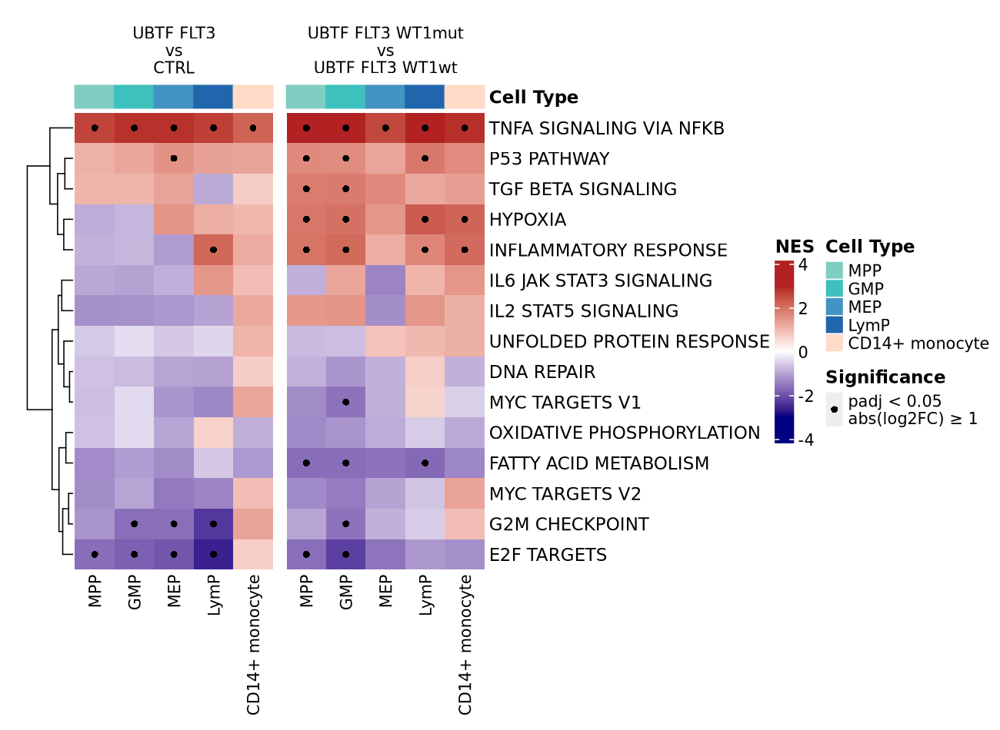

In [ ]:
# === Define pathways and cell types ===
selected_pathways_GSEA <- c(
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB", "HALLMARK_HYPOXIA", "HALLMARK_TGF_BETA_SIGNALING",
  "HALLMARK_INFLAMMATORY_RESPONSE", "HALLMARK_E2F_TARGETS", "HALLMARK_G2M_CHECKPOINT",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2",
  "HALLMARK_DNA_REPAIR", "HALLMARK_IL6_JAK_STAT3_SIGNALING", "HALLMARK_P53_PATHWAY",
  "HALLMARK_IL2_STAT5_SIGNALING", "HALLMARK_FATTY_ACID_METABOLISM", "HALLMARK_OXIDATIVE_PHOSPHORYLATION"
)

celltypes_use <- c("MPP", "GMP",  "MEP", "LymP", "CD14+ monocyte")
row_labels <- gsub("_", " ", gsub("HALLMARK_", "", selected_pathways_GSEA))

# === Create NES and p-value matrices for comparison 1 ===
nes_matrix_1 <- matrix(NA, nrow = length(row_labels), ncol = length(celltypes_use),
                       dimnames = list(row_labels, celltypes_use))
pval_matrix_1 <- nes_matrix_1

for (ct in celltypes_use) {
  res_name <- paste0("gsea_res_unfilt_DEG_UBTF_FLT3_WT1_MUT_vs_CTRL_", ct)
  if (!res_name %in% names(gsea_results_unfilt)) next
  gsea_df <- as.data.frame(gsea_results_unfilt[[res_name]])
  for (pathway in selected_pathways_GSEA) {
    rowname <- gsub("_", " ", gsub("HALLMARK_", "", pathway))
    value <- gsea_df %>% filter(ID == pathway)
    if (nrow(value) > 0) {
      nes_matrix_1[rowname, ct] <- value$NES
      pval_matrix_1[rowname, ct] <- value$p.adjust
    }
  }
}

# === Create NES and p-value matrices for comparison 2 ===
nes_matrix_2 <- matrix(NA, nrow = length(row_labels), ncol = length(celltypes_use),
                       dimnames = list(row_labels, celltypes_use))
pval_matrix_2 <- nes_matrix_2

for (ct in celltypes_use) {
  res_name <- paste0("gsea_res_unfilt_DEG_UBTF_FLT3_WT1_MUT_vs_UBTF_FLT3_WT1_WT_", ct)
  if (!res_name %in% names(gsea_results_unfilt)) next
  gsea_df <- as.data.frame(gsea_results_unfilt[[res_name]])
  for (pathway in selected_pathways_GSEA) {
    rowname <- gsub("_", " ", gsub("HALLMARK_", "", pathway))
    value <- gsea_df %>% filter(ID == pathway)
    if (nrow(value) > 0) {
      nes_matrix_2[rowname, ct] <- value$NES
      pval_matrix_2[rowname, ct] <- value$p.adjust
    }
  }
}

# === Combine both comparisons ===
stopifnot(all(colnames(nes_matrix_1) == colnames(nes_matrix_2)))

combined_nes <- cbind(nes_matrix_1, nes_matrix_2)
combined_pval <- cbind(pval_matrix_1, pval_matrix_2)

group_labels <- c(
  rep("UBTF FLT3 vs CTRL", ncol(nes_matrix_1)),
  rep("UBTF FLT3 WT1mut vs UBTF FLT3 WT1wt", ncol(nes_matrix_2))
)

# === Top annotation (cell types only) ===
top_annot <- HeatmapAnnotation(
  'Cell Type' = anno_simple(colnames(combined_nes), col = celltype_pal),
  annotation_name_side = "right",
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Significance dot legend ===
asterisk_legend <- Legend(
  title = "Significance",
  type = "points",
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  pch = 16,
  labels_gp = gpar(fontsize = 10),
  title_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Cell type color legend ===
celltype_pal_sub <- rev(celltype_pal[names(celltype_pal) %in% celltypes_use])
celltype_legend <- Legend(
  title = "Cell Type",
  at = names(celltype_pal_sub),
  labels = names(celltype_pal_sub),
  legend_gp = gpar(fill = celltype_pal_sub),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

# === Final combined heatmap ===
ht_combined <- Heatmap(
  combined_nes,
  name = "NES",
  col = colorRamp2(c(-3, 0, 3), c("navy", "white", "firebrick")),
  cluster_rows = TRUE,
  column_gap = unit(3, "mm"),
  cluster_columns = FALSE,
  column_split = factor(group_labels, levels = c("UBTF FLT3 vs CTRL", "UBTF FLT3 WT1mut vs UBTF FLT3 WT1wt")),
  column_title_gp = gpar(fontsize = 10),
  column_title = c(
    "UBTF FLT3\nvs\nCTRL",
    "UBTF FLT3 WT1mut\nvs\nUBTF FLT3 WT1wt"
  ),
  top_annotation = top_annot,
  row_names_gp = gpar(fontsize = 11),
  column_names_gp = gpar(fontsize = 10),
  heatmap_legend_param = list(
    title = "NES",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (!is.na(combined_pval[i, j]) && combined_pval[i, j] < 0.05) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

# === Draw final figure ===
png("gsea_combined_heatmap.png", width = 1300, height = 950, res = 150)
draw(
  ht_combined,
  annotation_legend_list = list(celltype_legend, asterisk_legend),
  annotation_legend_side = "right",
  heatmap_legend_side = "right",
  padding = unit(c(6, 6, 6, 6), "mm")
)
dev.off()
IRdisplay::display_png(file = "gsea_combined_heatmap.png")


## DEP - scATAC

#### normalized by each patient + merged + norm

In [2]:
##save w new lsi layer
atac_merged = readRDS('/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250304_atac_rna_partiallyMatched_transfer/objects/20250330integrated_atac_with_rna_labels_norm_updated_merge_lsi.rds')

In [83]:
head(atac_merged@meta.data)

,orig.ident,nCount_peaks,nFeature_peaks,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,⋯,prediction.score.HSC,prediction.score.CD16..monocyte,prediction.score.MEP,prediction.score.Plasmablast,prediction.score.DC.precursor,prediction.score.Perivascular.cell,prediction.score.cDC1,prediction.score.max,patient.id,disease.state
,<chr>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AML0516_AAACGAAAGGAAACTT-1,SeuratProject,35232,14869,33801,5833,1,136,2247,38,8,⋯,0.000000000,0.00000000,0.00000000,0,0.000000000,0.00000000,0.00000000,0.4912395,AML0516,AML
AML0516_AAACGAAAGGGCGAAG-1,SeuratProject,22974,9257,25057,5207,4,97,2291,567,0,⋯,0.000000000,0.00000000,0.00000000,0,0.003867696,0.00000000,0.01083254,0.3382093,AML0516,AML
AML0516_AAACGAAAGTGCTGAG-1,SeuratProject,17527,7951,17980,2739,2,72,1499,49,8,⋯,0.000000000,0.00000000,0.72643897,0,0.000000000,0.00000000,0.00000000,0.7264390,AML0516,AML
AML0516_AAACGAAAGTTATGAG-1,SeuratProject,26295,11762,25691,4318,1,88,1671,125,7,⋯,0.005713292,0.00000000,0.00000000,0,0.000000000,0.03355385,0.05348188,0.2343385,AML0516,AML
AML0516_AAACGAACAAGATTAG-1,SeuratProject,31029,13267,29809,5424,2,103,1824,68,4,⋯,0.000000000,0.00000000,0.01782179,0,0.000000000,0.00000000,0.00000000,0.3167518,AML0516,AML
AML0516_AAACGAACAATAGTGA-1,SeuratProject,16994,7863,15861,2122,2,70,1091,48,9,⋯,0.000000000,0.01448793,0.00000000,0,0.000000000,0.00000000,0.00000000,0.5711375,AML0516,AML


In [19]:
range(atac_merged@meta.data$prediction.score.max, na.rm = TRUE)

[1] 0.1251242 1.0000000

In [ ]:
atac_merged@meta.data %>%
  group_by(predicted.id) %>%
  summarise(mean_score = mean(prediction.score.max, na.rm = TRUE)) %>%
  arrange(desc(mean_score))  # Optional: sort by mean score

predicted.id,mean_score
<chr>,<dbl>
B,0.7622307
Ery,0.6856359
NK,0.6295274
CD8+ T,0.5848479
CD16+ monocyte,0.5815921
pDC,0.5678863
MEP,0.5350191
CD4+ T,0.5224790
CD14+ monocyte,0.4984285


### GREP by disease type:

In [ ]:
head(atac_merged)

,orig.ident,nCount_peaks,nFeature_peaks,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,⋯,prediction.score.HSC,prediction.score.CD16..monocyte,prediction.score.MEP,prediction.score.Plasmablast,prediction.score.DC.precursor,prediction.score.Perivascular.cell,prediction.score.cDC1,prediction.score.max,patient.id,disease.state
,<chr>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AML0516_AAACGAAAGGAAACTT-1,SeuratProject,35232,14869,33801,5833,1,136,2247,38,8,⋯,0.000000000,0.000000000,0.00000000,0,0.000000000,0.00000000,0.00000000,0.4912395,AML0516,AML
AML0516_AAACGAAAGGGCGAAG-1,SeuratProject,22974,9257,25057,5207,4,97,2291,567,0,⋯,0.000000000,0.000000000,0.00000000,0,0.003867696,0.00000000,0.01083254,0.3382093,AML0516,AML
AML0516_AAACGAAAGTGCTGAG-1,SeuratProject,17527,7951,17980,2739,2,72,1499,49,8,⋯,0.000000000,0.000000000,0.72643897,0,0.000000000,0.00000000,0.00000000,0.7264390,AML0516,AML
AML0516_AAACGAAAGTTATGAG-1,SeuratProject,26295,11762,25691,4318,1,88,1671,125,7,⋯,0.005713292,0.000000000,0.00000000,0,0.000000000,0.03355385,0.05348188,0.2343385,AML0516,AML
AML0516_AAACGAACAAGATTAG-1,SeuratProject,31029,13267,29809,5424,2,103,1824,68,4,⋯,0.000000000,0.000000000,0.01782179,0,0.000000000,0.00000000,0.00000000,0.3167518,AML0516,AML
AML0516_AAACGAACAATAGTGA-1,SeuratProject,16994,7863,15861,2122,2,70,1091,48,9,⋯,0.000000000,0.014487928,0.00000000,0,0.000000000,0.00000000,0.00000000,0.5711375,AML0516,AML
AML0516_AAACGAACACCAAGGA-1,SeuratProject,34055,14625,33355,5715,3,112,2236,107,12,⋯,0.000000000,0.000000000,0.00000000,0,0.000000000,0.00000000,0.01008608,0.4143969,AML0516,AML
AML0516_AAACGAACAGGCATTT-1,SeuratProject,31625,13452,35896,6165,1,118,2902,208,9,⋯,0.000000000,0.000000000,0.53268174,0,0.000000000,0.00000000,0.00000000,0.5326817,AML0516,AML
AML0516_AAACGAAGTCTTAGCA-1,SeuratProject,30453,13236,28760,4967,5,102,1765,62,3,⋯,0.000000000,0.000000000,0.00000000,0,0.000000000,0.00000000,0.00000000,0.5638513,AML0516,AML


In [22]:
colnames(atac_merged@meta.data)


[1] "orig.ident"                         "nCount_peaks"                      
 [3] "nFeature_peaks"                     "total"                             
 [5] "duplicate"                          "chimeric"                          
 [7] "unmapped"                           "lowmapq"                           
 [9] "mitochondrial"                      "nonprimary"                        
[11] "passed_filters"                     "is__cell_barcode"                  
[13] "excluded_reason"                    "TSS_fragments"                     
[15] "DNase_sensitive_region_fragments"   "enhancer_region_fragments"         
[17] "promoter_region_fragments"          "on_target_fragments"               
[19] "blacklist_region_fragments"         "peak_region_fragments"             
[21] "peak_region_cutsites"               "nucleosome_signal"                 
[23] "nucleosome_percentile"              "TSS.enrichment"                    
[25] "TSS.percentile"                     "pct_reads_in_peaks"                
[27] "blacklist_ratio"                    "peaks_snn_res.0.8"                 
[29] "seurat_clusters"                    "nCount_RNA"                        
[31] "nFeature_RNA"                       "predicted.id"                      
[33] "prediction.score.Granulocyte"       "prediction.score.CD8..T"           
[35] "prediction.score.CD14..monocyte"    "prediction.score.NK"               
[37] "prediction.score.B"                 "prediction.score.cDC2"             
[39] "prediction.score.CD4..T"            "prediction.score.CD11c."           
[41] "prediction.score.LymP"              "prediction.score.HLA.II..monocyte" 
[43] "prediction.score.GMP"               "prediction.score.Ery"              
[45] "prediction.score.MPP"               "prediction.score.Plasma.cell"      
[47] "prediction.score.Pro.B"             "prediction.score.pDC"              
[49] "prediction.score.HSC"               "prediction.score.CD16..monocyte"   
[51] "prediction.score.MEP"               "prediction.score.Plasmablast"      
[53] "prediction.score.DC.precursor"      "prediction.score.Perivascular.cell"
[55] "prediction.score.cDC1"              "prediction.score.max"              
[57] "patient.id"                         "disease.state"

In [ ]:
#add mutation info

In [8]:
mutation_df

patient_id,WT1_NPM1,NPM1,UBTF,FLT3,WT1
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AML0114,MUT,MUT,WT,WT,MUT
AML1892,MUT,MUT,WT,MUT,MUT
AML2099,MUT,MUT,WT,MUT,MUT
AML3415,MUT,MUT,WT,MUT,MUT
AML1893,WT,MUT,WT,MUT,WT
AML1371,WT,MUT,WT,WT,WT
AML3133,WT,MUT,WT,WT,WT
AML2451,WT,MUT,WT,MUT,WT
AML1423,WT,MUT,WT,WT,WT


## deps

In [34]:
head(atac_merged@meta.data)

,orig.ident,nCount_peaks,nFeature_peaks,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,⋯,prediction.score.Perivascular.cell,prediction.score.cDC1,prediction.score.max,patient.id,disease.state,WT1_NPM1_mut,NPM1_mut,UBTF_mut,FLT3_mut,WT1_mut
,<chr>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AML0516_AAACGAAAGGAAACTT-1,SeuratProject,35232,14869,33801,5833,1,136,2247,38,8,⋯,0.00000000,0.00000000,0.4912395,AML0516,AML,WT,WT,MUT,MUT,MUT
AML0516_AAACGAAAGGGCGAAG-1,SeuratProject,22974,9257,25057,5207,4,97,2291,567,0,⋯,0.00000000,0.01083254,0.3382093,AML0516,AML,WT,WT,MUT,MUT,MUT
AML0516_AAACGAAAGTGCTGAG-1,SeuratProject,17527,7951,17980,2739,2,72,1499,49,8,⋯,0.00000000,0.00000000,0.7264390,AML0516,AML,WT,WT,MUT,MUT,MUT
AML0516_AAACGAAAGTTATGAG-1,SeuratProject,26295,11762,25691,4318,1,88,1671,125,7,⋯,0.03355385,0.05348188,0.2343385,AML0516,AML,WT,WT,MUT,MUT,MUT
AML0516_AAACGAACAAGATTAG-1,SeuratProject,31029,13267,29809,5424,2,103,1824,68,4,⋯,0.00000000,0.00000000,0.3167518,AML0516,AML,WT,WT,MUT,MUT,MUT
AML0516_AAACGAACAATAGTGA-1,SeuratProject,16994,7863,15861,2122,2,70,1091,48,9,⋯,0.00000000,0.00000000,0.5711375,AML0516,AML,WT,WT,MUT,MUT,MUT


In [ ]:
celltypes_to_check <- unique(atac_merged@meta.data$predicted.id)

# Initialize output lists
DEP_UBTF_FLT3_CTRL <- list()
DEP_UBTF_FLT3_WT1mut_CTRL <- list()
DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt <- list()

# Helper function
run_DEP <- function(cell, group1_filter, group2_filter, label1, label2) {
  message(glue::glue("🔍 Processing {cell} for comparison {label1} vs {label2}"))

  meta_sub <- atac_merged@meta.data %>%
    filter(predicted.id == cell)

  valid_peaks_cells <- colnames(atac_merged[["peaks"]])

  group1_cells_all <- rownames(meta_sub %>% filter(!!group1_filter))
  group2_cells_all <- rownames(meta_sub %>% filter(!!group2_filter))

  group1_cells <- intersect(group1_cells_all, valid_peaks_cells)
  group2_cells <- intersect(group2_cells_all, valid_peaks_cells)
  valid_cells <- c(group1_cells, group2_cells)

  if (length(group1_cells) >= 3 & length(group2_cells) >= 3) {
    atac_merged@graphs <- list()
    small_obj <- subset(atac_merged, cells = valid_cells)
    DefaultAssay(small_obj) <- "peaks"
    small_obj <- RunTFIDF(small_obj)
    small_obj <- FindTopFeatures(small_obj, min.cutoff = 'q0')
    small_obj$group <- ifelse(Cells(small_obj) %in% group1_cells, label1, label2)
    Idents(small_obj) <- small_obj$group

    da_peaks <- FindMarkers(
      small_obj, ident.1 = label1, ident.2 = label2, test.use = "wilcox", min.pct = 0.1
    ) %>% mutate(peak = rownames(.))

    da_peaks$gene_label <- da_peaks$peak
    valid_peaks <- grepl("^chr[0-9XYM]+-[0-9]+-[0-9]+$", da_peaks$peak)
    if (any(valid_peaks)) {
      query_regions <- StringToGRanges(da_peaks$peak[valid_peaks])
      closest_genes <- ClosestFeature(atac_merged, query_regions)
      matched_idx <- match(da_peaks$peak, closest_genes$query_region)
      da_peaks$gene_label[!is.na(matched_idx)] <- closest_genes$gene_name[matched_idx[!is.na(matched_idx)]]
    }
    return(da_peaks)
  } else {
    message(glue::glue("Skipping {cell}: insufficient usable cells"))
    return(NULL)
  }
}

# Run comparisons
for (cell in celltypes_to_check) {
  # UBTF_MUT & WT1_WT vs CTRL
  da1 <- run_DEP(cell, quote(UBTF_mut == "MUT" & WT1_mut == "WT"), quote(disease.state == "CTRL"), "UBTF_FLT3", "CTRL")
  if (!is.null(da1)) DEP_UBTF_FLT3_CTRL[[cell]] <- da1

  # UBTF_MUT & WT1_MUT vs CTRL
  da2 <- run_DEP(cell, quote(UBTF_mut == "MUT" & WT1_mut == "MUT"), quote(disease.state == "CTRL"), "UBTF_FLT3_WT1", "CTRL")
  if (!is.null(da2)) DEP_UBTF_FLT3_WT1mut_CTRL[[cell]] <- da2

  # UBTF_MUT & WT1_MUT vs UBTF_MUT & WT1_WT
  da3 <- run_DEP(cell, quote(UBTF_mut == "MUT" & WT1_mut == "MUT"), quote(UBTF_mut == "MUT" & WT1_mut == "WT"), "UBTF_FLT3_WT1mut", "UBTF_FLT3_WT1wt")
  if (!is.null(da3)) DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt[[cell]] <- da3
}

message("All differential peak analyses complete!")

In [39]:
# Define the output directory
output_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250304_atac_rna_partiallyMatched_transfer/20250505_scATAC_scRNA_DEPs_DEGs/csvs_need_new_atac"
if (!dir.exists(output_dir)) dir.create(output_dir, recursive = TRUE)

# Filter lists for adj p < 0.05 and abs(log2FC) > 1
DEP_UBTF_FLT3_CTRL_filtered <- lapply(DEP_UBTF_FLT3_CTRL, function(df) {
  df %>% filter(p_val_adj < 0.05, abs(avg_log2FC) > 1)
})

DEP_UBTF_FLT3_WT1mut_CTRL_filtered <- lapply(DEP_UBTF_FLT3_WT1mut_CTRL, function(df) {
  df %>% filter(p_val_adj < 0.05, abs(avg_log2FC) > 1)
})

DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered <- lapply(DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt, function(df) {
  df %>% filter(p_val_adj < 0.05, abs(avg_log2FC) > 1)
})

# Define a function to combine and save results
combine_and_write <- function(dep_list, dep_list_filtered, prefix) {
  # Combine unfiltered
  combined_unfiltered <- bind_rows(
    lapply(names(dep_list), function(cell) {
      df <- dep_list[[cell]]
      if (!is.null(df) && nrow(df) > 0) {
        df$cell_type <- cell
        return(df)
      } else {
        return(NULL)
      }
    })
  )
  
  # Combine filtered
  combined_filtered <- bind_rows(
    lapply(names(dep_list_filtered), function(cell) {
      df <- dep_list_filtered[[cell]]
      if (!is.null(df) && nrow(df) > 0) {
        df$cell_type <- cell
        return(df)
      } else {
        return(NULL)
      }
    })
  )
  
  # Save to CSV
  write.csv(combined_unfiltered, file = file.path(output_dir, paste0(prefix, "_allCT_unfiltered.csv")), row.names = FALSE)
  write.csv(combined_filtered, file = file.path(output_dir, paste0(prefix, "_allCT_filtered.csv")), row.names = FALSE)
  
  # Return filtered for reuse if needed
  return(combined_filtered)
}

# === Run for all 3 comparisons ===
DEP_UBTF_FLT3_CTRL_filtered <- combine_and_write(DEP_UBTF_FLT3_CTRL, DEP_UBTF_FLT3_CTRL_filtered, "DEP_UBTF_FLT3_CTRL")
DEP_UBTF_FLT3_WT1mut_CTRL_filtered <- combine_and_write(DEP_UBTF_FLT3_WT1mut_CTRL, DEP_UBTF_FLT3_WT1mut_CTRL_filtered, "DEP_UBTF_FLT3_WT1mut_CTRL")
DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered <- combine_and_write(DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt, DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered, "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt")

In [ ]:
# Define the output directory
output_dir <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250304_atac_rna_partiallyMatched_transfer/20250505_scATAC_scRNA_DEPs_DEGs/csvs_need_new_atac"

# === Set file paths ===
file_paths <- list(
  # Filtered
  DEP_UBTF_FLT3_CTRL_filtered = file.path(output_dir, "DEP_UBTF_FLT3_CTRL_allCT_filtered.csv"),
  DEP_UBTF_FLT3_WT1mut_CTRL_filtered = file.path(output_dir, "DEP_UBTF_FLT3_WT1mut_CTRL_allCT_filtered.csv"),
  DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered = file.path(output_dir, "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_allCT_filtered.csv"),

  # Unfiltered
  DEP_UBTF_FLT3_CTRL_unfiltered = file.path(output_dir, "DEP_UBTF_FLT3_CTRL_allCT_unfiltered.csv"),
  DEP_UBTF_FLT3_WT1mut_CTRL_unfiltered = file.path(output_dir, "DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered.csv"),
  DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_unfiltered = file.path(output_dir, "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_allCT_unfiltered.csv")
)

# === Read and split helper function ===
read_and_split_by_cell_type <- function(file_path) {
  df <- read_csv(file_path, show_col_types = FALSE)
  split(df, df$cell_type)
}

# === Load and split all lists ===

# Filtered
DEP_UBTF_FLT3_CTRL_filtered <- read_and_split_by_cell_type(file_paths$DEP_UBTF_FLT3_CTRL_filtered)
DEP_UBTF_FLT3_WT1mut_CTRL_filtered <- read_and_split_by_cell_type(file_paths$DEP_UBTF_FLT3_WT1mut_CTRL_filtered)
DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered <- read_and_split_by_cell_type(file_paths$DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered)

# Unfiltered
DEP_UBTF_FLT3_CTRL <- read_and_split_by_cell_type(file_paths$DEP_UBTF_FLT3_CTRL_unfiltered)
DEP_UBTF_FLT3_WT1mut_CTRL <- read_and_split_by_cell_type(file_paths$DEP_UBTF_FLT3_WT1mut_CTRL_unfiltered)
DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt <- read_and_split_by_cell_type(file_paths$DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_unfiltered)

In [ ]:
## proportional accessibility

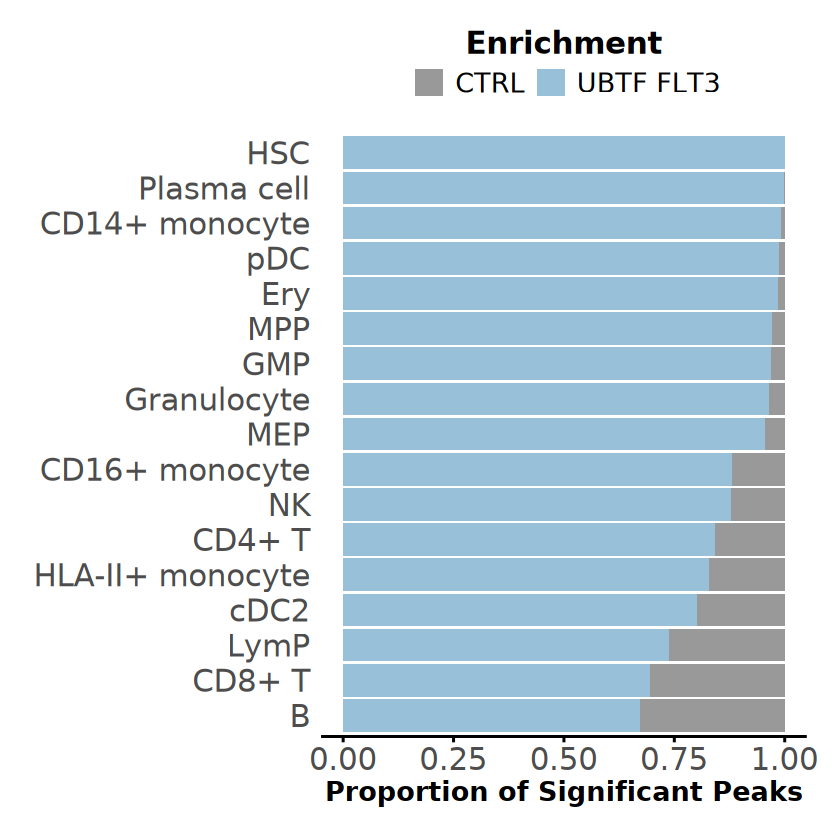

In [ ]:
options(repr.plot.width = 7, repr.plot.height = 7)

# Summarize and compute proportions
bar_data_prop <- DEP_UBTF_FLT3_CTRL_filtered %>%
  mutate(direction = ifelse(avg_log2FC > 0, "UBTF FLT3", "CTRL")) %>%
  count(cell_type, direction) %>%
  group_by(cell_type) %>%
  mutate(proportion = n / sum(n)) %>%
  ungroup()

# Get cell type ordering based on decreasing UBTF_MUT proportion
cell_order <- bar_data_prop %>%
  filter(direction == "UBTF FLT3") %>%
  arrange(proportion) %>%
  pull(cell_type)

# Plot
ggplot(bar_data_prop, aes(x = proportion, y = factor(cell_type, levels = cell_order), fill = direction)) +
  geom_bar(stat = "identity", position = "stack") +
  scale_fill_manual(values = c("UBTF FLT3" = "#98c1d9", "CTRL" = "grey60")) +
  labs(
    x = "Proportion of Significant Peaks",
    y = "",
    fill = "Enrichment"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    panel.grid = element_blank(),
    axis.line.x = element_line(color = "black"),
    axis.ticks.x = element_line(color = "black"),
    axis.text.y = element_text(size = 18),
    axis.text.x = element_text(size = 18),
    axis.title.x = element_text(size = 16, face = "bold"),
    legend.title = element_text(size = 18, face = "bold"),
    legend.text = element_text(size = 16),
    legend.position = "top",
    legend.justification = "center",
    plot.margin = margin(t = 10, r = 20, b = 20, l = 20)
  ) +
  guides(fill = guide_legend(title.position = "top", title.hjust = 0.5))

In [ ]:
## volcanos

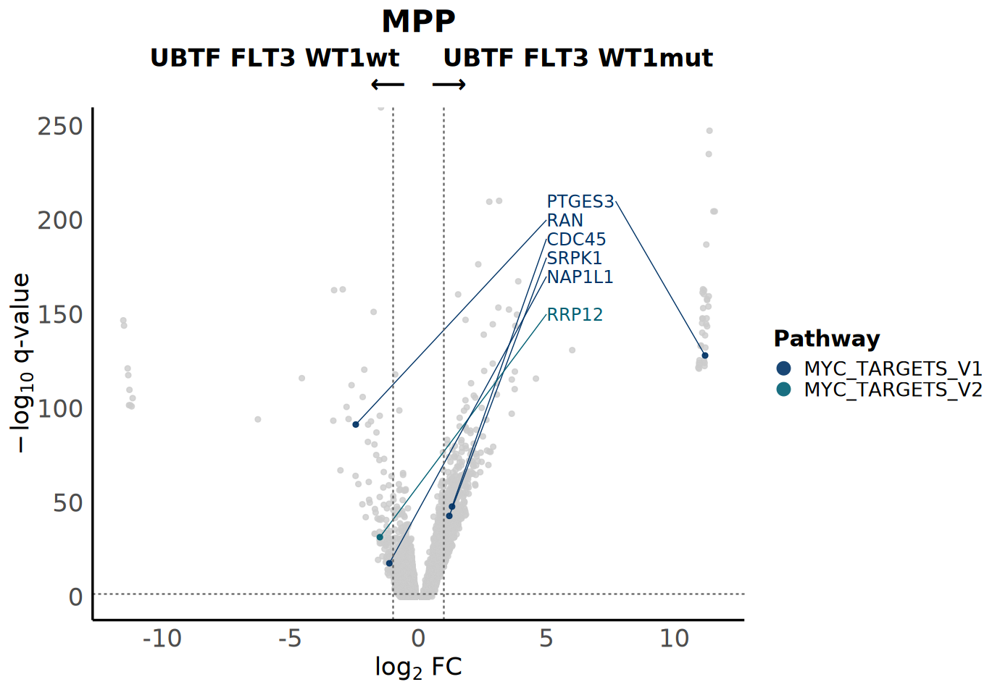

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt
celltypes_to_show <- c("MPP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID","MYELOID")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS" = "#7AC273",
  "LYMPHOID" = "#C2CE51",
  "MYELOID" = "#581845"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(5, 5, -11, 5, 5, 5, 5, 5),
  y_start = c(220, 160, 120, 100, 260, 90, 90, 90),
  y_spacing = rep(-10, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

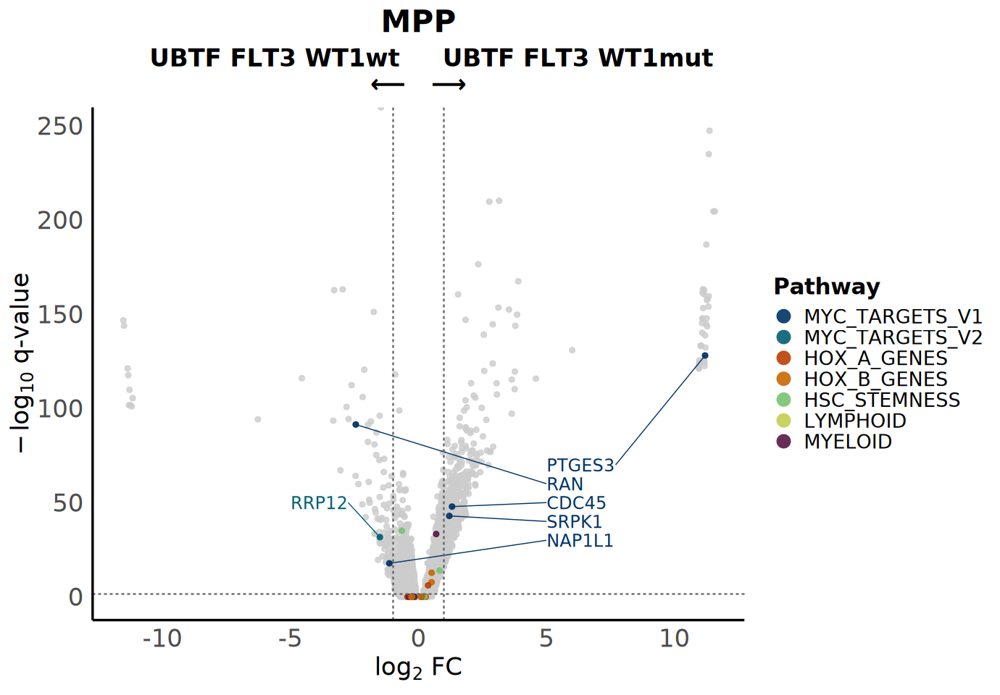

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt
celltypes_to_show <- c("MPP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID", "MYELOID")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS"            = "#7AC273",
  "LYMPHOID"                = "#C2CE51",
  "MYELOID"                 = "#581845"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05
highlight_pathways <- c("HSC_STEMNESS", "MYELOID", "LYMPHOID", "HOX_A_GENES","HOX_B_GENES")

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(5, -5, -11, 5, 5, 5, 5, 5),
  y_start = c(80, 60, 120, 100, 260, 90, 90, 90),
  y_spacing = rep(-10, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    # Significant genes + highlight pathway genes (even if not sig)
    sig_pathway_genes <- deg_df %>%
      filter(
        (!is.na(pathway) & abs(avg_log2FC) >= logfc_cutoff & p_val_adj < pval_cutoff) |
        (!is.na(pathway) & pathway %in% highlight_pathways)
      )

    # Top MYC and MHC genes to label
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # Label HOXA + HOXB genes
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    label_genes <- c("MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4", "HOXA6", hoxb_genes)

    # Only label genes that are not in the highlight-only categories
    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes & !(pathway %in% highlight_pathways)) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # Format figure legend
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    # Final plot
    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}


In [11]:
head(DEP_UBTF_FLT3_WT1mut_CTRL_filtered[['MPP']])

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1.007862e-231,-12.557521,0.000,0.219,4.458770e-226,chr9-5073093-5074025,JAK2,MPP
1.140776e-202,2.463444,0.606,0.107,5.046782e-197,chr17-44210053-44211324,UBTF,MPP
3.118300e-174,-3.248666,0.044,0.300,1.379533e-168,chr2-71226702-71227736,PAIP2B,MPP
4.551912e-169,-4.765447,0.010,0.201,2.013761e-163,chr1-228457277-228458356,HIST3H2BB,MPP
5.295148e-151,-5.258926,0.006,0.171,2.342568e-145,chr5-179559193-179560171,RUFY1,MPP
4.871018e-143,6.551728,0.356,0.004,2.154933e-137,chr8-144270314-144271380,BOP1,MPP


In [12]:
# Extract the MPP data frame
mpp_df <- DEP_UBTF_FLT3_WT1mut_CTRL_filtered[['MPP']]

# Sort by logFC descending for top 20
top20_genes <- mpp_df %>%
  arrange(desc(avg_log2FC)) %>%
  head(30)

# Sort by logFC ascending for bottom 20
bottom20_genes <- mpp_df %>%
  arrange(avg_log2FC) %>%
  head(30)

# View both together
top20_genes
bottom20_genes

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
2.890545e-132,11.66942,0.328,0,1.278774e-126,chr2-199228920-199229859,SATB2,MPP
5.565999e-125,11.61237,0.314,0,2.462393e-119,chr17-80997121-80998030,CHMP6,MPP
8.324870e-117,11.57150,0.297,0,3.682914e-111,chr19-16876620-16877520,SIN3B,MPP
1.387640e-105,11.54292,0.273,0,6.138906e-100,chr9-122218979-122219896,LHX6,MPP
5.469217e-114,11.51734,0.291,0,2.419576e-108,chr14-105898899-105900087,AL122127.25,MPP
1.027087e-107,11.49831,0.278,0,4.543820e-102,chr20-50572652-50573583,PTPN1,MPP
2.133723e-93,11.47458,0.246,0,9.439568e-88,chr11-1049216-1050132,RP13-870H17.3,MPP
9.265621e-95,11.47286,0.249,0,4.099101e-89,chr3-128616298-128617119,RPN1,MPP
1.451676e-94,11.46856,0.249,0,6.422200e-89,chr10-48469890-48470804,ARHGAP22,MPP


p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1.007862e-231,-12.557521,0.000,0.219,4.458770e-226,chr9-5073093-5074025,JAK2,MPP
3.658506e-100,-6.692835,0.002,0.103,1.618519e-94,chr1-228464291-228465247,HIST3H2BB,MPP
1.209150e-105,-6.064838,0.003,0.113,5.349268e-100,chr17-82126389-82127397,CCDC57,MPP
4.996329e-105,-5.895591,0.002,0.112,2.210371e-99,chr1-59814267-59815355,HOOK1,MPP
1.464783e-107,-5.315728,0.003,0.119,6.480185e-102,chr4-152100239-152101170,RP11-18H21.1,MPP
5.295148e-151,-5.258926,0.006,0.171,2.342568e-145,chr5-179559193-179560171,RUFY1,MPP
6.515416e-86,-5.108741,0.004,0.101,2.882414e-80,chr19-20077441-20078537,ZNF90,MPP
3.704013e-84,-4.939093,0.005,0.100,1.638652e-78,chr9-71782859-71783812,TMEM2,MPP
4.529296e-109,-4.905126,0.007,0.132,2.003756e-103,chr19-56476283-56478343,ZNF667,MPP


In [62]:
# Extract the MPP data frame
mpp_df <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt[['GMP']]

# Sort by logFC descending for top 20
top20_genes <- mpp_df %>%
  arrange(desc(avg_log2FC)) %>%
  head(30)

# Sort by logFC ascending for bottom 20
bottom20_genes <- mpp_df %>%
  arrange(avg_log2FC) %>%
  head(30)

# View both together
top20_genes
bottom20_genes

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1.371503e-86,11.54717,0.164,0,6.067516e-81,chr2-218396728-218397464,SLC11A1,GMP
5.524561e-81,11.53970,0.154,0,2.444060e-75,chr12-132488347-132489465,FBRSL1,GMP
6.620934e-99,11.39046,0.186,0,2.929095e-93,chr19-38848940-38849696,HNRNPL,GMP
1.297232e-91,11.38424,0.173,0,5.738941e-86,chr15-87902668-87903692,NTRK3,GMP
2.594321e-69,11.35939,0.132,0,1.147725e-63,chr2-218569032-218569710,CNOT9,GMP
1.135174e-65,11.34435,0.125,0,5.021999e-60,chr6-53065502-53066413,FBXO9,GMP
4.569190e-65,11.33894,0.124,0,2.021405e-59,chr16-30525794-30526719,ZNF768,GMP
3.727296e-88,11.32759,0.166,0,1.648952e-82,chr10-133309693-133310579,ZNF511-PRAP1,GMP
1.726636e-67,11.31677,0.129,0,7.638621e-62,chr9-71769416-71770160,TMEM2,GMP


p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
2.382743e-63,-11.536040,0.000,0.146,1.054123e-57,chr15-70095618-70096630,TLE3,GMP
9.269804e-48,-11.407528,0.000,0.111,4.100952e-42,chr1-3901200-3901653,LINC01134,GMP
9.315624e-53,-11.395727,0.000,0.123,4.121223e-47,chr14-75280835-75281760,FOS,GMP
2.351094e-52,-11.381448,0.000,0.122,1.040122e-46,chr1-34625280-34626198,SMIM12,GMP
3.687769e-53,-11.375722,0.000,0.124,1.631465e-47,chr9-27572328-27573115,C9orf72,GMP
2.369796e-51,-11.372701,0.000,0.120,1.048395e-45,chr19-12792009-12793035,JUNB,GMP
5.491175e-45,-11.351680,0.000,0.105,2.429291e-39,chr6-32969985-32971230,BRD2,GMP
5.644076e-46,-11.314232,0.000,0.107,2.496934e-40,chr2-206083283-206085401,AC007383.3,GMP
2.628072e-81,-4.264765,0.017,0.219,1.162656e-75,chr19-13838933-13840180,MIR24-2,GMP


In [ ]:
# Define chromatin remodeling genes of interest
chromatin_genes <- c(
  "EZH2", "KDM6A", "ASXL1", "DNMT3A", "TET2", "IDH1", "IDH2",
  "BCOR", "SUZ12", "EED", "SMARCA4", "ARID1A", "ARID1B", "CHD4",
  "SIN3A", "SIN3B", "CREBBP", "EP300", "KMT2A", "SETD2", "BRD4"
)

### SIN3B, co-repressor, upregulation suggests repression of differentiation, DNMT3A silences differentiation genes
# Extract the MPP DEG dataframe
mpp_df <- DEP_UBTF_FLT3_WT1mut_CTRL_filtered[['MPP']]

# Filter for chromatin genes
chromatin_in_mpp <- mpp_df %>%
  filter(gene_label %in% chromatin_genes)

chromatin_in_mpp


p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
8.324870e-117,11.571504,0.297,0.000,3.682914e-111,chr19-16876620-16877520,SIN3B,MPP
8.728477e-76,1.844670,0.327,0.065,3.861470e-70,chr2-25209898-25210853,DNMT3A,MPP
7.192700e-63,11.033633,0.174,0.000,3.182043e-57,chr2-25290770-25291719,DNMT3A,MPP
4.763840e-61,11.150625,0.169,0.000,2.107518e-55,chr2-25274897-25275849,DNMT3A,MPP
1.445537e-45,1.571790,0.239,0.059,6.395043e-40,chr3-47016725-47017907,SETD2,MPP
2.424922e-45,2.615680,0.167,0.019,1.072783e-39,chr2-25206778-25207707,DNMT3A,MPP
5.841454e-45,1.326212,0.272,0.081,2.584253e-39,chr2-25250457-25252647,DNMT3A,MPP
6.969088e-45,1.688955,0.215,0.046,3.083118e-39,chr2-25301245-25302178,DNMT3A,MPP
1.012519e-34,3.031023,0.127,0.014,4.479376e-29,chr11-118524220-118525311,KMT2A,MPP


In [ ]:
remodeling_all <- unique(c(
  "AFF1", "DOT1L", "MEN1", "BRD4", "CBX2", "CBX8", "PRDM16", "HMGA2", "EVI1",
  "EZH2", "KDM6A", "ASXL1", "DNMT3A", "TET2", "IDH1", "IDH2",
  "BCOR", "SUZ12", "EED", "SMARCA4", "ARID1A", "ARID1B", "CHD4",
  "SIN3A", "SIN3B", "CREBBP", "EP300", "KMT2A", "SETD2",
  "SATB2"
))

# Extract MPP dataframe
mpp_df <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered[['MPP']]

# Filter and keep best hit (smallest p_val) for each gene
chromatin_in_mpp <- mpp_df %>%
  filter(gene_label %in% remodeling_all) %>%
  group_by(gene_label) %>%
  slice_min(order_by = p_val, n = 1, with_ties = FALSE) %>%
  ungroup()

chromatin_in_mpp

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
2.018194e-56,1.087113,0.174,0.066,8.928471e-51,chr2-25290770-25291719,DNMT3A,MPP
1.432576e-89,1.679096,0.179,0.049,6.337700e-84,chr1-3078184-3079409,PRDM16,MPP


In [ ]:
## choose to highlight DNMT3A, PRDM16, SIN3B, SATB2, BRD4, KMT2A, AFF1

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_text()`).”


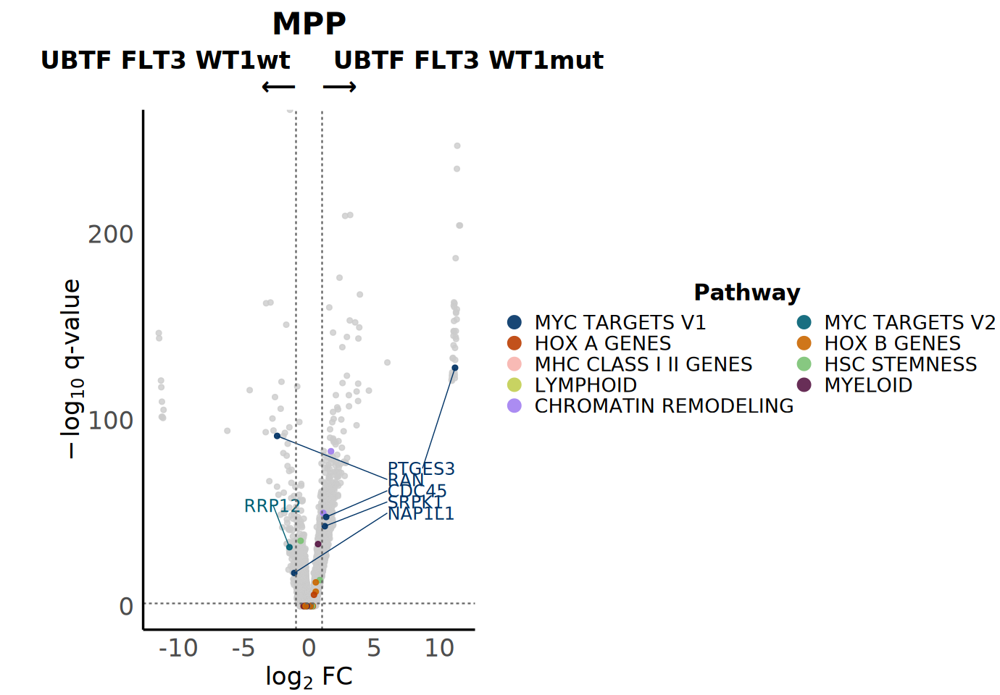

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt
celltypes_to_show <- c("MPP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID", "MYELOID", "CHROMATIN_REMODELING")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS"            = "#7AC273",
  "LYMPHOID"                = "#C2CE51",
  "MYELOID"                 = "#581845",
  "CHROMATIN_REMODELING"   = "#A280F0"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05
highlight_pathways <- c("HSC_STEMNESS", "MYELOID", "LYMPHOID", "HOX_A_GENES", "HOX_B_GENES")

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(6, -5, -11, 5, 5, 5, 5, 5, 5),
  y_start = c(80, 60, 120, 100, 260, 90, 90, 90, 90),
  y_spacing = rep(-6, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    # Significant genes + highlight pathway genes (even if not sig)
    sig_pathway_genes <- deg_df %>%
      filter(
        (!is.na(pathway) & abs(avg_log2FC) >= logfc_cutoff & p_val_adj < pval_cutoff) |
        (!is.na(pathway) & pathway %in% highlight_pathways)
      )

    # === ADD DUMMY ENTRIES TO ENSURE FULL LEGEND ===
    missing_pathways <- setdiff(ordered_pathways, unique(sig_pathway_genes$pathway))
    dummy_points <- data.frame(
      avg_log2FC = NA,
      log10_qval = NA,
      pathway = factor(missing_pathways, levels = ordered_pathways)
    )
    sig_pathway_genes <- bind_rows(sig_pathway_genes, dummy_points)

    # Top MYC and MHC genes to label
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # Label HOXA + HOXB genes
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    label_genes <- c("MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4", "HOXA6", hoxb_genes)

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes & !(pathway %in% highlight_pathways)) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # Format figure legend
    concordance_labels <- sig_pathway_genes %>%
      filter(!is.na(pathway)) %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0, na.rm = TRUE),
        neg = sum(avg_log2FC < 0, na.rm = TRUE),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("_", " ", gsub("HALLMARK_", "", pathway))
      ) %>%
      arrange(match(pathway, ordered_pathways))

    # Add placeholder labels for missing pathways
    missing_labels <- setdiff(ordered_pathways, concordance_labels$pathway)
    if (length(missing_labels) > 0) {
      concordance_labels <- bind_rows(
        concordance_labels,
        tibble(pathway = missing_labels, pos = 0, neg = 0, total = 0, pct = 0, direction = "", label = gsub("_", " ", gsub("HALLMARK_", "", missing_labels)))
      )
    }

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    # Final plot
    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9, na.rm = TRUE) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        drop = FALSE,
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black"),
        plot.margin = margin(t = 10, r = 00, b = 0, l = 50)
      ) +
      guides(
        color = guide_legend(
          override.aes = list(shape = 16, size = 5),
          title.position = "top",
          title.hjust = 0.5,
          nrow = 7,
          byrow = TRUE
        )
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}


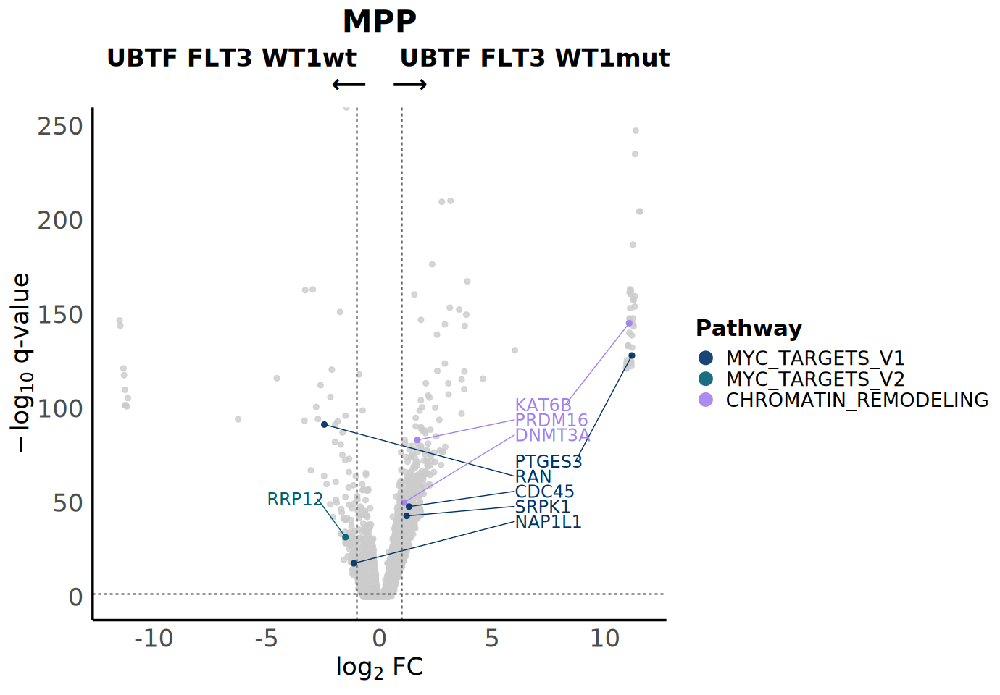

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt
celltypes_to_show <- c("MPP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID","MYELOID","CHROMATIN_REMODELING")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS" = "#7AC273",
  "LYMPHOID" = "#C2CE51",
  "MYELOID" = "#581845",
  "CHROMATIN_REMODELING" = "#A280F0"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(6, -5, -11, 5, 5, 5, 5, 5, 6),
  y_start = c(80, 60, 120, 100, 260, 90, 90, 90, 110),
  y_spacing = rep(-8, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    chromatin_top <- sig_pathway_genes %>%
      filter(pathway == "CHROMATIN_REMODELING") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      bind_rows(chromatin_top) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "  UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

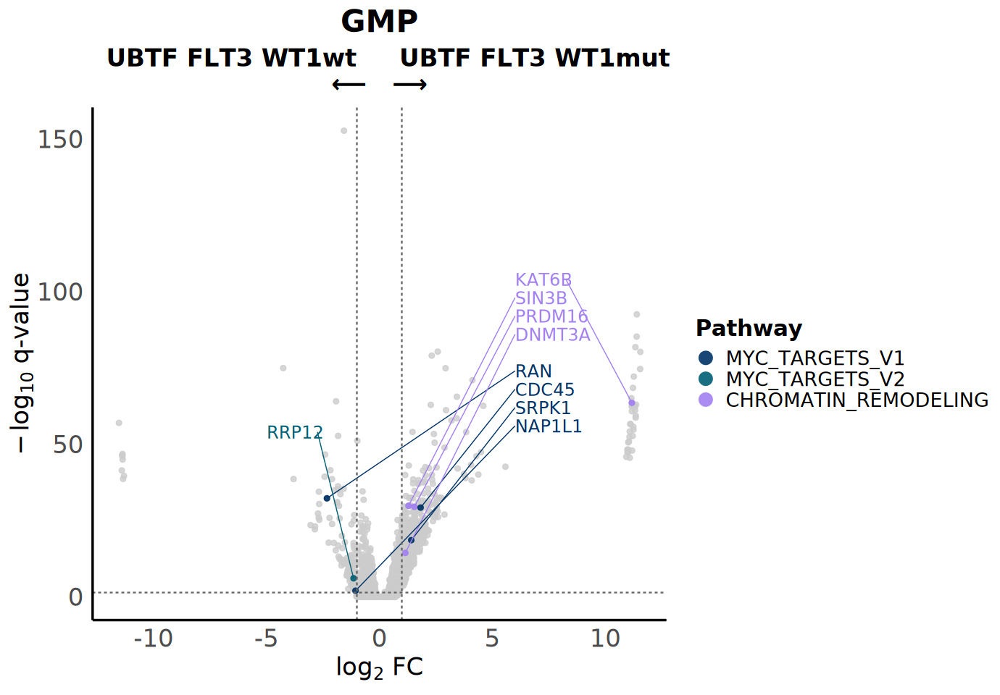

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt
celltypes_to_show <- c("GMP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID","MYELOID","CHROMATIN_REMODELING")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS" = "#7AC273",
  "LYMPHOID" = "#C2CE51",
  "MYELOID" = "#581845",
  "CHROMATIN_REMODELING" = "#A280F0"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(6, -5, -11, 5, 5, 5, 5, 5, 6),
  y_start = c(80, 60, 120, 100, 260, 90, 90, 90, 110),
  y_spacing = rep(-6, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    chromatin_top <- sig_pathway_genes %>%
      filter(pathway == "CHROMATIN_REMODELING") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      bind_rows(chromatin_top) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "  UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

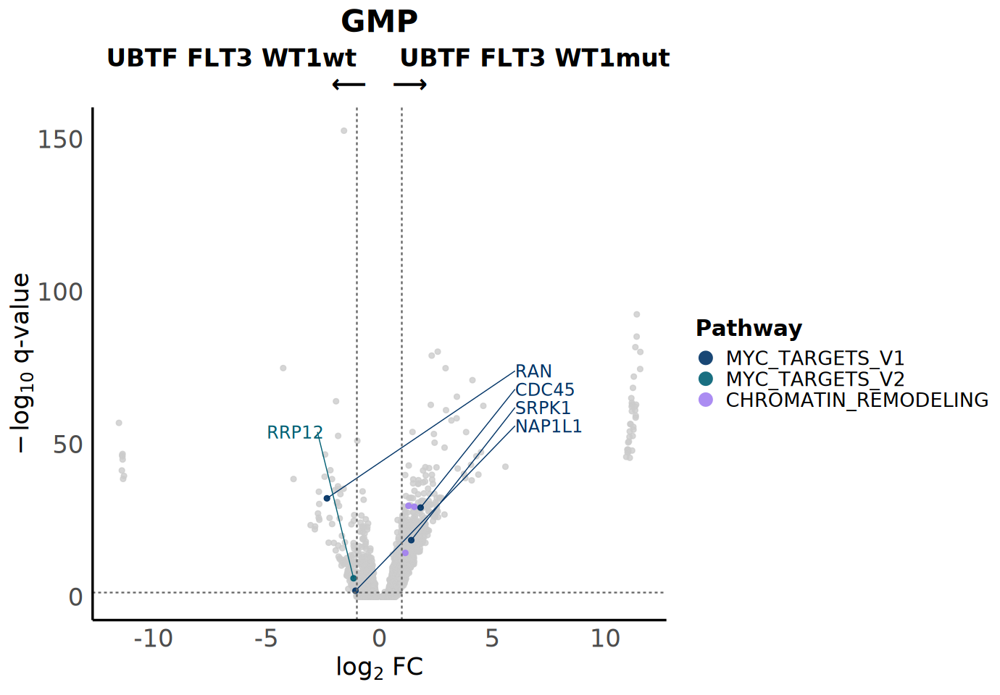

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt
celltypes_to_show <- c("GMP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID","MYELOID","CHROMATIN_REMODELING")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS" = "#7AC273",
  "LYMPHOID" = "#C2CE51",
  "MYELOID" = "#581845",
  "CHROMATIN_REMODELING" = "#A280F0"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(6, -5, -11, 5, 5, 5, 5, 5, 5),
  y_start = c(80, 60, 120, 100, 260, 90, 90, 90, 90),
  y_spacing = rep(-6, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "  UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

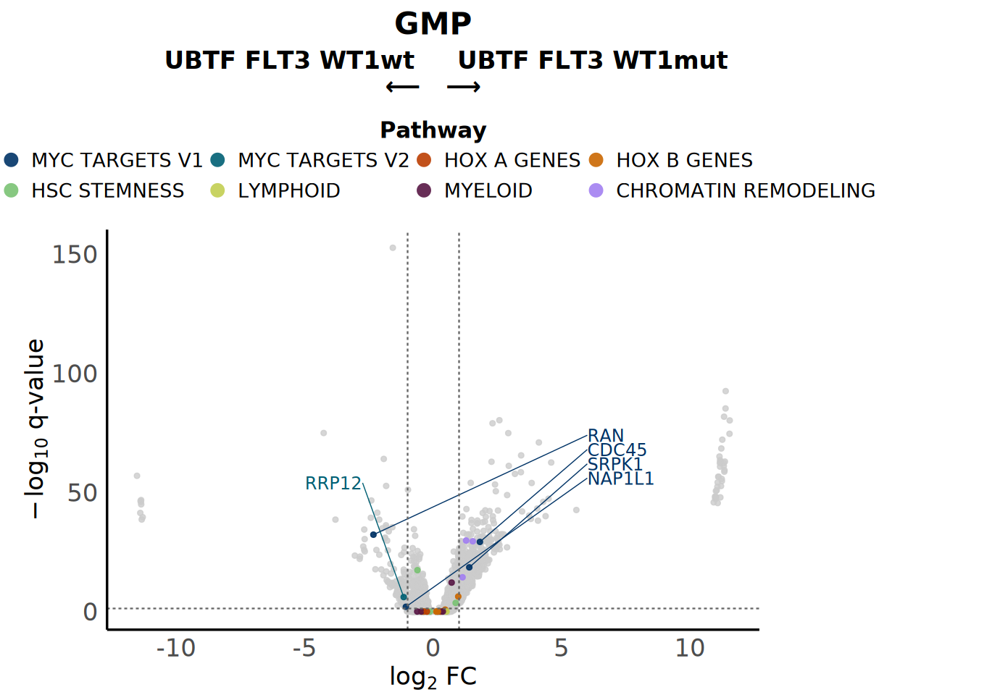

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt
celltypes_to_show <- c("GMP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID", "MYELOID", "CHROMATIN_REMODELING")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS"            = "#7AC273",
  "LYMPHOID"                = "#C2CE51",
  "MYELOID"                 = "#581845",
  "CHROMATIN_REMODELING" = "#A280F0"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05
highlight_pathways <- c("HSC_STEMNESS", "MYELOID", "LYMPHOID", "HOX_A_GENES","HOX_B_GENES")

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(6, -5, -11, 5, 5, 5, 5, 5, 5),
  y_start = c(80, 60, 120, 100, 260, 90, 90, 90, 90),
  y_spacing = rep(-6, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    # Significant genes + highlight pathway genes (even if not sig)
    sig_pathway_genes <- deg_df %>%
      filter(
        (!is.na(pathway) & abs(avg_log2FC) >= logfc_cutoff & p_val_adj < pval_cutoff) |
        (!is.na(pathway) & pathway %in% highlight_pathways)
      )

    # Top MYC and MHC genes to label
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # Label HOXA + HOXB genes
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    label_genes <- c("MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4", "HOXA6", hoxb_genes)

    # Only label genes that are not in the highlight-only categories
    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes & !(pathway %in% highlight_pathways)) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # Format figure legend
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("_", " ", gsub("HALLMARK_", "", pathway))
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    # Final plot
    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "   UBTF FLT3 WT1wt     UBTF FLT3 WT1mut\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "top",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black"),
        plot.margin = margin(t = 10, r = 200, b = 0, l = 20)
      ) +
guides(
    color = guide_legend(
      override.aes = list(shape = 16, size = 5),
      title.position = "top",
      title.hjust = 0.5,
      nrow = 2,
      byrow = TRUE
    )
  )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
} 

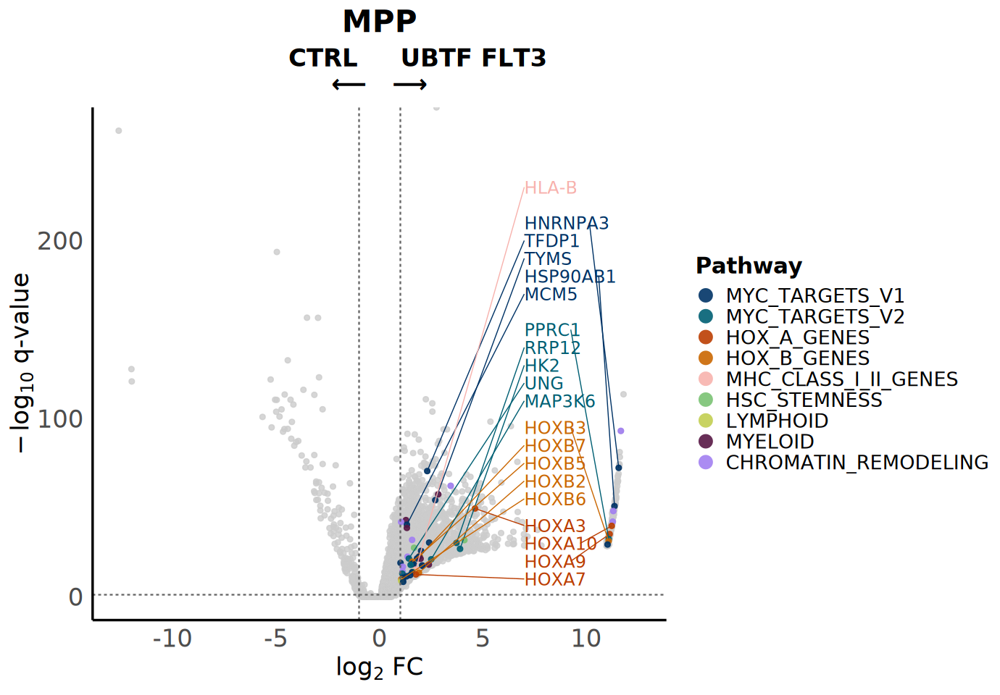

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_CTRL
celltypes_to_show <- c("MPP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID","MYELOID","CHROMATIN_REMODELING")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS" = "#7AC273",
  "LYMPHOID" = "#C2CE51",
  "MYELOID" = "#581845",
  "CHROMATIN_REMODELING" = "#A280F0"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(7, 7, 7, 7, 7, 7, 7, 7, 7),
  y_start = c(220, 160, 50, 105, 240, 90, 90, 90, 300),
  y_spacing = rep(-10, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "         CTRL     UBTF FLT3\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

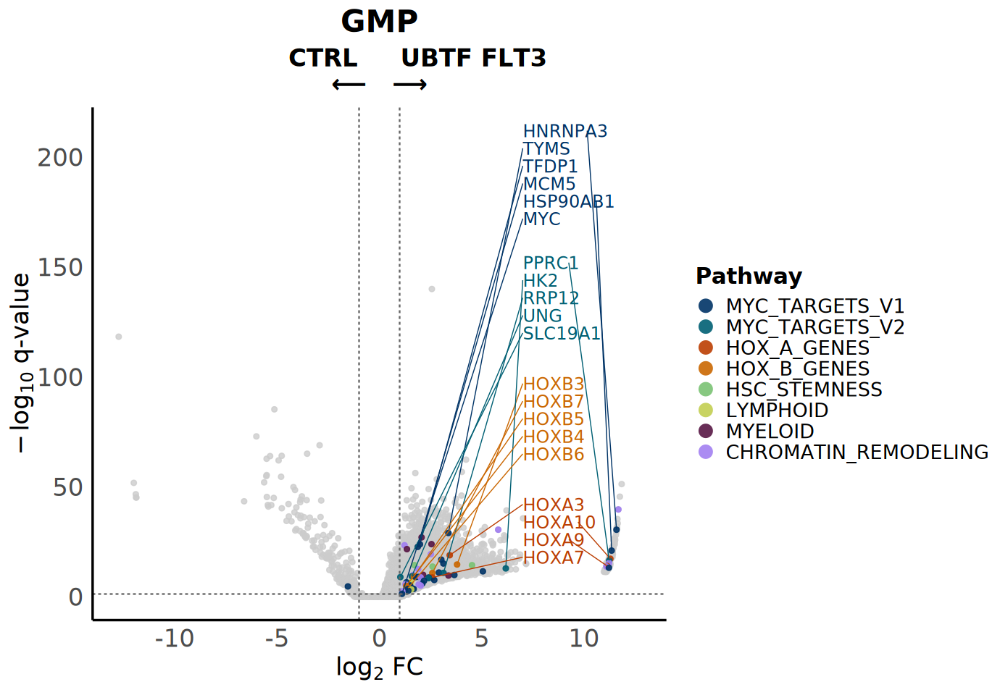

In [ ]:
options(repr.plot.width = 11.5, repr.plot.height = 8)

# --- DEG list and cell types to show ---
deg_list <- DEP_UBTF_FLT3_CTRL
celltypes_to_show <- c("GMP")

# --- Explicit pathway color mapping ---
ordered_pathways <- c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2", "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES", "HSC_STEMNESS", "LYMPHOID","MYELOID", "CHROMATIN_REMODELING")
pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS" = "#7AC273",
  "LYMPHOID" = "#C2CE51",
  "MYELOID" = "#581845",
  "CHROMATIN_REMODELING"   = "#A280F0"
)

# --- Gene-to-pathway mapping ---
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# --- Thresholds ---
logfc_cutoff <- 1
pval_cutoff <- 0.05

# --- Manual label positions for pathway groups ---
pathway_positions_df <- tibble(
  pathway = ordered_pathways,
  label_x = c(7, 7, 7, 7, 7, 7, 7, 7,7),
  y_start = c(220, 160, 50, 105, 240, 90, 90, 90,90),
  y_spacing = rep(-8, length(ordered_pathways))
)

# --- Plot loop ---
for (cell in intersect(celltypes_to_show, names(deg_list))) {
  deg_df <- deg_list[[cell]]

  if (!is.null(deg_df) && nrow(deg_df) > 0) {
    if (!"gene_label" %in% colnames(deg_df)) {
      deg_df$gene_label <- deg_df$gene
    }

    deg_df <- deg_df %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      mutate(log10_qval = -log10(p_val_adj)) %>%
      left_join(gene_to_pathway, by = "gene_label")

    sig_pathway_genes <- deg_df %>%
      filter(!is.na(pathway), abs(avg_log2FC) >= logfc_cutoff, p_val_adj < pval_cutoff)

    # --- Add top MYC pathway genes ---
    myc_top <- sig_pathway_genes %>%
      filter(pathway %in% c("HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2")) %>%
      group_by(pathway) %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5) %>%
      ungroup()

    # --- Add top MHC pathway genes ---
    mhc_top <- sig_pathway_genes %>%
      filter(pathway == "MHC_CLASS_I_II_GENES") %>%
      arrange(desc(log10_qval)) %>%
      slice_head(n = 5)

    pathway_top_labeled <- bind_rows(myc_top, mhc_top)

    # --- Dynamically find all significant HOX B genes ---
    hoxb_genes <- sig_pathway_genes %>%
      filter(grepl("^HOXB", gene_label)) %>%
      pull(gene_label)

    # --- Label genes (including HOXA and HOXB) ---
    label_genes <- c(
      "MYC", "HOXA9", "HOXA10", "HOXA7", "HOXA5", "HOXA3", "HOXA4",
      "HOXA6", hoxb_genes
    )

    sig_pathway_labeled <- sig_pathway_genes %>%
      filter(gene_label %in% label_genes) %>%
      bind_rows(pathway_top_labeled) %>%
      distinct(gene_label, .keep_all = TRUE)

    if (nrow(sig_pathway_labeled) > 0) {
      sig_pathway_labeled <- sig_pathway_labeled %>%
        inner_join(pathway_positions_df, by = "pathway") %>%
        group_by(pathway) %>%
        arrange(desc(log10_qval)) %>%
        mutate(
          label_y = y_start + row_number() * y_spacing,
          label_side = ifelse(avg_log2FC > label_x, "right", "left"),
          label_x_fixed = label_x,
          hjust_val = 0,
          label_width = 0.45 * nchar(gene_label),
          segment_xend = ifelse(label_side == "right",
                                label_x_fixed + label_width,
                                label_x_fixed)
        ) %>%
        ungroup()
    } else {
      sig_pathway_labeled <- data.frame()
    }

    # --- Color legend formatting ---
    concordance_labels <- sig_pathway_genes %>%
      group_by(pathway) %>%
      summarise(
        pos = sum(avg_log2FC > 0),
        neg = sum(avg_log2FC < 0),
        total = n(),
        .groups = "drop"
      ) %>%
      mutate(
        pct = ifelse(pos >= neg, round(100 * pos / total), round(100 * neg / total)),
        direction = ifelse(pos >= neg, "+LFC", "-LFC"),
        label = gsub("HALLMARK_", "", pathway)
      ) %>%
      arrange(match(pathway, ordered_pathways))

    sig_pathway_genes$pathway <- factor(sig_pathway_genes$pathway, levels = ordered_pathways)
    sig_pathway_labeled$pathway <- factor(sig_pathway_labeled$pathway, levels = ordered_pathways)
    pretty_labels <- setNames(concordance_labels$label, concordance_labels$pathway)

    # --- Plot ---
    max_x <- max(abs(deg_df$avg_log2FC), na.rm = TRUE)

    p <- ggplot() +
      xlim(-max_x, max_x) +
      geom_point(data = deg_df, aes(x = avg_log2FC, y = log10_qval),
                 color = "gray80", alpha = 0.8) +
      geom_point(data = sig_pathway_genes,
                 aes(x = avg_log2FC, y = log10_qval, color = pathway),
                 alpha = 0.9) +
      geom_segment(
        data = sig_pathway_labeled,
        aes(x = avg_log2FC, y = log10_qval, xend = segment_xend, yend = label_y, color = pathway),
        size = 0.3, show.legend = FALSE
      ) +
      geom_text(
        data = sig_pathway_labeled,
        aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
        size = 5, show.legend = FALSE
      ) +
      geom_hline(yintercept = -log10(pval_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      geom_vline(xintercept = c(-logfc_cutoff, logfc_cutoff), linetype = "dashed", color = "gray40", linewidth = 0.5) +
      scale_color_manual(
        values = pathway_colors,
        breaks = ordered_pathways,
        labels = pretty_labels[ordered_pathways],
        name = "Pathway",
        guide = guide_legend(override.aes = list(shape = 16, size = 5))
      ) +
      labs(
        title = cell,
        subtitle = "         CTRL     UBTF FLT3\n⟵   ⟶",
        x = expression(log[2]~"FC"),
        y = expression(-log[10]~"q-value")
      ) +
      theme_minimal(base_size = 16) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold", size = 25),
        plot.subtitle = element_text(hjust = 0.5, size = 20, face = "bold"),
        axis.title.x = element_text(size = 20),
        axis.title.y = element_text(size = 20),
        axis.text = element_text(size = 20),
        legend.position = "right",
        legend.title = element_text(size = 18, face = "bold"),
        legend.text = element_text(size = 16),
        panel.grid = element_blank(),
        axis.line = element_line(color = "black")
      )

    print(p)
  } else {
    warning(paste("Skipping", cell, "because no DEG results were found."))
  }
}

### heatmaps

No legend element is put in the last 1 row under `nrow = 15`, maybe you
should set `by_row = FALSE`? Reset `nrow` to 14.



pdf 
  2

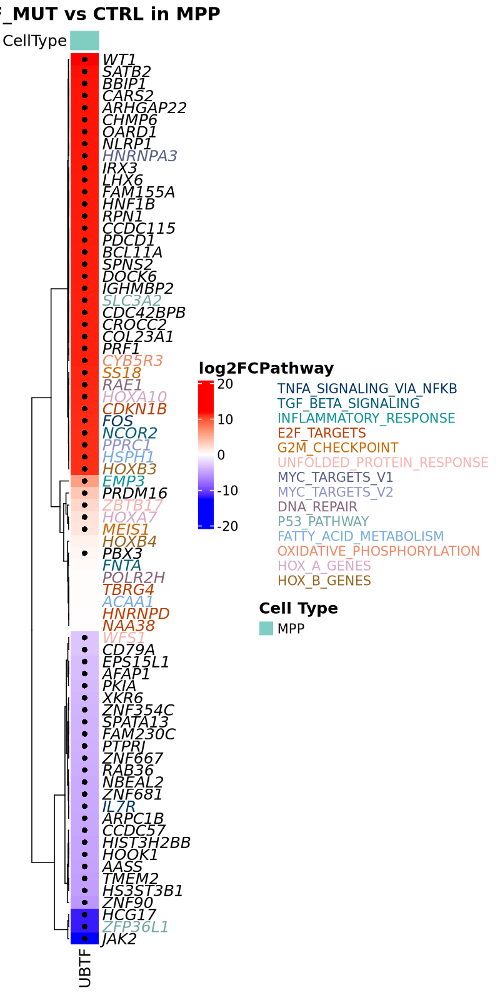

In [ ]:
# === Top annotation for cell type ===
celltype_pal <- c(
  "B" = "#E41A1C", "Pro-B" = "#D7301F", "Plasma cell" = "#B2182B",
  "Plasmablast" = "#8C1515", "Perivascular cell" = "#C49A00",
  "pDC" = "#DC2D8D", "NK" = "#FDDC93", "CD8+ T" = "#7B3294",
  "CD4+ T" = "#9970AB", "Ery" = "#EABC90", "DC precursor" = "#F660B9",
  "cDC2" = "#76168E", "cDC1" = "#C51B7D", "HLA-II+ monocyte" = "#E66101",
  "CD16+ monocyte" = "#F4A582", "CD14+ monocyte" = "#FDDBC7",
  "CD11c+" = "#D6604D", "LymP" = "#2166AC", "MEP" = "#4393C3",
  "Granulocyte" = "#D73027", "GMP" = "#3DC0BE", "MPP" = "#80CDC1",
  "HSC" = "#A6DBA0"
)

# Legend for cell types
celltype_legend <- Legend(
  title = "Cell Type",
  at = "MPP",
  labels = "MPP",
  legend_gp = gpar(fill = celltype_pal["MPP"]),
  title_gp = gpar(fontsize = 12, fontface = "bold")
)


# === Selected Pathways ===
selected_pathways <- c(
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB", 
  "HALLMARK_TGF_BETA_SIGNALING", 
  "HALLMARK_INFLAMMATORY_RESPONSE", 
  "HALLMARK_E2F_TARGETS",  
  "HALLMARK_G2M_CHECKPOINT",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE",
  "HALLMARK_MYC_TARGETS_V1",
  "HALLMARK_MYC_TARGETS_V2",
  "HALLMARK_DNA_REPAIR",
  "HALLMARK_P53_PATHWAY",
  "HALLMARK_FATTY_ACID_METABOLISM",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION",
  "HOX_A_GENES",
  "HOX_B_GENES"
)

# === Custom palette ===
pal_use_man <- c(
  "#003366", "#005F73", "#0A9396", "#BB3E03", "#CA6702", "#F7B2AD",
  "#585d86", "#8D91C7", "#866577", "#70A9A1", "#77AADD",
  "#EE8866", "#D4A6C8", "#99621E", "#805E73"
)
names(pal_use_man) <- gsub("HALLMARK_", "", selected_pathways)

# === Build gene to pathway mapping ===
gene_to_pathway <- lapply(selected_pathways, function(pathway) {
  genes <- gene_sets[[pathway]]
  setNames(rep(pathway, length(genes)), genes)
}) |> unlist()

# === Extract and clean MPP DEGs ===
deg_mpp <- DEP_UBTF_FLT3_CTRL[["MPP"]] %>%
  distinct(gene_label, .keep_all = TRUE) %>%
  filter(!is.na(avg_log2FC), !is.na(p_val_adj), p_val_adj < 0.05) %>%
  filter(!grepl("^AC[0-9]+\\.|^AL[0-9]+\\.|^LINC|orf|\\.|\\-|DT$", gene_label))

# === Get top 25 up and downregulated ===
top_up <- deg_mpp %>% filter(avg_log2FC > 0) %>% arrange(desc(avg_log2FC)) %>% slice_head(n = 25)
top_down <- deg_mpp %>% filter(avg_log2FC < 0) %>% arrange(avg_log2FC) %>% slice_head(n = 25)

# === Add 1 gene per pathway with top + and - log2FC ===
pathway_genes_df <- lapply(selected_pathways, function(pw) {
  pathway_genes <- gene_sets[[pw]]
  matched <- deg_mpp %>% filter(gene_label %in% pathway_genes)
  if (nrow(matched) == 0) return(NULL)
  bind_rows(
    matched %>% arrange(desc(avg_log2FC)) %>% slice_head(n = 1),
    matched %>% arrange(avg_log2FC) %>% slice_head(n = 1)
  )
}) %>% bind_rows()

# === Combine unique genes ===
selected_genes <- bind_rows(top_up, top_down, pathway_genes_df) %>%
  distinct(gene_label, .keep_all = TRUE)

# === Force include MYC, MEIS1, PRDM16, PBX3 ===
forced_genes <- c("MYC", "MEIS1", "PRDM16", "PBX3")
forced_gene_rows <- DEP_UBTF_FLT3_CTRL[["MPP"]] %>%
  filter(gene_label %in% forced_genes) %>%
  distinct(gene_label, .keep_all = TRUE)

selected_genes <- bind_rows(
  selected_genes,
  forced_gene_rows %>% filter(!gene_label %in% selected_genes$gene_label)
)

# === Build matrix ===
avg_df <- selected_genes %>%
  dplyr::select(gene_label, avg_log2FC) %>%
  as.data.frame()

rownames(avg_df) <- avg_df$gene_label
avg_df$gene_label <- NULL
avg_matrix <- as.matrix(avg_df)
colnames(avg_matrix) <- "UBTF"

# Top annotation (just 1 column, labeled as MPP)
top_annot <- HeatmapAnnotation(
  CellType = anno_simple(
    rep("MPP", ncol(avg_matrix)),
    col = celltype_pal, 
    border = FALSE
  ),
  show_annotation_name = TRUE,
  annotation_name_side = "left"
)

# === Assign pathway label and color ===
gene_pathways <- gene_to_pathway[rownames(avg_matrix)]
gene_pathways_clean <- gsub("HALLMARK_", "", gene_pathways)
label_colors <- pal_use_man[gene_pathways_clean]
label_colors[is.na(label_colors)] <- "black"

# === Row annotation ===
row_names_style <- gpar(fontface = "italic", col = label_colors)

# === Pathway legend ===
pathway_legend <- Legend(
  labels = names(pal_use_man),
  title = "Pathway",
  legend_gp = gpar(col = pal_use_man),
  labels_gp = gpar(col = pal_use_man),
  title_gp = gpar(fontsize = 12, fontface = "bold"),
  ncol = 1
)
# === Precompute which genes are significant
sig_genes <- DEP_UBTF_FLT3_CTRL[["MPP"]] %>%
  filter(!is.na(avg_log2FC), !is.na(p_val_adj)) %>%
  filter(p_val_adj < 0.05 & abs(avg_log2FC) >= 1) %>%
  pull(gene_label)

# === Create a binary significance vector for fast lookup
is_sig <- rownames(avg_matrix) %in% sig_genes
names(is_sig) <- rownames(avg_matrix)

# === Heatmap ===
ht <- Heatmap(
  avg_matrix,
  name = "log2FC",
  col = colorRamp2(c(min(avg_matrix), 0, max(avg_matrix)), c("blue", "white", "red")),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  show_column_names = TRUE,
  show_row_names = TRUE,
  row_names_gp = row_names_style,
  column_title = "UBTF_MUT vs CTRL in MPP",
  column_title_gp = gpar(fontsize = 14, fontface = "bold"),
  top_annotation = top_annot,
  heatmap_legend_param = list(
    title = "log2FC",
    title_gp = gpar(fontsize = 12, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    gene_name <- rownames(avg_matrix)[i]
    if (is_sig[gene_name]) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

# === Display & Save ===
png("heatmap_complex_pathway_labels.png", width = 800, height = 1600, res = 150)
draw(
  ht,
  annotation_legend_list = list(pathway_legend, celltype_legend),
  heatmap_legend_side = "right",
  annotation_legend_side = "right"
)
dev.off()

IRdisplay::display_png(file = "heatmap_complex_pathway_labels.png")

In [ ]:

print(rownames(avg_matrix))


 [1] "WT1"       "SATB2"     "BBIP1"     "CARS2"     "ARHGAP22"  "CHMP6"    
 [7] "OARD1"     "NLRP1"     "HNRNPA3"   "IRX3"      "LHX6"      "FAM155A"  
[13] "HNF1B"     "RPN1"      "CCDC115"   "PDCD1"     "BCL11A"    "SPNS2"    
[19] "DOCK6"     "IGHMBP2"   "SLC3A2"    "CDC42BPB"  "CROCC2"    "COL23A1"  
[25] "PRF1"      "JAK2"      "ZFP36L1"   "HCG17"     "ZNF90"     "HS3ST3B1" 
[31] "TMEM2"     "AASS"      "HOOK1"     "HIST3H2BB" "CCDC57"    "ARPC1B"   
[37] "IL7R"      "ZNF681"    "NBEAL2"    "RAB36"     "ZNF667"    "PTPRJ"    
[43] "FAM230C"   "SPATA13"   "ZNF354C"   "XKR6"      "PKIA"      "AFAP1"    
[49] "EPS15L1"   "CD79A"     "FOS"       "NCOR2"     "FNTA"      "EMP3"     
[55] "CDKN1B"    "NAA38"     "SS18"      "HNRNPD"    "ZBTB17"    "WFS1"     
[61] "PPRC1"     "TBRG4"     "RAE1"      "POLR2H"    "HSPH1"     "ACAA1"    
[67] "CYB5R3"    "HOXA10"    "HOXA7"     "HOXB3"     "HOXB4"     "PRDM16"   
[73] "PBX3"      "MEIS1"    


In [ ]:
## expanding out into different cell types

In [104]:
# Force assign HOXB* genes to HOX_B_GENES
hoxb_genes <- grep("^HOXB", rownames(avg_matrix), value = TRUE)
gene_to_pathway[hoxb_genes] <- "HOX_B_GENES"

In [105]:
mutation_group_colors <- c(
  "CTRL"             = "grey",
  "UBTF_FLT3"        = "#98c1d9",
  "UBTF_FLT3_WT1"    = "#355070",
  "WT1_NPM1"         = "#eaac8b",
  "WT1_NPM1_FLT3"    = "#f3722c",
  "NPM1_FLT3"        = "#b56576",
  "NPM1_only"        = "#e56b6f",
  "Other"            = "white"
)

In [106]:
# Full pathway-to-color mapping (used in heatmap)
pal_use_man <- c(
  # Inflammation / Immune
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB"       = "#a50026",
  "HALLMARK_TGF_BETA_SIGNALING"            = "#d73027",
  "HALLMARK_INFLAMMATORY_RESPONSE"         = "#f46d43",

  #Proliferation / Cell Cycle
  "HALLMARK_E2F_TARGETS"                   = "#FDAE61",
  "HALLMARK_G2M_CHECKPOINT"                = "#FEE08B",

  #Stress / Apoptosis / Proteostasis
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE"     = "#A6D96A",
  "HALLMARK_P53_PATHWAY"                   = "#66BD63",

  #DNA / Repair
  "HALLMARK_DNA_REPAIR"                    = "#3288BD",

  #MYC targets (match pathway_colors)
  "HALLMARK_MYC_TARGETS_V1"                = "#003366",
  "HALLMARK_MYC_TARGETS_V2"                = "#005F73",

  #Metabolism / Mitochondria
  "HALLMARK_FATTY_ACID_METABOLISM"         = "#ABDDA4",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION"     = "#E6F598",

  #HOX genes (match pathway_colors)
  "HOX_A_GENES"                            = "#BB3E03",
  "HOX_B_GENES"                            = "#CA6702",

  #MHC Class I/II
  "MHC_CLASS_I_II_GENES"                   = "#F7B2AD"
)

pdf 
  2

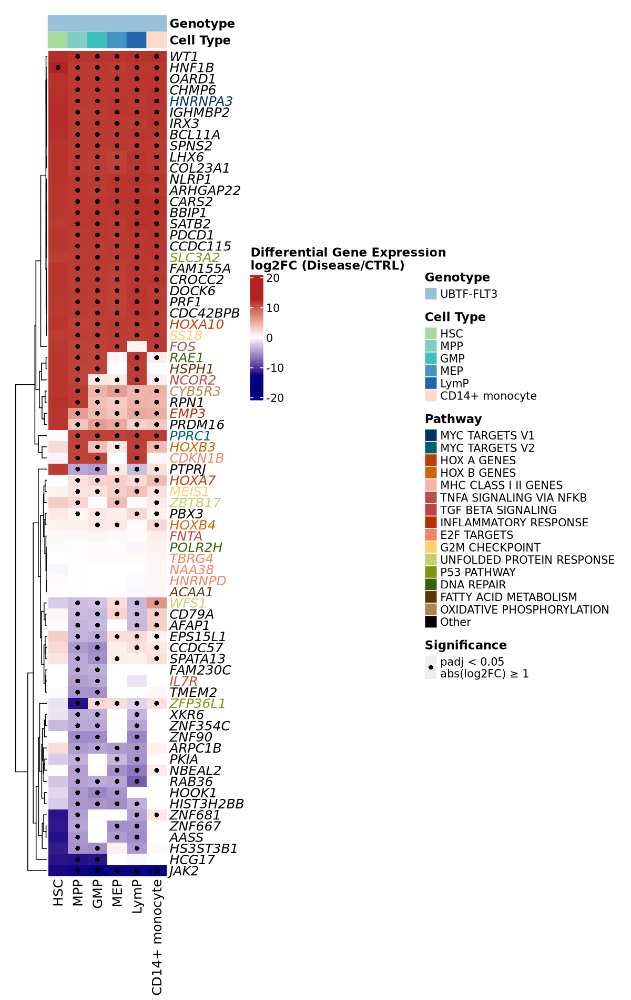

In [ ]:
# === Cell types to include
celltypes_use <- c("HSC", "MPP", "GMP","MEP", "LymP","CD14+ monocyte")

# === Reuse selected_genes from previous step
gene_list <- unique(selected_genes$gene_label)

# === Merge log2FC values across cell types
avg_df_all <- DEP_UBTF_FLT3_CTRL[[celltypes_use[1]]] %>%
  filter(gene_label %in% gene_list) %>%
  distinct(gene_label, .keep_all = TRUE) %>%
  dplyr::select(gene_label, avg_log2FC) %>%
  rename_with(~ celltypes_use[1], all_of("avg_log2FC"))

for (ct in celltypes_use[-1]) {
  df <- DEP_UBTF_FLT3_CTRL[[ct]] %>%
    filter(gene_label %in% gene_list) %>%
    distinct(gene_label, .keep_all = TRUE) %>%
    dplyr::select(gene_label, avg_log2FC) %>%
    rename_with(~ ct, all_of("avg_log2FC"))

  avg_df_all <- full_join(avg_df_all, df, by = "gene_label")
}

# === Convert to matrix
avg_df_all <- column_to_rownames(avg_df_all, "gene_label")
avg_df_all[is.na(avg_df_all)] <- 0
avg_df_all <- avg_df_all[gene_list, ]
avg_matrix_multi <- as.matrix(avg_df_all)

# === Top annotation for cell types
top_annot_multi <- HeatmapAnnotation(
  "Genotype" = anno_simple(
    rep("UBTF", ncol(avg_matrix_multi)),
    col = c("UBTF" = "#98c1d9"),
    border = FALSE
  ),
  "Cell Type" = anno_simple(
    colnames(avg_matrix_multi),
    col = celltype_pal,
    border = FALSE
  ),
  show_annotation_name = TRUE,
  annotation_name_side = "right",
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Manual named color mapping (ordered)
pal_use_man <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES" = "#BB3E03",
  "HOX_B_GENES" = "#CA6702",
  "MHC_CLASS_I_II_GENES" = "#F7B2AD",
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB" = "#b65149",
  "HALLMARK_TGF_BETA_SIGNALING" = "#bf4342",
  "HALLMARK_INFLAMMATORY_RESPONSE" = "#B62E04",
  "HALLMARK_E2F_TARGETS" = "#F08463",
  "HALLMARK_G2M_CHECKPOINT" = "#FFCE6D",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE" = "#C3D166",
  "HALLMARK_P53_PATHWAY" = "#829312",
  "HALLMARK_DNA_REPAIR" = "#366408",
  "HALLMARK_FATTY_ACID_METABOLISM" = "#5F3706",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION" = "#B1834A"
)

# === Pathway mapping and coloring
gene_pathways <- gene_to_pathway[rownames(avg_matrix_multi)]
gene_pathways[is.na(gene_pathways)] <- "Other"

# Use original keys in pal_use_man
label_colors <- pal_use_man
label_colors["Other"] <- "black"

# Map pathway to color
gene_label_colors <- label_colors[gene_pathways]
names(gene_label_colors) <- rownames(avg_matrix_multi)


# Set order based on pal_use_man (ensures legend follows this order)
ordered_pathways <- names(pal_use_man)
ordered_colors <- pal_use_man

# Add "Other" if not already there
if (!"Other" %in% ordered_pathways) {
  ordered_pathways <- c(ordered_pathways, "Other")
  ordered_colors["Other"] <- "black"
}

pathway_legend <- Legend(
  title = "Pathway",
  at = ordered_pathways,
  labels = gsub("_", " ", gsub("HALLMARK_", "", ordered_pathways)),
  legend_gp = gpar(fill = ordered_colors[ordered_pathways]),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

celltype_legend <- Legend(
  title = "Cell Type",
  at = celltypes_use,
  labels = celltypes_use,
  legend_gp = gpar(fill = celltype_pal[celltypes_use]),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

sig_matrix <- sapply(celltypes_use, function(ct) {
  sig_genes <- DEP_UBTF_FLT3_CTRL[[ct]] %>%
    filter(!is.na(avg_log2FC), !is.na(p_val_adj)) %>%
    filter(p_val_adj < 0.05 & abs(avg_log2FC) >= 1) %>%
    pull(gene_label)
  rownames(avg_matrix_multi) %in% sig_genes
})
rownames(sig_matrix) <- rownames(avg_matrix_multi)

ht_multi <- Heatmap(
  avg_matrix_multi,
  name = "log2FC",
  col = colorRamp2(
    c(min(avg_matrix_multi), 0, max(avg_matrix_multi)),
    c("navy", "white", "firebrick")
  ),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  show_column_names = TRUE,
  show_row_names = TRUE,
  row_names_side = "right",
  row_names_gp = gpar(col = gene_label_colors, fontface = "italic"),
  column_title = "",
  column_title_gp = gpar(fontsize = 11, fontface = "bold"),
  top_annotation = top_annot_multi,
  heatmap_legend_param = list(
    title = "Differential Gene Expression \nlog2FC (Disease/CTRL)",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (sig_matrix[i, j]) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

spacer_legend <- Legend(
  title = NULL,
  at = "",
  labels = "",
  legend_gp = gpar(fill = NA, col = NA),
  title_gp = gpar(fontsize = 1),
  labels_gp = gpar(fontsize = 1)
)

mutation_legend <- Legend(
  title = "Genotype",
  at = c("UBTF"),
  labels = c("UBTF-FLT3"),
  legend_gp = gpar(fill = c("UBTF" = "#98c1d9")),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

significance_legend <- Legend(
  title = "Significance",
  legend_gp = gpar(col = "black"),
  type = "points",
  pch = 16,
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

png("heatmap_complex_pathway_labels.png", width = 1200, height = 1900, res = 150)
draw(
  ht_multi,
  annotation_legend_list = list(spacer_legend, mutation_legend, celltype_legend, pathway_legend, significance_legend),
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  padding = unit(c(5, 5, 5, 5), "mm")
)
dev.off()

IRdisplay::display_png(file = "heatmap_complex_pathway_labels.png")

In [ ]:
## keeping the same genes as above, adding other mutation groups 

In [ ]:
mutation_group_colors <- c(
  "CTRL"             = "grey",
  "UBTF_FLT3"        = "#98c1d9",
  "UBTF_FLT3_WT1"    = "#355070",
  "WT1_NPM1"         = "#eaac8b",
  "WT1_NPM1_FLT3"    = "#f3722c",
  "NPM1_FLT3"        = "#b56576",
  "NPM1_only"        = "#e56b6f",
  "Other"            = "white"
)

pdf 
  2

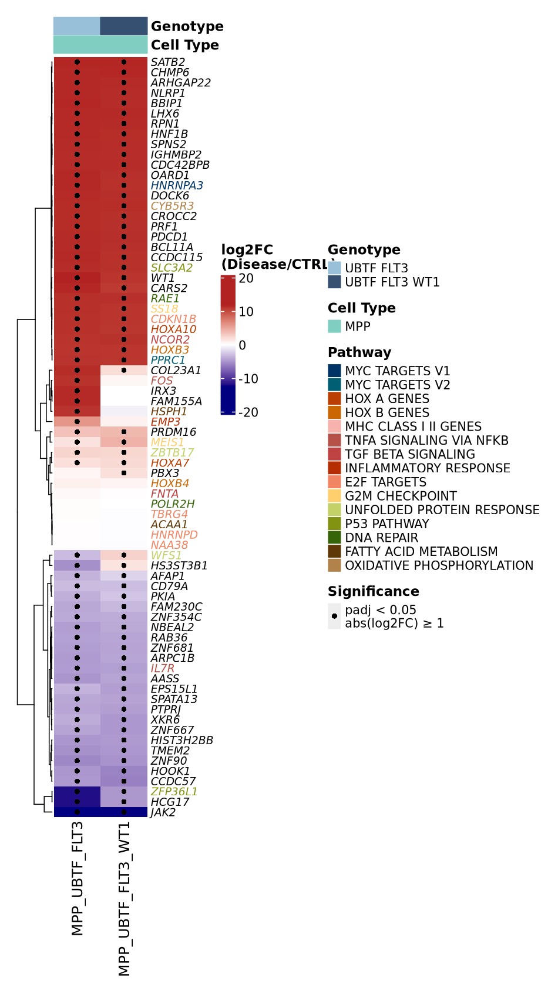

In [ ]:
## ---- parameters ----
celltypes_use   <- c("MPP")
gene_list       <- unique(selected_genes$gene_label)
gene_list_all   <- gene_list

DEP_lists <- list(
  UBTF_FLT3      = DEP_UBTF_FLT3_CTRL,
  UBTF_FLT3_WT1  = DEP_UBTF_FLT3_WT1mut_CTRL
)

mutation_colors <- c(
  UBTF_FLT3      = "#98c1d9",
  UBTF_FLT3_WT1  = "#355070"
)

default_ct_col <- "grey80"

## ---- manual pathway color mapping ----
pal_use_man <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES" = "#BB3E03",
  "HOX_B_GENES" = "#CA6702",
  "MHC_CLASS_I_II_GENES" = "#F7B2AD",
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB" = "#b65149",
  "HALLMARK_TGF_BETA_SIGNALING" = "#bf4342",
  "HALLMARK_INFLAMMATORY_RESPONSE" = "#B62E04",
  "HALLMARK_E2F_TARGETS" = "#F08463",
  "HALLMARK_G2M_CHECKPOINT" = "#FFCE6D",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE" = "#C3D166",
  "HALLMARK_P53_PATHWAY" = "#829312",
  "HALLMARK_DNA_REPAIR" = "#366408",
  "HALLMARK_FATTY_ACID_METABOLISM" = "#5F3706",
  "HALLMARK_OXIDATIVE_PHOSPHORYLATION" = "#B1834A"
)

## ---- construct unified matrix ----
combined_df <- NULL
combined_sig <- NULL
colnames_list <- c()

for (group_name in names(DEP_lists)) {
  DEP <- DEP_lists[[group_name]]

  for (ct in celltypes_use) {
    colname <- paste(ct, group_name, sep = "_")
    df_ct <- DEP[[ct]] %>%
      filter(gene_label %in% gene_list_all) %>%
      distinct(gene_label, .keep_all = TRUE) %>%
      dplyr::select(gene_label, avg_log2FC, p_val_adj) %>%
      mutate(sig = p_val_adj < 0.05 & abs(avg_log2FC) >= 1)

    df_expr <- df_ct %>%
      dplyr::select(gene_label, avg_log2FC) %>%
      setNames(c("gene_label", colname))  # Rename here

    df_sig <- df_ct %>%
      dplyr::select(gene_label, sig) %>%
      setNames(c("gene_label", colname))  # Rename here

    combined_df <- if (is.null(combined_df)) df_expr else full_join(combined_df, df_expr, by = "gene_label")
    combined_sig <- if (is.null(combined_sig)) df_sig else full_join(combined_sig, df_sig, by = "gene_label")

    colnames_list <- c(colnames_list, colname)
  }
}

combined_df <- combined_df %>%
  right_join(tibble(gene_label = gene_list_all), by = "gene_label") %>%
  distinct(gene_label, .keep_all = TRUE) %>%
  replace(is.na(.), 0) %>%
  column_to_rownames("gene_label")

combined_sig <- combined_sig %>%
  right_join(tibble(gene_label = gene_list_all), by = "gene_label") %>%
  distinct(gene_label, .keep_all = TRUE) %>%
  mutate(across(everything(), ~replace(., is.na(.), FALSE))) %>%
  column_to_rownames("gene_label")

avg_matrix <- as.matrix(combined_df)
sig_matrix <- as.matrix(combined_sig)

## ---- gene label coloring ----
gene_pathways <- gene_to_pathway[rownames(avg_matrix)]
gene_pathways[is.na(gene_pathways)] <- "Other"
gene_label_colors <- pal_use_man[gene_pathways]
gene_label_colors[is.na(gene_label_colors)] <- "black"
names(gene_label_colors) <- rownames(avg_matrix)

## ---- annotation ----
col_ct <- sapply(strsplit(colnames(avg_matrix), "_"), `[`, 1)
col_group <- sapply(strsplit(colnames(avg_matrix), "_", fixed = TRUE), function(x) paste(x[-1], collapse = "_"))
col_group_display <- gsub("_", " ", col_group)

celltype_colors <- celltype_pal[celltypes_use]
celltype_colors[is.na(celltype_colors)] <- default_ct_col

top_annot <- HeatmapAnnotation(
  "Genotype" = anno_simple(col_group_display, col = setNames(mutation_colors, gsub("_", " ", names(mutation_colors)))),
  "Cell Type" = anno_simple(col_ct, col = celltype_colors),
  show_annotation_name = TRUE,
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold"),
  annotation_name_side = "right"
)

## ---- build heatmap ----
ht <- Heatmap(
  avg_matrix,
  name = "log2FC",
  col = colorRamp2(c(min(avg_matrix), 0, max(avg_matrix)), c("navy", "white", "firebrick")),
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  show_column_names = TRUE,
  show_row_names = TRUE,
  row_names_side = "right",
  row_names_gp = gpar(col = gene_label_colors, fontface = "italic", fontsize = 9),
  top_annotation = top_annot,
  heatmap_legend_param = list(
    title = "log2FC \n(Disease/CTRL)",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (sig_matrix[i, j]) {
      grid.points(x, y, pch = 16, gp = gpar(col = "black"), size = unit(2, "mm"))
    }
  }
)

## ---- legends ----
pathway_legend <- Legend(
  title = "Pathway",
  at = names(pal_use_man),
  labels = gsub("_", " ", gsub("HALLMARK_", "", names(pal_use_man))),
  legend_gp = gpar(fill = pal_use_man),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

celltype_legend <- Legend(
  title = "Cell Type",
  at = celltypes_use,
  labels = celltypes_use,
  legend_gp = gpar(fill = celltype_pal[celltypes_use]),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

significance_legend <- Legend(
  title = "Significance",
  legend_gp = gpar(col = "black"),
  type = "points",
  pch = 16,
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

mutation_legend <- Legend(
  title = "Genotype",
  at = gsub("_", " ", names(mutation_colors)),
  labels = gsub("_", " ", names(mutation_colors)),
  legend_gp = gpar(fill = mutation_colors),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)

## ---- save and display ----
png("combined_DEP_heatmaps_MPP.png", width = 950, height = 1700, res = 150)
draw(
  ht,
  annotation_legend_list = list(mutation_legend, celltype_legend, pathway_legend, significance_legend),
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  padding = unit(c(5, 5, 5, 5), "mm")
)
dev.off()

IRdisplay::display_png(file = "combined_DEP_heatmaps_MPP.png")

In [ ]:
### GSEA

In [ ]:
# Define paths
base_path <- "/gpfs/home/ml9675/aifantislab_ML/Projects/AML/data/atac_analysis/20250304_atac_rna_partiallyMatched_transfer/20250505_scATAC_scRNA_DEPs_DEGs/csvs_need_new_atac"
gsea_pth <- read.gmt("/gpfs/home/ml9675/becklab_ML/ref/gmts/combined_gene_sets_no_epithelial.gmt") %>%
  filter(grepl("^HALLMARK_|^PID_", term))

# List all CSV files excluding *_filtered.csv
all_csvs <- list.files(base_path, pattern = "\\.csv$", full.names = FALSE)
filtered_out <- grep("_filtered\\.csv$", all_csvs, value = TRUE, invert = TRUE)

# Create named list of file paths
DEG_files <- setNames(filtered_out, tools::file_path_sans_ext(filtered_out))

# Load and process data
DEG_data <- lapply(DEG_files, function(fname) {
  df <- read_csv(file.path(base_path, fname))
  
  # Rename gene column if not standard
  if (!"gene" %in% colnames(df)) {
    gene_col <- grep("gene", colnames(df), ignore.case = TRUE, value = TRUE)[1]
    if (!is.na(gene_col)) {
      df <- df %>% rename(gene = !!sym(gene_col))
    }
  }
  return(df)
})

In [73]:
names(DEG_data)

[1] "DEP_UBTF_FLT3_CTRL_allCT_unfiltered"                     
[2] "DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered"              
[3] "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_allCT_unfiltered"

In [ ]:
# Clone to new object name for clarity
gsea_results_unfilt <- list()

for (df_name in names(DEG_data)) {
  df <- DEG_data[[df_name]]
  
  if (!"gene" %in% colnames(df)) {
    message(paste("Skipping", df_name, "- missing 'gene' column"))
    next
  }
  
  celltype_col <- if ("cell_type" %in% colnames(df)) "cell_type" else if ("Cell_Type" %in% colnames(df)) "Cell_Type" else NULL

  if (is.null(celltype_col)) {
    message(paste("Skipping", df_name, "- missing cell type column"))
    next
  }

  for (ct in unique(df[[celltype_col]])) {
    message(paste("[Unfilt] Running GSEA on", df_name, "-", ct))
    
    df_ct <- df %>% filter(.data[[celltype_col]] == ct)
    
    gene_list <- df_ct$avg_log2FC
    names(gene_list) <- df_ct$gene
    
    # Keep full gene list — just clean for NA names
    gene_list <- gene_list[!is.na(names(gene_list)) & !duplicated(names(gene_list))]
    
    # Optional: Still limit to gene sets to make GSEA more efficient
    gene_list <- gene_list[names(gene_list) %in% gsea_pth$gene]
    
    # Optional: Skip if too few
    if (length(gene_list) < 5) {
      message(paste("Skipping", df_name, ct, "- too few genes"))
      next
    }

    gene_list <- sort(gene_list, decreasing = TRUE)
    
    gsea_result <- tryCatch({
      GSEA(
        geneList = gene_list,
        TERM2GENE = gsea_pth,
        pvalueCutoff = 1,  # No cutoff — retain all
        verbose = FALSE,
        nPermSimple = 10000,
        eps = 0
      )
    }, error = function(e) {
      message(paste("GSEA failed for", df_name, ct, ":", e$message))
      return(NULL)
    })
    
    result_name <- paste0("gsea_res_unfilt_", df_name, "_", ct)
    gsea_results_unfilt[[result_name]] <- gsea_result
  }
}

In [78]:
names(gsea_results_unfilt)

[1] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_CD14+ monocyte"                        
 [2] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_LymP"                                  
 [3] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_MEP"                                   
 [4] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_CD8+ T"                                
 [5] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_MPP"                                   
 [6] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_GMP"                                   
 [7] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_Granulocyte"                           
 [8] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_NK"                                    
 [9] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_CD4+ T"                                
[10] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_HSC"                                   
[11] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_pDC"                                   
[12] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_B"                                     
[13] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_Ery"                                   
[14] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_cDC2"                                  
[15] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_HLA-II+ monocyte"                      
[16] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_CD16+ monocyte"                        
[17] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_Plasma cell"                           
[18] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_cDC1"                                  
[19] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_CD11c+"                                
[20] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_Perivascular cell"                     
[21] "gsea_res_unfilt_DEP_UBTF_FLT3_CTRL_allCT_unfiltered_Pro-B"                                 
[22] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_CD14+ monocyte"                 
[23] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_LymP"                           
[24] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_MEP"                            
[25] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_CD8+ T"                         
[26] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_MPP"                            
[27] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_GMP"                            
[28] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_Granulocyte"                    
[29] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_NK"                             
[30] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_CD4+ T"                         
[31] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_HSC"                            
[32] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_pDC"                            
[33] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_B"                              
[34] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_Ery"                            
[35] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_cDC2"                           
[36] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_HLA-II+ monocyte"               
[37] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_CD16+ monocyte"                 
[38] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_Plasma cell"                    
[39] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_cDC1"                           
[40] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_CD11c+"                         
[41] "gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_CTRL_allCT_unfiltered_Perivascular cel

pdf 
  2

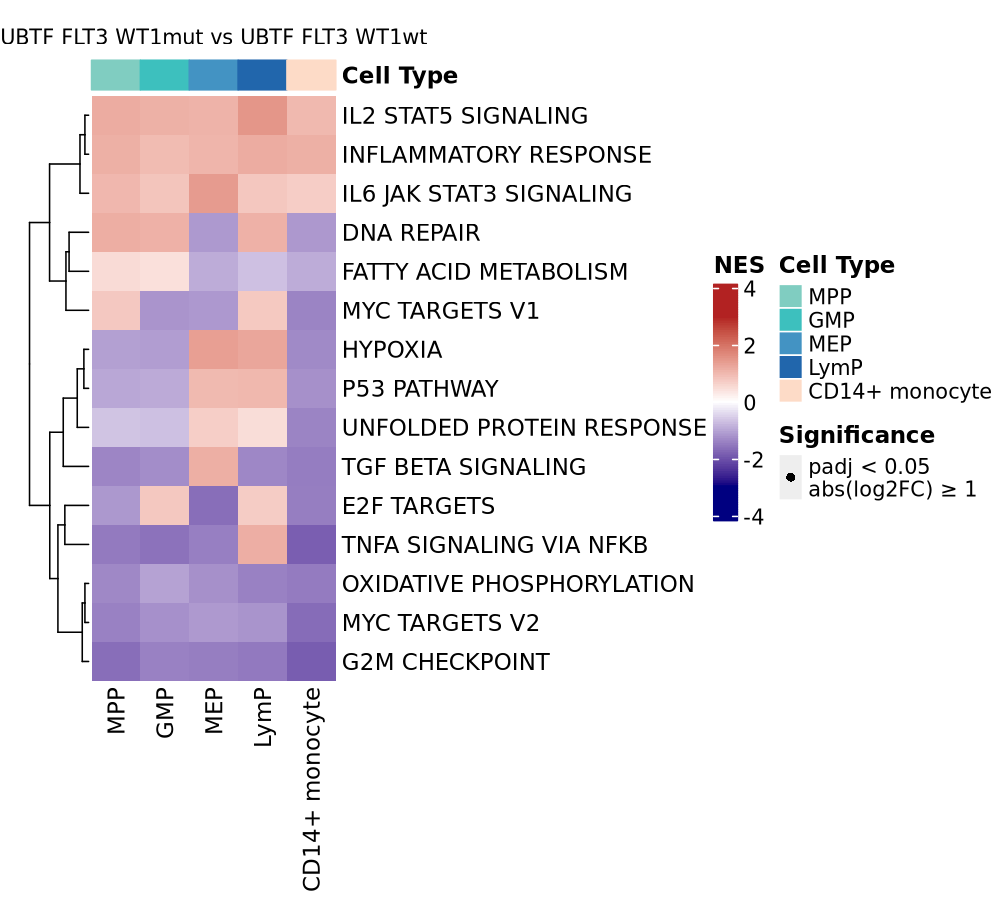

In [ ]:
# === Selected GSEA Pathways ===
selected_pathways_GSEA <- c(
  "HALLMARK_TNFA_SIGNALING_VIA_NFKB", "HALLMARK_HYPOXIA", "HALLMARK_TGF_BETA_SIGNALING",
  "HALLMARK_INFLAMMATORY_RESPONSE", "HALLMARK_E2F_TARGETS", "HALLMARK_G2M_CHECKPOINT",
  "HALLMARK_UNFOLDED_PROTEIN_RESPONSE", "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2",
  "HALLMARK_DNA_REPAIR", "HALLMARK_IL6_JAK_STAT3_SIGNALING", "HALLMARK_P53_PATHWAY",
  "HALLMARK_IL2_STAT5_SIGNALING", "HALLMARK_FATTY_ACID_METABOLISM", "HALLMARK_OXIDATIVE_PHOSPHORYLATION"
)

celltypes_use <- c("MPP", "GMP", "MEP", "LymP", "CD14+ monocyte")
row_labels <- gsub("_", " ", gsub("HALLMARK_", "", selected_pathways_GSEA))

# === Create NES and p-value matrices ===
nes_matrix <- matrix(NA, nrow = length(row_labels), ncol = length(celltypes_use),
                     dimnames = list(row_labels, celltypes_use))
pval_matrix <- nes_matrix
for (ct in celltypes_use) {
  res_name <- paste0("gsea_res_unfilt_DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_allCT_unfiltered_", ct)
  if (!res_name %in% names(gsea_results_unfilt)) next
  gsea_df <- as.data.frame(gsea_results_unfilt[[res_name]])
  
  if (!is.null(gsea_df)) {
    for (pathway in selected_pathways_GSEA) {
      rowname <- gsub("_", " ", gsub("HALLMARK_", "", pathway))
      value <- gsea_df %>% filter(ID == pathway)
      if (nrow(value) > 0) {
        nes_matrix[rowname, ct] <- value$NES
        pval_matrix[rowname, ct] <- value$p.adjust
      }
    }
  }
}

# === Significance asterisk ===
text_matrix <- ifelse(pval_matrix < 0.05, "*", "")

top_annot <- HeatmapAnnotation(
  "Cell Type" = anno_simple(colnames(nes_matrix), col = celltype_pal),
  annotation_name_side = "right",
  annotation_name_gp = gpar(fontsize = 11, fontface = "bold")
)

# === Legend: NES color function ===
col_fun <- colorRamp2(c(-3, 0, 3), c("navy", "white", "firebrick"))

# === Heatmap ===
ht_gsea <- Heatmap(
  nes_matrix,
  name = "NES",
  col = col_fun,
  cluster_rows = TRUE,
  cluster_columns = FALSE,
  top_annotation = top_annot,
  row_names_gp = gpar(fontsize = 11),
  column_names_gp = gpar(fontsize = 11),
  column_title = "UBTF FLT3 WT1mut vs UBTF FLT3 WT1wt",
  column_title_gp = gpar(fontsize = 10),
  column_names_rot = 90,
  heatmap_legend_param = list(
    title = "NES",
    title_gp = gpar(fontsize = 11, fontface = "bold"),
    labels_gp = gpar(fontsize = 10),
    legend_height = unit(40, "mm")
  ),
  cell_fun = function(j, i, x, y, width, height, fill) {
    if (!is.na(pval_matrix[i, j]) && pval_matrix[i, j] < 0.05) {
      grid.points(x = x, y = y, pch = 16, size = unit(2, "mm"), gp = gpar(col = "black"))
    }
  }
)

# === Significance asterisk legend ===
asterisk_legend <- Legend(
  title = "Significance",
  type = "points",
  labels = "padj < 0.05\nabs(log2FC) ≥ 1",
  pch = 16,
  labels_gp = gpar(fontsize = 10),
  title_gp = gpar(fontsize = 11, fontface = "bold")
)

# Subset and reverse the order of cell types
celltype_pal_sub <- rev(celltype_pal[names(celltype_pal) %in% celltypes_use])

# Generate Cell Type legend
celltype_legend <- Legend(
  title = "Cell Type",
  at = names(celltype_pal_sub),
  labels = names(celltype_pal_sub),
  legend_gp = gpar(fill = celltype_pal_sub),
  title_gp = gpar(fontsize = 11, fontface = "bold"),
  labels_gp = gpar(fontsize = 10)
)


# === Draw heatmap ===
png("gsea_heatmap_UBTF_selectedPathways.png", width = 1000, height = 900, res = 150)
draw(
  ht_gsea,
  annotation_legend_list = list(celltype_legend, asterisk_legend),
  annotation_legend_side = "right",
  heatmap_legend_side = "right",
  padding = unit(c(5, 5, 5, 5), "mm")
)
dev.off()

IRdisplay::display_png(file = "gsea_heatmap_UBTF_selectedPathways.png")

In [ ]:
## Genomic Reagions in ATAC

In [98]:
head(atac_merged@meta.data)

,orig.ident,nCount_peaks,nFeature_peaks,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,⋯,prediction.score.cDC1,prediction.score.max,patient.id,disease.state,tmp_patient_id,WT1_NPM1_mut,NPM1_mut,UBTF_mut,FLT3_mut,WT1_mut
,<chr>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>
AML0516_AAACGAAAGGAAACTT-1,SeuratProject,35232,14869,33801,5833,1,136,2247,38,8,⋯,0.00000000,0.4912395,AML0516,AML,AML0516,WT,WT,MUT,MUT,MUT
AML0516_AAACGAAAGGGCGAAG-1,SeuratProject,22974,9257,25057,5207,4,97,2291,567,0,⋯,0.01083254,0.3382093,AML0516,AML,AML0516,WT,WT,MUT,MUT,MUT
AML0516_AAACGAAAGTGCTGAG-1,SeuratProject,17527,7951,17980,2739,2,72,1499,49,8,⋯,0.00000000,0.7264390,AML0516,AML,AML0516,WT,WT,MUT,MUT,MUT
AML0516_AAACGAAAGTTATGAG-1,SeuratProject,26295,11762,25691,4318,1,88,1671,125,7,⋯,0.05348188,0.2343385,AML0516,AML,AML0516,WT,WT,MUT,MUT,MUT
AML0516_AAACGAACAAGATTAG-1,SeuratProject,31029,13267,29809,5424,2,103,1824,68,4,⋯,0.00000000,0.3167518,AML0516,AML,AML0516,WT,WT,MUT,MUT,MUT
AML0516_AAACGAACAATAGTGA-1,SeuratProject,16994,7863,15861,2122,2,70,1091,48,9,⋯,0.00000000,0.5711375,AML0516,AML,AML0516,WT,WT,MUT,MUT,MUT


In [99]:
atac_merged

An object of class Seurat 
462019 features across 83426 samples within 2 assays 
Active assay: peaks (442399 features, 442399 variable features)
 2 layers present: counts, data
 1 other assay present: RNA
 2 dimensional reductions calculated: lsi, umap

In [12]:
# Add WT1_comut column based on conditions
atac_merged@meta.data <- atac_merged@meta.data %>%
  mutate(WT1_comut = case_when(
    disease.state == "AML" & UBTF_mut == "MUT" & WT1_mut == "MUT" ~ "UBTF FLT3 WT1",
    disease.state == "AML" & UBTF_mut == "MUT" & WT1_mut == "WT"  ~ "UBTF FLT3",
    disease.state == "CTRL"                                       ~ "CTRL",
    TRUE                                                          ~ NA_character_  # optional fallback
  ))

In [101]:
table(atac_merged@meta.data$WT1_comut)


         CTRL     UBTF FLT3 UBTF FLT3 WT1 
        30039         29988         23399 

In [16]:
# 1. Get unique group levels from WT1_comut
group_levels <- unique(atac_merged$WT1_comut)

# 2. Choose a color palette (you can customize this)
library(RColorBrewer)
palette <- brewer.pal(n = length(group_levels), name = "Set1")

# 3. Map colors to each group
group_colors <- setNames(palette, group_levels)


✅ Significantly differentially expressed in:
[1] "GMP" "HSC" "MPP"

❌ Not significantly differentially expressed in:
character(0)

--- Significant entries ---
# A tibble: 6 × 8
      p_val avg_log2FC pct.1 pct.2 p_val_adj peak           gene_label cell_type
      <dbl>      <dbl> <dbl> <dbl>     <dbl> <chr>          <chr>      <chr>    
1 0.00852       -0.430 0.143 0.163         1 chr7-27152183… HOXA3      GMP      
2 0.802         -0.122 0.244 0.225         1 chr7-27150486… HOXA3      GMP      
3 0.324         -1.09  0.116 0.175         1 chr7-27152183… HOXA3      HSC      
4 0.475         -0.602 0.186 0.228         1 chr7-27150486… HOXA3      HSC      
5 0.0000115     -0.430 0.143 0.165         1 chr7-27152183… HOXA3      MPP      
6 0.0144        -0.209 0.223 0.225         1 chr7-27150486… HOXA3      MPP      
📌 Highlighting first significant peak for HOXA3 in GMP 


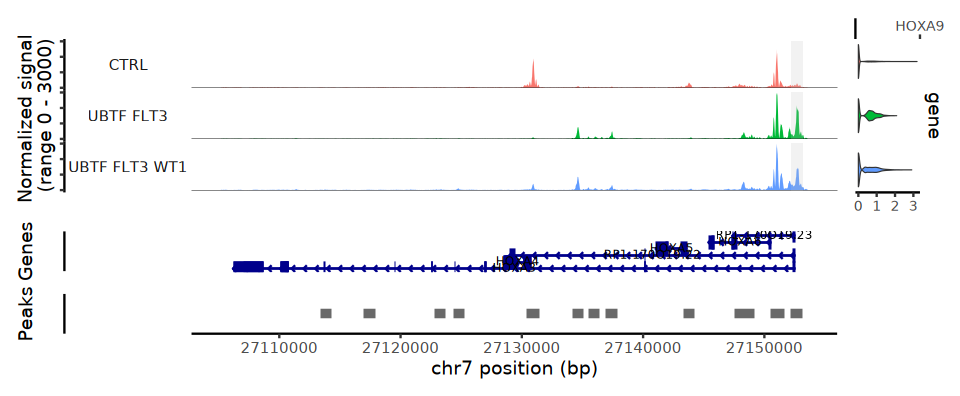

In [ ]:
# Define gene of interest and cell types
options(repr.plot.width = 8, repr.plot.height = 3.3)
gene <- "HOXA3"
cell_types <- c("HSC", "MPP", "GMP")
filtered_var_name <- "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt"

# Add temporary column for splitting (optional, safe fallback)
atac_merged$tmp_patient_id <- factor(atac_merged$WT1_comut)

# Load differential peak objects
dep_comparison <- get(filtered_var_name)
dep_comparison_nonsig <- get(gsub("_filtered$", "", filtered_var_name))

# Identify significant peaks for the gene
sig_hits <- lapply(names(dep_comparison), function(celltype) {
  df <- dep_comparison[[celltype]]
  df$cell_type <- celltype
  df %>% filter(gene_label == gene)
}) %>% bind_rows() %>%
  filter(cell_type %in% cell_types)

# Report significance results
cat("Significantly differentially expressed in:\n")
print(unique(sig_hits$cell_type))

cat("\nNot significantly differentially expressed in:\n")
print(setdiff(cell_types, unique(sig_hits$cell_type)))

cat("\n--- Significant entries ---\n")
print(sig_hits)

# Define highlighted region from first significant peak (if available)
regions_highlight <- NULL
if (nrow(sig_hits) > 0) {
  coords <- str_split(sig_hits$peak[1], "-", simplify = TRUE)
  chr <- coords[1]
  start <- as.numeric(coords[2])
  end <- as.numeric(coords[3])
  
  gene_coords <- LookupGeneCoords(atac_merged, gene)
  if (chr %in% as.character(seqnames(gene_coords))) {
    regions_highlight <- GRanges(seqnames = chr, ranges = IRanges(start, end))
    cat("Highlighting first significant peak for", gene, "in", sig_hits$cell_type[1], "\n")
  } else {
    warning("Chromosome mismatch between peak and gene coordinates.")
  }
} else {
  cat("ℹNo significant peak found — skipping highlight.\n")
}

# Plot coverage (without group_colors)
CoveragePlot(
  object = atac_merged,
  region = gene,
  region.highlight = regions_highlight,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  group.by = "WT1_comut",
  features = "HOXA9"
)


In [134]:
sig_hits

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,peak,gene_label,cell_type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
8.523052e-03,-0.4303027,0.143,0.163,1,chr7-27152183-27153120,HOXA3,GMP
8.016583e-01,-0.1222075,0.244,0.225,1,chr7-27150486-27151619,HOXA3,GMP
3.239911e-01,-1.0906851,0.116,0.175,1,chr7-27152183-27153120,HOXA3,HSC
4.753462e-01,-0.6023619,0.186,0.228,1,chr7-27150486-27151619,HOXA3,HSC
1.150425e-05,-0.4298407,0.143,0.165,1,chr7-27152183-27153120,HOXA3,MPP
1.438196e-02,-0.2093411,0.223,0.225,1,chr7-27150486-27151619,HOXA3,MPP


✅ Significantly differentially expressed in:
[1] "GMP" "HSC" "MPP"

❌ Not significantly differentially expressed in:
character(0)

--- Significant entries ---
# A tibble: 6 × 8
      p_val avg_log2FC pct.1 pct.2 p_val_adj peak           gene_label cell_type
      <dbl>      <dbl> <dbl> <dbl>     <dbl> <chr>          <chr>      <chr>    
1 0.00852       -0.430 0.143 0.163         1 chr7-27152183… HOXA3      GMP      
2 0.802         -0.122 0.244 0.225         1 chr7-27150486… HOXA3      GMP      
3 0.324         -1.09  0.116 0.175         1 chr7-27152183… HOXA3      HSC      
4 0.475         -0.602 0.186 0.228         1 chr7-27150486… HOXA3      HSC      
5 0.0000115     -0.430 0.143 0.165         1 chr7-27152183… HOXA3      MPP      
6 0.0144        -0.209 0.223 0.225         1 chr7-27150486… HOXA3      MPP      
📌 Highlighting first significant peak for HOXA3 in GMP 


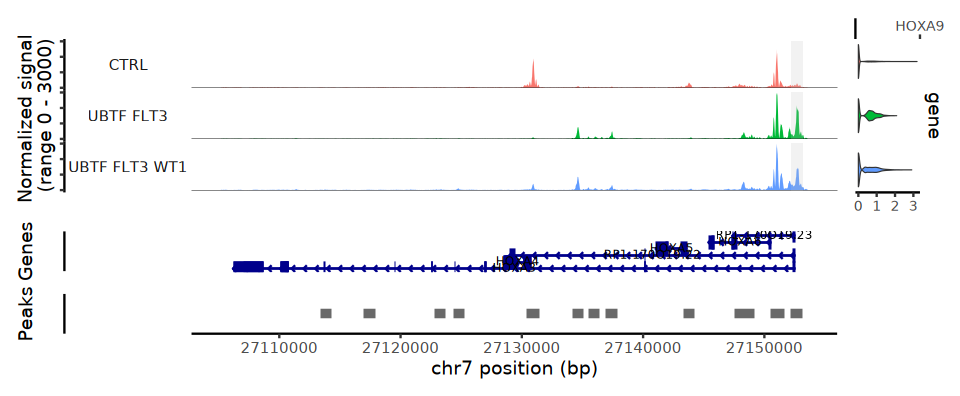

In [ ]:
# Define gene of interest and cell types
options(repr.plot.width = 8, repr.plot.height = 3.3)
gene <- "HOXA3"
cell_types <- c("HSC", "MPP", "GMP")
filtered_var_name <- "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt"

# Extract group levels and define color mapping
group_levels <- levels(factor(atac_merged$WT1_comut))
# Adjust color map to only include present groups
group_colors <- group_colors[names(group_colors) %in% levels(atac_merged$tmp_patient_id)]


# Add temporary column for splitting
atac_merged$tmp_patient_id <- factor(atac_merged$WT1_comut, levels = names(group_colors))

# Load differential peak objects
dep_comparison <- get(filtered_var_name)
dep_comparison_nonsig <- get(gsub("_filtered$", "", filtered_var_name))

# Identify significant peaks for the gene
sig_hits <- lapply(names(dep_comparison), function(celltype) {
  df <- dep_comparison[[celltype]]
  df$cell_type <- celltype
  df %>% filter(gene_label == gene)
}) %>% bind_rows() %>%
  filter(cell_type %in% cell_types)

# Report significance results
cat("Significantly differentially expressed in:\n")
print(unique(sig_hits$cell_type))

cat("\n Not significantly differentially expressed in:\n")
print(setdiff(cell_types, unique(sig_hits$cell_type)))

cat("\n--- Significant entries ---\n")
print(sig_hits)

# Define highlighted region from first significant peak (if available)
regions_highlight <- NULL
if (nrow(sig_hits) > 0) {
  coords <- str_split(sig_hits$peak[1], "-", simplify = TRUE)
  chr <- coords[1]
  start <- as.numeric(coords[2])
  end <- as.numeric(coords[3])
  
  gene_coords <- LookupGeneCoords(atac_merged, gene)
  if (chr %in% as.character(seqnames(gene_coords))) {
    regions_highlight <- GRanges(seqnames = chr, ranges = IRanges(start, end))
    cat("Highlighting first significant peak for", gene, "in", sig_hits$cell_type[1], "\n")
  } else {
    warning("Chromosome mismatch between peak and gene coordinates.")
  }
} else {
  cat("No significant peak found — skipping highlight.\n")
}

# Plot coverage
CoveragePlot(
  object = atac_merged,
  region = gene,
  region.highlight = regions_highlight,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  group.by = "WT1_comut",
  features = "HOXA9",
  #scale.factor = 1e4
  #split.by = "tmp_patient_id",
  #cols = group_colors 
  # links = TRUE  # uncomment if Cicero links are added
)

✅ Significantly differentially expressed in:
[1] "GMP" "HSC" "MPP"

❌ Not significantly differentially expressed in:
character(0)

--- Significant entries ---
# A tibble: 35 × 8
      p_val avg_log2FC pct.1 pct.2 p_val_adj peak           gene_label cell_type
      <dbl>      <dbl> <dbl> <dbl>     <dbl> <chr>          <chr>      <chr>    
 1 7.35e-36      1.54  0.193 0.06   3.25e-30 chr1-3078184-… PRDM16     GMP      
 2 4.47e-24      1.10  0.212 0.092  1.98e-18 chr1-3319621-… PRDM16     GMP      
 3 3.87e-23      1.50  0.128 0.04   1.71e-17 chr1-3351974-… PRDM16     GMP      
 4 2.82e-22      1.41  0.128 0.042  1.25e-16 chr1-3119540-… PRDM16     GMP      
 5 6.31e-16      0.796 0.231 0.125  2.79e-10 chr1-3093628-… PRDM16     GMP      
 6 1.08e- 8      0.444 0.307 0.209  4.77e- 3 chr1-3221926-… PRDM16     GMP      
 7 3.92e- 8      0.434 0.287 0.195  1.73e- 2 chr1-3312747-… PRDM16     GMP      
 8 1.15e- 7      0.613 0.123 0.069  5.08e- 2 chr1-3316230-… PRDM16     GMP      
 9 2.20e- 7 

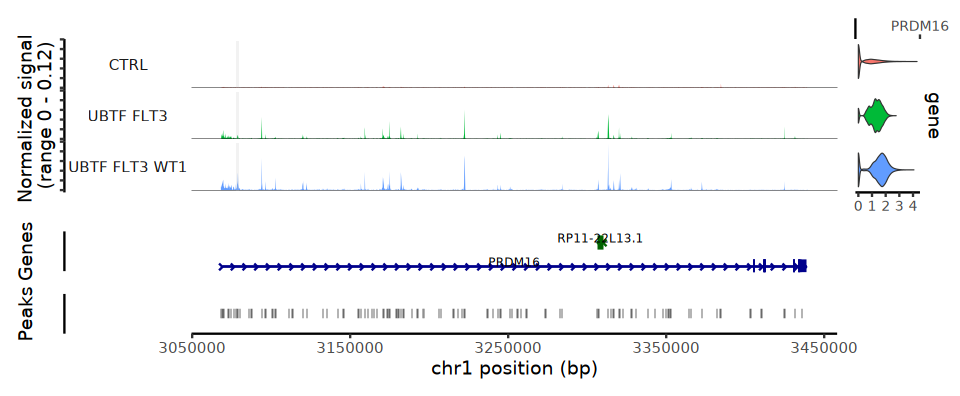

In [ ]:
# Define gene of interest and cell types
options(repr.plot.width = 8, repr.plot.height = 3.3)
gene <- "PRDM16"
cell_types <- c("HSC", "MPP", "GMP")
filtered_var_name <- "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt"

# Extract group levels and define color mapping
group_levels <- levels(factor(atac_merged$WT1_comut))
# Adjust color map to only include present groups
group_colors <- group_colors[names(group_colors) %in% levels(atac_merged$tmp_patient_id)]


# Add temporary column for splitting
atac_merged$tmp_patient_id <- factor(atac_merged$WT1_comut, levels = names(group_colors))

# Load differential peak objects
dep_comparison <- get(filtered_var_name)
dep_comparison_nonsig <- get(gsub("_filtered$", "", filtered_var_name))

# Identify significant peaks for the gene
sig_hits <- lapply(names(dep_comparison), function(celltype) {
  df <- dep_comparison[[celltype]]
  df$cell_type <- celltype
  df %>% filter(gene_label == gene)
}) %>% bind_rows() %>%
  filter(cell_type %in% cell_types)

# Report significance results
cat("Significantly differentially expressed in:\n")
print(unique(sig_hits$cell_type))

cat("\n Not significantly differentially expressed in:\n")
print(setdiff(cell_types, unique(sig_hits$cell_type)))

cat("\n--- Significant entries ---\n")
print(sig_hits)

# Define highlighted region from first significant peak (if available)
regions_highlight <- NULL
if (nrow(sig_hits) > 0) {
  coords <- str_split(sig_hits$peak[1], "-", simplify = TRUE)
  chr <- coords[1]
  start <- as.numeric(coords[2])
  end <- as.numeric(coords[3])
  
  gene_coords <- LookupGeneCoords(atac_merged, gene)
  if (chr %in% as.character(seqnames(gene_coords))) {
    regions_highlight <- GRanges(seqnames = chr, ranges = IRanges(start, end))
    cat("📌 Highlighting first significant peak for", gene, "in", sig_hits$cell_type[1], "\n")
  } else {
    warning(" Chromosome mismatch between peak and gene coordinates.")
  }
} else {
  cat(" No significant peak found — skipping highlight.\n")
}

# Plot coverage
CoveragePlot(
  object = atac_merged,
  region = gene,
  region.highlight = regions_highlight,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  group.by = "WT1_comut",
  features = "PRDM16",
  scale.factor = 1e4 #need?
  #split.by = "tmp_patient_id",
  #cols = group_colors 
  # links = TRUE  # uncomment if Cicero links are added
)

In [23]:
head(atac_merged@meta.data)

,orig.ident,nCount_peaks,nFeature_peaks,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,⋯,prediction.score.max,patient.id,disease.state,WT1_NPM1_mut,NPM1_mut,UBTF_mut,FLT3_mut,WT1_mut,WT1_comut,tmp_patient_id
,<chr>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>
AML0516_AAACGAAAGGAAACTT-1,SeuratProject,35232,14869,33801,5833,1,136,2247,38,8,⋯,0.4912395,AML0516,AML,WT,WT,MUT,MUT,MUT,UBTF FLT3 WT1,UBTF FLT3 WT1
AML0516_AAACGAAAGGGCGAAG-1,SeuratProject,22974,9257,25057,5207,4,97,2291,567,0,⋯,0.3382093,AML0516,AML,WT,WT,MUT,MUT,MUT,UBTF FLT3 WT1,UBTF FLT3 WT1
AML0516_AAACGAAAGTGCTGAG-1,SeuratProject,17527,7951,17980,2739,2,72,1499,49,8,⋯,0.7264390,AML0516,AML,WT,WT,MUT,MUT,MUT,UBTF FLT3 WT1,UBTF FLT3 WT1
AML0516_AAACGAAAGTTATGAG-1,SeuratProject,26295,11762,25691,4318,1,88,1671,125,7,⋯,0.2343385,AML0516,AML,WT,WT,MUT,MUT,MUT,UBTF FLT3 WT1,UBTF FLT3 WT1
AML0516_AAACGAACAAGATTAG-1,SeuratProject,31029,13267,29809,5424,2,103,1824,68,4,⋯,0.3167518,AML0516,AML,WT,WT,MUT,MUT,MUT,UBTF FLT3 WT1,UBTF FLT3 WT1
AML0516_AAACGAACAATAGTGA-1,SeuratProject,16994,7863,15861,2122,2,70,1091,48,9,⋯,0.5711375,AML0516,AML,WT,WT,MUT,MUT,MUT,UBTF FLT3 WT1,UBTF FLT3 WT1


✅ Significantly differentially expressed in:
[1] "GMP" "HSC" "MPP"

❌ Not significantly differentially expressed in:
character(0)

--- Significant entries ---
# A tibble: 25 × 8
      p_val avg_log2FC pct.1 pct.2 p_val_adj peak           gene_label cell_type
      <dbl>      <dbl> <dbl> <dbl>     <dbl> <chr>          <chr>      <chr>    
 1 9.61e-21      1.14  0.15  0.057  4.25e-15 chr2-25290770… DNMT3A     GMP      
 2 2.23e-17      0.739 0.296 0.173  9.85e-12 chr2-25294643… DNMT3A     GMP      
 3 4.25e-10      0.508 0.329 0.222  1.88e- 4 chr2-25209898… DNMT3A     GMP      
 4 2.04e- 6      0.374 0.257 0.182  9.01e- 1 chr2-25250457… DNMT3A     GMP      
 5 1.54e- 4      0.331 0.153 0.106  1   e+ 0 chr2-25206778… DNMT3A     GMP      
 6 7.58e- 3      0.132 0.19  0.145  1   e+ 0 chr2-25276711… DNMT3A     GMP      
 7 7.37e- 1     -0.111 0.319 0.289  1   e+ 0 chr2-25340012… DNMT3A     GMP      
 8 9.43e- 2      1.27  0.209 0.088  1   e+ 0 chr2-25294643… DNMT3A     HSC      
 9 1.01e- 1 

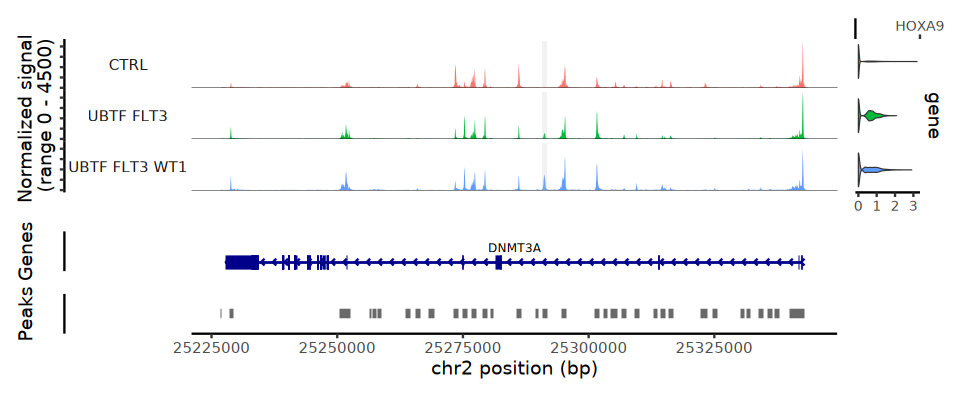

In [ ]:
# Define gene of interest and cell types
options(repr.plot.width = 8, repr.plot.height = 3.3)
gene <- "DNMT3A"
cell_types <- c("HSC", "MPP", "GMP")
filtered_var_name <- "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt"

# Add temporary column for splitting (optional, safe fallback)
atac_merged$tmp_patient_id <- factor(atac_merged$WT1_comut)

# Load differential peak objects
dep_comparison <- get(filtered_var_name)
dep_comparison_nonsig <- get(gsub("_filtered$", "", filtered_var_name))

# Identify significant peaks for the gene
sig_hits <- lapply(names(dep_comparison), function(celltype) {
  df <- dep_comparison[[celltype]]
  df$cell_type <- celltype
  df %>% filter(gene_label == gene)
}) %>% bind_rows() %>%
  filter(cell_type %in% cell_types)

# Report significance results
cat("Significantly differentially expressed in:\n")
print(unique(sig_hits$cell_type))

cat("\nNot significantly differentially expressed in:\n")
print(setdiff(cell_types, unique(sig_hits$cell_type)))

cat("\n--- Significant entries ---\n")
print(sig_hits)

# Define highlighted region from first significant peak (if available)
regions_highlight <- NULL
if (nrow(sig_hits) > 0) {
  coords <- str_split(sig_hits$peak[1], "-", simplify = TRUE)
  chr <- coords[1]
  start <- as.numeric(coords[2])
  end <- as.numeric(coords[3])
  
  gene_coords <- LookupGeneCoords(atac_merged, gene)
  if (chr %in% as.character(seqnames(gene_coords))) {
    regions_highlight <- GRanges(seqnames = chr, ranges = IRanges(start, end))
    cat("📌 Highlighting first significant peak for", gene, "in", sig_hits$cell_type[1], "\n")
  } else {
    warning("Chromosome mismatch between peak and gene coordinates.")
  }
} else {
  cat("No significant peak found — skipping highlight.\n")
}

# Plot coverage (without group_colors)
p <- CoveragePlot(
  object = atac_merged,
  region = gene,
  region.highlight = regions_highlight,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  group.by = "WT1_comut",
  features = "HOXA9"
)
p + 
  scale_fill_manual(values = c("Peaks" = "#495F09")) +
  guides(fill = "none")

✅ Significant in:
[1] "GMP" "HSC" "MPP"

❌ Not significant in:
character(0)

--- Significant entries ---
# A tibble: 25 × 8
      p_val avg_log2FC pct.1 pct.2 p_val_adj peak           gene_label cell_type
      <dbl>      <dbl> <dbl> <dbl>     <dbl> <chr>          <chr>      <chr>    
 1 9.61e-21      1.14  0.15  0.057  4.25e-15 chr2-25290770… DNMT3A     GMP      
 2 2.23e-17      0.739 0.296 0.173  9.85e-12 chr2-25294643… DNMT3A     GMP      
 3 4.25e-10      0.508 0.329 0.222  1.88e- 4 chr2-25209898… DNMT3A     GMP      
 4 2.04e- 6      0.374 0.257 0.182  9.01e- 1 chr2-25250457… DNMT3A     GMP      
 5 1.54e- 4      0.331 0.153 0.106  1   e+ 0 chr2-25206778… DNMT3A     GMP      
 6 7.58e- 3      0.132 0.19  0.145  1   e+ 0 chr2-25276711… DNMT3A     GMP      
 7 7.37e- 1     -0.111 0.319 0.289  1   e+ 0 chr2-25340012… DNMT3A     GMP      
 8 9.43e- 2      1.27  0.209 0.088  1   e+ 0 chr2-25294643… DNMT3A     HSC      
 9 1.01e- 1     -2.16  0.047 0.14   1   e+ 0 chr2-25206778… DNMT3A

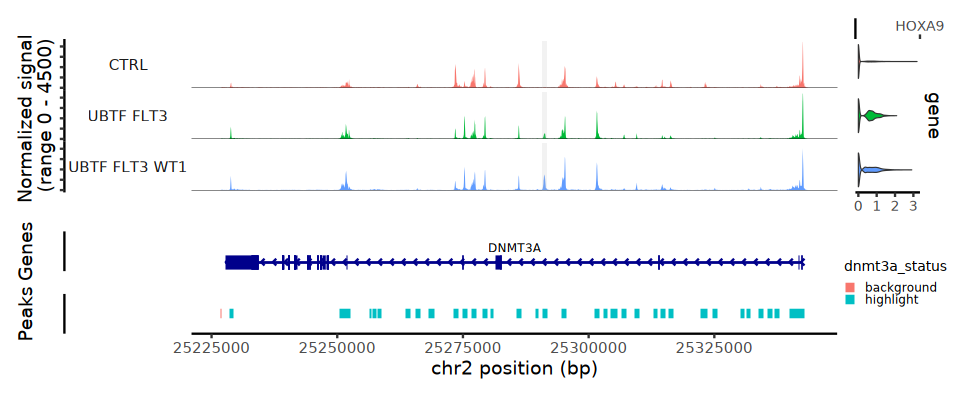

In [ ]:
# Define gene and cell types
options(repr.plot.width = 8, repr.plot.height = 3.3)
gene <- "DNMT3A"
cell_types <- c("HSC", "MPP", "GMP")
filtered_var_name <- "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt"

# Add temporary column for splitting (optional, safe fallback)
atac_merged$tmp_patient_id <- factor(atac_merged$WT1_comut)

# Load DE peak objects
dep_comparison <- get(filtered_var_name)
dep_comparison_nonsig <- get(gsub("_filtered$", "", filtered_var_name))

# Identify significant peaks for DNMT3A
sig_hits <- lapply(names(dep_comparison), function(celltype) {
  df <- dep_comparison[[celltype]]
  df$cell_type <- celltype
  df %>% filter(gene_label == gene)
}) %>% bind_rows() %>%
  filter(cell_type %in% cell_types)

# Report
cat("Significant in:\n")
print(unique(sig_hits$cell_type))
cat("\nNot significant in:\n")
print(setdiff(cell_types, unique(sig_hits$cell_type)))
cat("\n--- Significant entries ---\n")
print(sig_hits)

# Define highlight region from first peak
regions_highlight <- NULL
if (nrow(sig_hits) > 0) {
  coords <- str_split(sig_hits$peak[1], "-", simplify = TRUE)
  chr <- coords[1]
  start <- as.numeric(coords[2])
  end <- as.numeric(coords[3])
 
  gene_coords <- LookupGeneCoords(atac_merged, gene)
  if (chr %in% as.character(seqnames(gene_coords))) {
    regions_highlight <- GRanges(seqnames = chr, ranges = IRanges(start, end))
    cat("📌 Highlighting:", sig_hits$peak[1], "\n")
  } else {
    warning("Chromosome mismatch.")
  }
} else {
  cat("No peak to highlight.\n")
}

# --- Annotate Peaks for Color ---
all_peaks <- StringToGRanges(rownames(atac_merged), sep = c("-", "-"))
gene_coords <- LookupGeneCoords(atac_merged, gene)

# Label peaks that overlap the DNMT3A gene region
atac_merged[["peaks"]]@meta.features$dnmt3a_status <- ifelse(
  countOverlaps(all_peaks, gene_coords) > 0,
  "highlight", "background"
)

# --- Plot with custom peak coloring ---
p <- CoveragePlot(
  object = atac_merged,
  region = gene,
  region.highlight = regions_highlight,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  group.by = "WT1_comut",
  features = "HOXA9",
  peaks.group.by = "dnmt3a_status"
)

# Apply green color to DNMT3A-overlapping peaks
p + scale_fill_manual(values = c("highlight" = "#495F09", "background" = "grey60"))


In [ ]:
##mapping to DNMT3A coordinates from ChipseekR

In [26]:
atac_merged[["peaks"]]@meta.features$dnmt3a_status <- NULL


In [34]:
dnmt3a_df <- data.frame(
  annotation = c("Promoter (<=1kb)", "Intron", "Intron"),
  seqnames = paste0("chr", c(2, 2, 2)),
  start = c(25232976, 25273307, 25273307),
  end   = c(25252311, 25275520, 25275520)
)

library(GenomicRanges)

# Clean region type label for coloring
dnmt3a_df$region_type <- ifelse(dnmt3a_df$annotation == "Promoter (<=1kb)", "Promoter", "Intron")

dnmt3a_peaks_gr <- GRanges(
  seqnames = dnmt3a_df$seqnames,
  ranges = IRanges(start = dnmt3a_df$start, end = dnmt3a_df$end),
  region_type = dnmt3a_df$region_type
)

# Reset peak metadata
atac_merged[["peaks"]]@meta.features$dnmt3a_status <- "background"

# Match actual peaks
all_peaks <- StringToGRanges(rownames(atac_merged), sep = c("-", "-"))

# Assign correct labels
for (type in unique(dnmt3a_df$region_type)) {
  sub_gr <- dnmt3a_peaks_gr[dnmt3a_peaks_gr$region_type == type]
  overlapping <- which(countOverlaps(all_peaks, sub_gr) > 0)
  atac_merged[["peaks"]]@meta.features$dnmt3a_status[overlapping] <- type
}


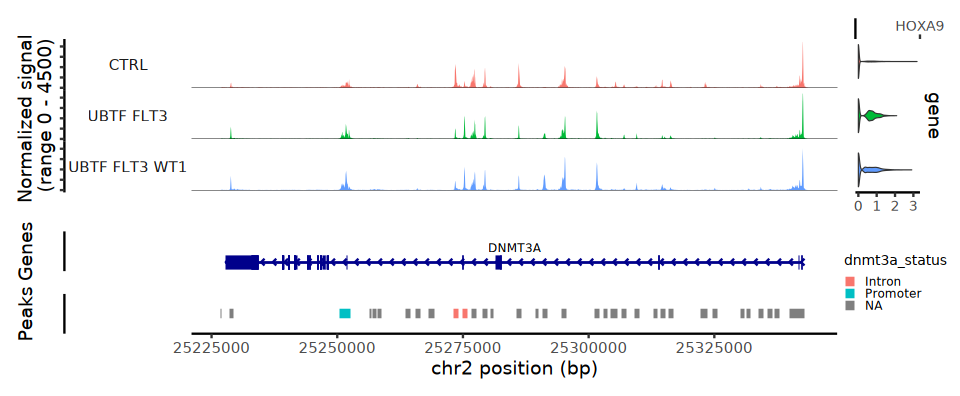

In [ ]:
p <- CoveragePlot(
  object = atac_merged,
  region = "DNMT3A",
  region.highlight = NULL,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  #region.highlight = regions_highlight,
  group.by = "WT1_comut",
  features = "HOXA9",
  peaks.group.by = "dnmt3a_status"
)

p + scale_fill_manual(
  values = c(
    "Promoter" = "#495F09",
    "Intron" = "#DC8E90",
    "background" = "grey60"
  ),
  name = "UBTF FLT3 WT1 DEP Annotation"  # legend title override
)


In [40]:
# Initialize everything as NA
atac_merged[["peaks"]]@meta.features$dnmt3a_status <- NA

# Match actual peaks
all_peaks <- StringToGRanges(rownames(atac_merged), sep = c("-", "-"))

# Assign labels only to overlapping peaks
for (type in unique(dnmt3a_df$region_type)) {
  sub_gr <- dnmt3a_peaks_gr[dnmt3a_peaks_gr$region_type == type]
  overlapping <- which(countOverlaps(all_peaks, sub_gr) > 0)
  atac_merged[["peaks"]]@meta.features$dnmt3a_status[overlapping] <- type
}


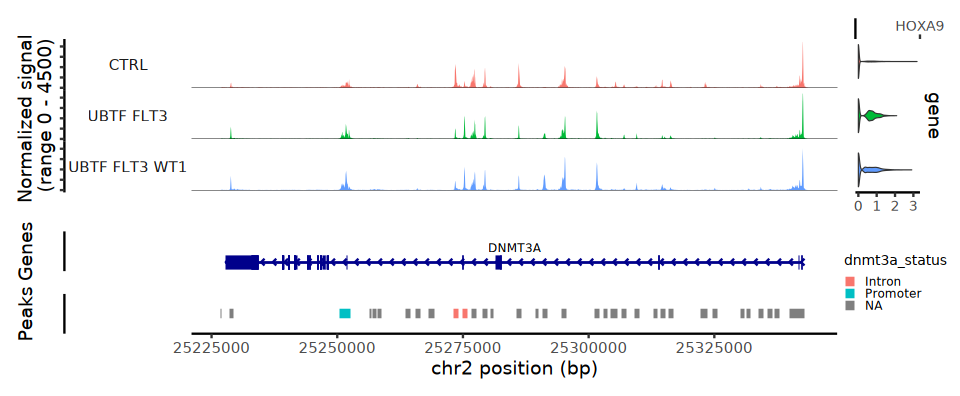

In [ ]:
p <- CoveragePlot(
  object = atac_merged,
  region = "DNMT3A",
  region.highlight = NULL,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  group.by = "WT1_comut",
  features = "HOXA9",
  region.highlight = regions_highlight,
  peaks.group.by = "dnmt3a_status"
)

p + scale_fill_manual(
  values = c(
    "Promoter" = "#495F09",
    "Intron" = "#DC8E90"
  ),
  name = "UBTF FLT3 WT1 DEP Annotation",
  na.translate = FALSE  # 
)


In [ ]:
## adding MPP and GMP

In [42]:
atac_merged$dnmt3a_plot <- ifelse(
  atac_merged$predicted.id %in% c("MPP", "GMP"),
  paste(atac_merged$WT1_comut, atac_merged$predicted.id),
  NA
)


In [43]:
table(atac_merged@meta.data$dnmt3a_plot)


         CTRL GMP          CTRL MPP     UBTF FLT3 GMP     UBTF FLT3 MPP 
              684              1405              2208              5350 
UBTF FLT3 WT1 GMP UBTF FLT3 WT1 MPP 
             1778              4592 

Warning message:
“Removing 67409 cells missing data for vars requested”


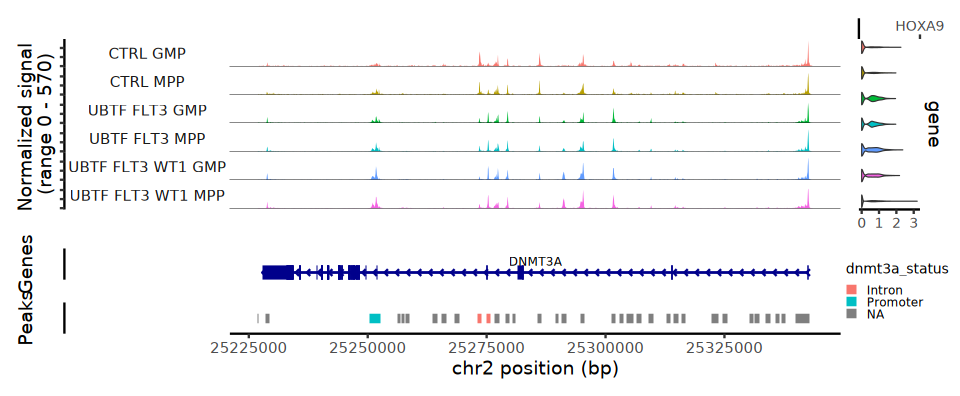

In [ ]:
valid_cells <- WhichCells(atac_merged, expression = !is.na(dnmt3a_plot))

p <- CoveragePlot(
  object = atac_merged,
  region = "DNMT3A",
  region.highlight = NULL,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 2, gene = 0, peaks = .1),
  group.by = "dnmt3a_plot",  
  features = "HOXA9",
  peaks.group.by = "dnmt3a_status",
  cells = valid_cells
)

p + scale_fill_manual(
  values = c(
    "Promoter" = "#495F09",
    "Intron" = "#DC8E90"
  ),
  name = "UBTF FLT3 WT1 DEP Annotation",
  na.translate = FALSE
)


In [ ]:
## changing the order

Warning message:
“Removing 67409 cells missing data for vars requested”


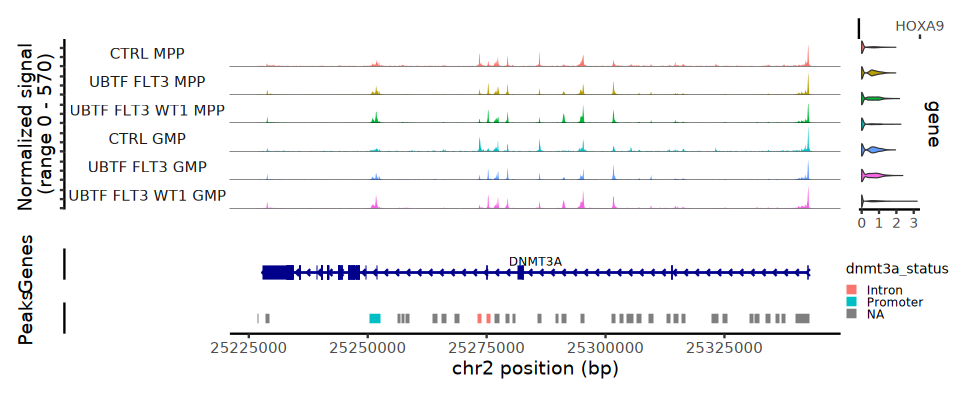

In [50]:
# Set levels explicitly and reassign to meta.data
atac_merged$dnmt3a_plot <- factor(
  atac_merged$dnmt3a_plot,
  levels = c(
    "CTRL MPP", "UBTF FLT3 MPP", "UBTF FLT3 WT1 MPP",
    "CTRL GMP", "UBTF FLT3 GMP", "UBTF FLT3 WT1 GMP"
  )
)


valid_cells <- WhichCells(atac_merged, expression = !is.na(dnmt3a_plot))

p <- CoveragePlot(
  object = atac_merged,
  region = "DNMT3A",
  region.highlight = NULL,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 2, gene = 0, peaks = .1),
  group.by = "dnmt3a_plot",
  features = "HOXA9",
  peaks.group.by = "dnmt3a_status",
  cells = valid_cells
)

p + scale_fill_manual(
  values = c("Promoter" = "#495F09", "Intron" = "#DC8E90"),
  name = "UBTF FLT3 WT1 DEP Annotation",
  na.translate = FALSE
)

Warning message:
“Removing 67409 cells missing data for vars requested”


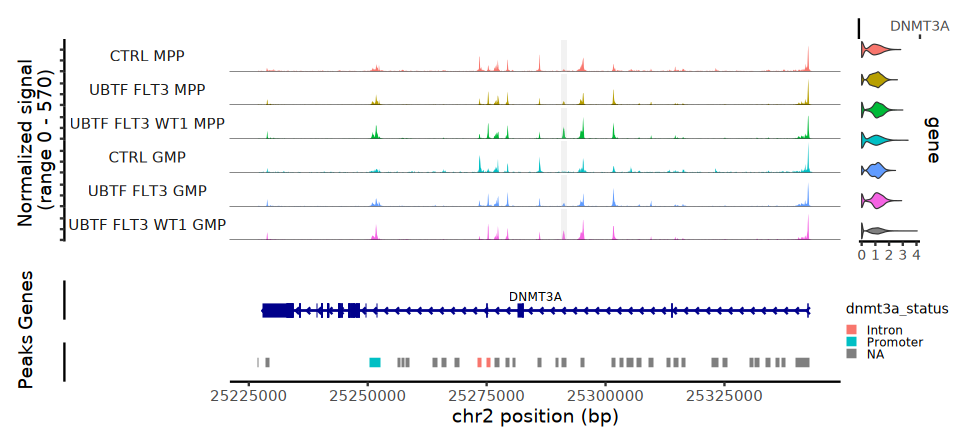

In [ ]:
## add region highlight
library(GenomicRanges)

options(repr.plot.width = 8, repr.plot.height = 3.7)

# Manually set the highlight region
highlight_region <- GRanges(
  seqnames = "chr2",
  ranges = IRanges(start = 25290770, end = 25291719)
)

# Set factor levels in desired order
atac_merged$dnmt3a_plot <- factor(
  atac_merged$dnmt3a_plot,
  levels = c(
    "CTRL MPP", "UBTF FLT3 MPP", "UBTF FLT3 WT1 MPP",
    "CTRL GMP", "UBTF FLT3 GMP", "UBTF FLT3 WT1 GMP"
  )
)

# Subset to valid cells
valid_cells <- WhichCells(atac_merged, expression = !is.na(dnmt3a_plot))

# Plot
p <- CoveragePlot(
  object = atac_merged,
  region = "DNMT3A",
  region.highlight = highlight_region,  
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 2, gene = 0, peaks = .1),
  group.by = "dnmt3a_plot",
  features = "DNMT3A",
  peaks.group.by = "dnmt3a_status",
  cells = valid_cells
)

# Custom fill colors for peak annotation
p + scale_fill_manual(
  values = c("Promoter" = "#495F09", "Intron" = "#DC8E90"),
  name = "UBTF FLT3 WT1 DEP Annotation",
  na.translate = FALSE
)


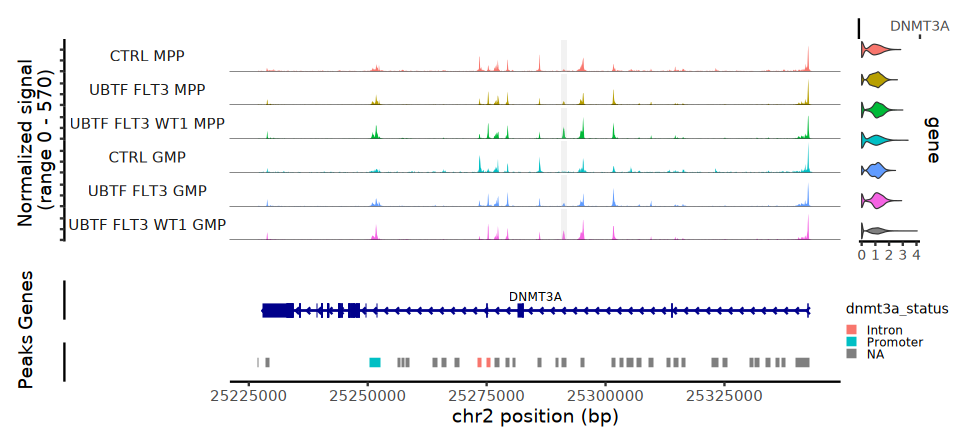

In [ ]:
# Define group colors manually
group_colors <- c(
  "CTRL MPP"          = "#F8766D",
  "UBTF FLT3 MPP"     = "#B79F00",
  "UBTF FLT3 WT1 MPP" = "#00BA38",
  "CTRL GMP"          = "#00BFC4",
  "UBTF FLT3 GMP"     = "#619CFF",
  "UBTF FLT3 WT1 GMP" = "#F564E3"
)

# Define peak annotation colors
peak_colors <- c(
  "Promoter" = "#495F09",
  "Intron"   = "#DC8E90"
)

# Plot with explicit color map
CoveragePlot(
  object = atac_merged,
  region = "DNMT3A",
  region.highlight = highlight_region,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 2, gene = 0, peaks = .1),
  group.by = "dnmt3a_plot",
  features = "DNMT3A",
  peaks.group.by = "dnmt3a_status",
  cells = valid_cells,
  cols = group_colors  
) +
  scale_fill_manual(
    values = peak_colors,
    name = "UBTF FLT3 WT1 DEP Annotation",
    na.translate = FALSE
  )


Warning message:
“Removing 67409 cells missing data for vars requested”


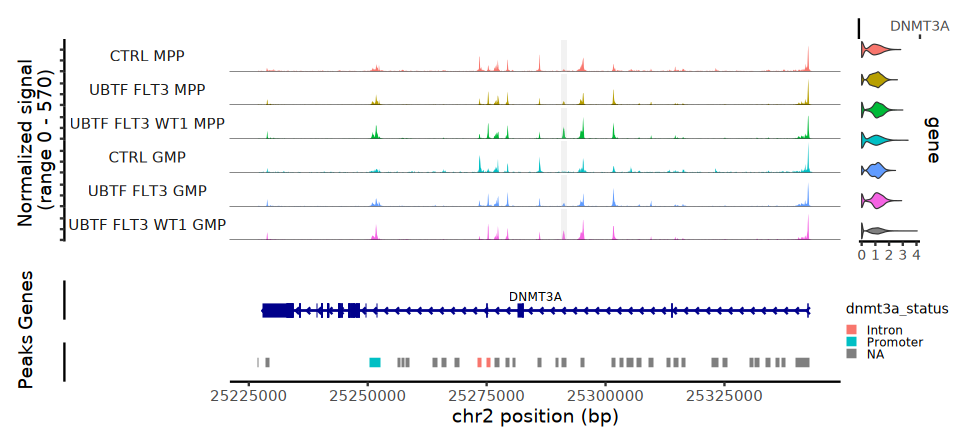

In [ ]:
# 1. Define group colors (for track groups)
group_colors <- c(
  "CTRL MPP"          = "#F8766D",
  "UBTF FLT3 MPP"     = "#B79F00",
  "UBTF FLT3 WT1 MPP" = "#00BA38",
  "CTRL GMP"          = "#00BFC4",
  "UBTF FLT3 GMP"     = "#619CFF",
  "UBTF FLT3 WT1 GMP" = "#F564E3"
)

# 2. Define peak annotation colors (for the fill of Peaks panel)
peak_colors <- c(
  "Promoter" = "#495F09",
  "Intron"   = "#DC8E90"
)

# 3. Highlight region
highlight_region <- GRanges(
  seqnames = "chr2",
  ranges = IRanges(start = 25290770, end = 25291719)
)

# 4. Set factor levels
atac_merged$dnmt3a_plot <- factor(
  atac_merged$dnmt3a_plot,
  levels = names(group_colors)
)

# 5. Subset cells with defined groups
valid_cells <- WhichCells(atac_merged, expression = !is.na(dnmt3a_plot))

# 6. Generate CoveragePlot
options(repr.plot.width = 8, repr.plot.height = 3.7)
CoveragePlot(
  object = atac_merged,
  region = "DNMT3A",
  region.highlight = highlight_region,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 2, gene = 0, peaks = .1),
  group.by = "dnmt3a_plot",
  features = "DNMT3A",
  peaks.group.by = "dnmt3a_status",
  cells = valid_cells,
  cols = group_colors  
) +
  scale_fill_manual(
    values = peak_colors,
    name = "UBTF FLT3 WT1 DEP Annotation",
    na.translate = FALSE
  )


In [115]:
options(ggplot2.discrete.fill = NULL)
options(ggplot2.discrete.colour = NULL)


In [109]:
levels(atac_merged$dnmt3a_plot)
names(group_colors)


[1] "CTRL MPP"          "UBTF FLT3 MPP"     "UBTF FLT3 WT1 MPP"
[4] "CTRL GMP"          "UBTF FLT3 GMP"     "UBTF FLT3 WT1 GMP"

[1] "CTRL MPP"          "UBTF FLT3 MPP"     "UBTF FLT3 WT1 MPP"
[4] "CTRL GMP"          "UBTF FLT3 GMP"     "UBTF FLT3 WT1 GMP"

In [ ]:
## add rna_seq info

In [62]:
head(rna_seq@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,HTO_maxID,HTO_secondID,HTO_margin,HTO_classification,HTO_classification.global,⋯,seurat_clusters,predicted_Broad_cell_identity,predicted_Cell_type_identity,WT1_NPM1,NPM1,UBTF,FLT3,WT1,barcode,disease.state
,<chr>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,⋯,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCCACAGTCGTTA-1_1,CTRL2095_AML1892_AML1893_AML2099,6575,2802,529,4,Healthy-2095,AML-1893,1.1169923,Healthy-2095,Singlet,⋯,6,Granulocyte,Granulocytes (cycling),MUT,MUT,WT,MUT,MUT,AAACCCACAGTCGTTA-1_1,AML
AAACCCAGTAGCCAGA-1_1,CTRL2095_AML1892_AML1893_AML2099,2575,1584,392,4,Healthy-2095,AML-1892,1.0424790,Healthy-2095,Singlet,⋯,13,CD8+ T,CD8+ Cytotoxic,MUT,MUT,WT,MUT,MUT,AAACCCAGTAGCCAGA-1_1,AML
AAACGAAAGAATTTGG-1_1,CTRL2095_AML1892_AML1893_AML2099,4433,1967,387,4,Healthy-2095,AML-1892,1.1128806,Healthy-2095,Singlet,⋯,0,CD14+ monocyte,CD14+,MUT,MUT,WT,MUT,MUT,AAACGAAAGAATTTGG-1_1,AML
AAACGAAAGCTGACCC-1_1,CTRL2095_AML1892_AML1893_AML2099,3286,1654,568,4,Healthy-2095,AML-1892,0.8898075,Healthy-2095,Singlet,⋯,0,CD14+ monocyte,CD14+,MUT,MUT,WT,MUT,MUT,AAACGAAAGCTGACCC-1_1,AML
AAACGAAGTGAATGTA-1_1,CTRL2095_AML1892_AML1893_AML2099,1690,1016,405,4,Healthy-2095,AML-1892,0.4613286,Healthy-2095,Singlet,⋯,12,NK,CD8+ Cytotoxic,MUT,MUT,WT,MUT,MUT,AAACGAAGTGAATGTA-1_1,AML
AAACGAAGTTGTAGCT-1_1,CTRL2095_AML1892_AML1893_AML2099,1407,888,372,4,Healthy-2095,AML-1893,0.5306171,Healthy-2095,Singlet,⋯,12,CD8+ T,CD8+ Cytotoxic,MUT,MUT,WT,MUT,MUT,AAACGAAGTTGTAGCT-1_1,AML


In [ ]:
# Create WT1_comut column
rna_seq$WT1_comut <- case_when(
  rna_seq$WT1 == "MUT" & rna_seq$UBTF == "MUT" ~ "UBTF FLT3 WT1",
  rna_seq$WT1 == "WT"  & rna_seq$UBTF == "MUT" ~ "UBTF FLT3",
  rna_seq$disease.state == "CTRL"             ~ "CTRL",
  TRUE ~ NA_character_
)

# Create dnmt3a_plot combining WT1_comut and cell identity (only for MPP or GMP)
rna_seq$dnmt3a_plot <- ifelse(
  rna_seq$predicted_Broad_cell_identity %in% c("MPP", "GMP"),
  paste(rna_seq$WT1_comut, rna_seq$predicted_Broad_cell_identity),
  NA_character_
)

rna_seq$dnmt3a_plot <- factor(
  rna_seq$dnmt3a_plot,
  levels = c(
    "CTRL MPP", "UBTF FLT3 MPP", "UBTF FLT3 WT1 MPP",
    "CTRL GMP", "UBTF FLT3 GMP", "UBTF FLT3 WT1 GMP"
  )
)

# 4. Set Idents
Idents(rna_seq) <- rna_seq$dnmt3a_plot

Warning message:
“Removing 124383 cells missing data for vars requested”
Warning message:
“Could not find DNMT3A in the default search locations, found in ‘RNA’ assay instead”


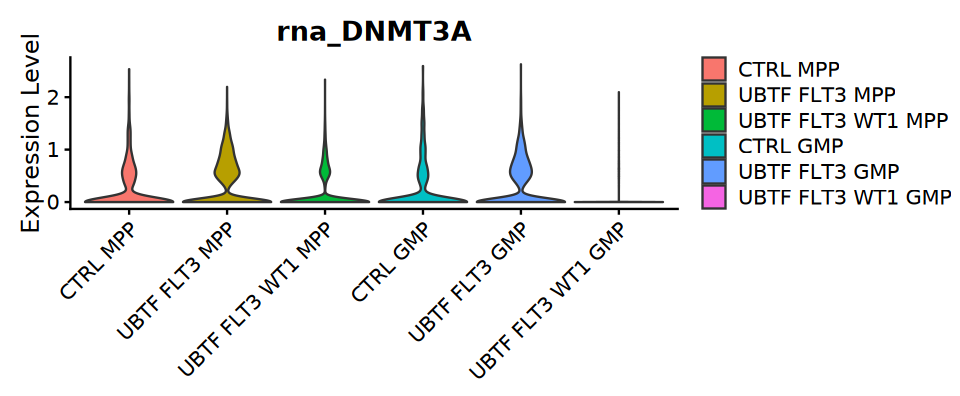

In [66]:
# Subset Seurat object to non-NA dnmt3a_plot values
rna_subset <- subset(rna_seq, subset = !is.na(dnmt3a_plot))

# Now plot
VlnPlot(
  object = rna_subset,
  features = "DNMT3A",
  pt.size = 0,
  group.by = "dnmt3a_plot"
) +
  theme(
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1),
    plot.title = element_text(face = "bold")
  )


Warning message:
“Could not find DNMT3A in the default search locations, found in ‘RNA’ assay instead”


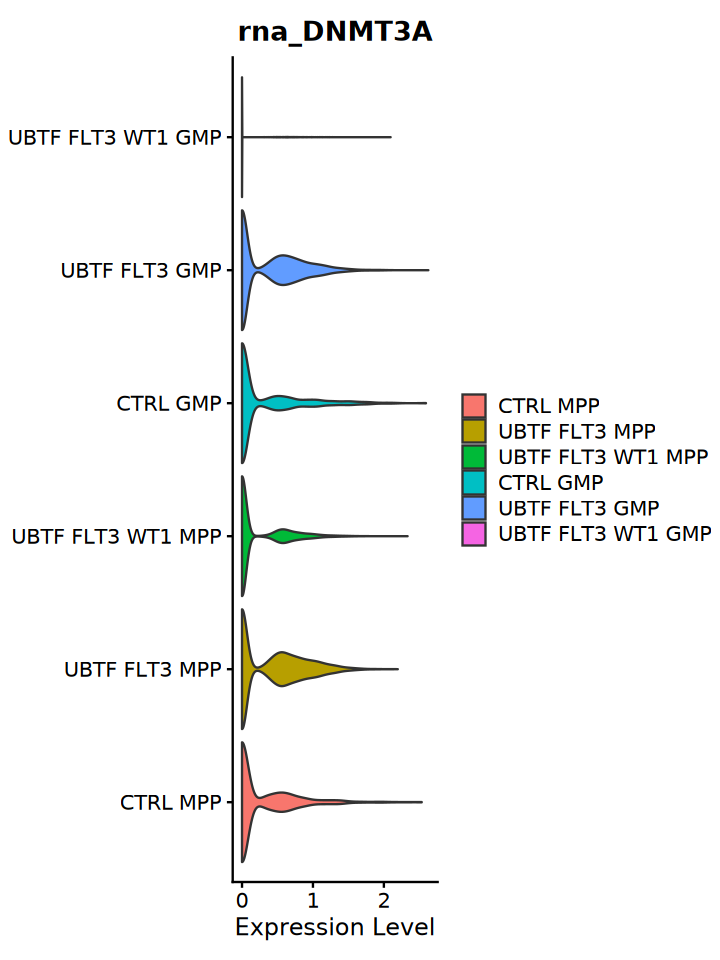

In [84]:
# Reverse levels to match top-to-bottom with the legend
rna_subset$dnmt3a_plot <- factor(
  rna_subset$dnmt3a_plot,
  levels = rev(levels(rna_subset$dnmt3a_plot))
)

# Plot
options(repr.plot.width = 6, repr.plot.height = 8)
VlnPlot(
  object = rna_subset,
  features = "DNMT3A",
  pt.size = 0,
  group.by = "dnmt3a_plot"
) +
  coord_flip() +
  theme(
    axis.title.y = element_blank(),
    axis.text.y = element_text(hjust = 1, angle = 0),
    axis.text.x = element_text(hjust = 0.5, angle = 0),
    plot.title = element_text(face = "bold")
  )


In [85]:
scales::hue_pal()(6)


[1] "#F8766D" "#B79F00" "#00BA38" "#00BFC4" "#619CFF" "#F564E3"

Warning message:
“Could not find DNMT3A in the default search locations, found in ‘RNA’ assay instead”


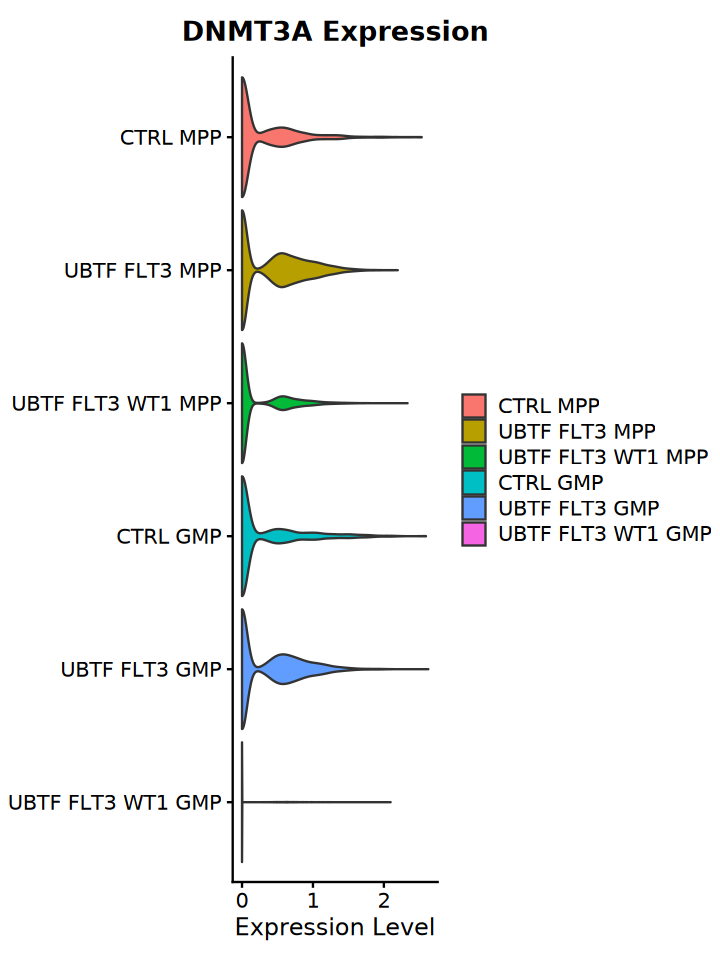

In [93]:
# Reverse factor levels to show CTRL MPP at top
rna_subset$dnmt3a_plot <- factor(
  rna_subset$dnmt3a_plot,
  levels = rev(c(
    "CTRL MPP", "UBTF FLT3 MPP", "UBTF FLT3 WT1 MPP",
    "CTRL GMP", "UBTF FLT3 GMP", "UBTF FLT3 WT1 GMP"
  ))
)

# Custom color mapping (top-to-bottom order)
reversed_colors <- c(
  "CTRL MPP"          = "#F8766D",
  "UBTF FLT3 MPP"     = "#B79F00",
  "UBTF FLT3 WT1 MPP" = "#00BA38",
  "CTRL GMP"          = "#00BFC4",
  "UBTF FLT3 GMP"     = "#619CFF",
  "UBTF FLT3 WT1 GMP" = "#F564E3"
)

# Plot
options(repr.plot.width = 6, repr.plot.height = 8)
VlnPlot(
  object = rna_subset,
  features = "DNMT3A",
  pt.size = 0,
  group.by = "dnmt3a_plot"
) +
  coord_flip() +
  ggtitle("DNMT3A Expression") +
  theme(
    axis.title.y = element_blank(),
    axis.text.y = element_text(hjust = 1, angle = 0),
    axis.text.x = element_text(hjust = 0.5, angle = 0),
    plot.title = element_text(face = "bold")
  ) +
  scale_fill_manual(values = reversed_colors) +
  guides(fill = guide_legend(reverse = TRUE))


In [ ]:
#atac

Warning message:
“Removing 67409 cells missing data for vars requested”
Warning message:
“Could not find DNMT3A in the default search locations, found in ‘RNA’ assay instead”


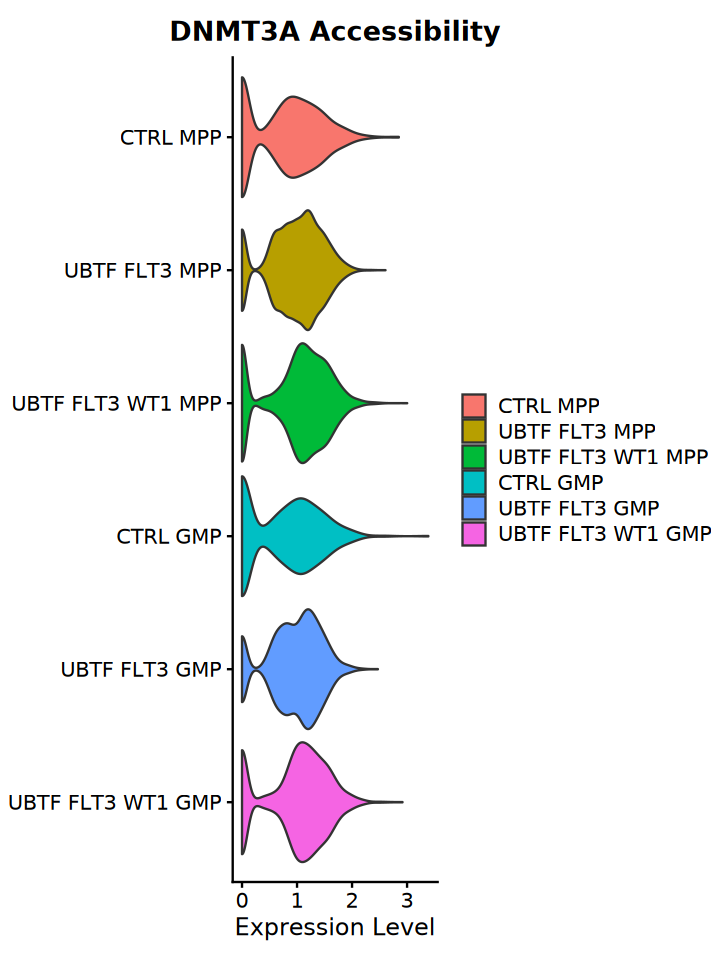

In [92]:
# Ensure DNMT3A peak accessibility is the default assay
DefaultAssay(atac_merged) <- "peaks"

# Reverse levels to match desired y-axis top-to-bottom
atac_merged$dnmt3a_plot <- factor(
  atac_merged$dnmt3a_plot,
  levels = rev(c(
    "CTRL MPP", "UBTF FLT3 MPP", "UBTF FLT3 WT1 MPP",
    "CTRL GMP", "UBTF FLT3 GMP", "UBTF FLT3 WT1 GMP"
  ))
)

# Define the same custom color palette used for RNA plot
reversed_colors <- c(
  "CTRL MPP"          = "#F8766D",
  "UBTF FLT3 MPP"     = "#B79F00",
  "UBTF FLT3 WT1 MPP" = "#00BA38",
  "CTRL GMP"          = "#00BFC4",
  "UBTF FLT3 GMP"     = "#619CFF",
  "UBTF FLT3 WT1 GMP" = "#F564E3"
)

# Subset to valid cells
valid_cells <- WhichCells(atac_merged, expression = !is.na(dnmt3a_plot))
atac_subset <- subset(atac_merged, cells = valid_cells)

# Plot violin of DNMT3A accessibility
options(repr.plot.width = 6, repr.plot.height = 8)
VlnPlot(
  object = atac_subset,
  features = "DNMT3A",
  pt.size = 0,
  group.by = "dnmt3a_plot"
) +
  coord_flip() +
  ggtitle("DNMT3A Accessibility") +
  theme(
    axis.title.y = element_blank(),
    axis.text.y = element_text(hjust = 1, angle = 0),
    axis.text.x = element_text(hjust = 0.5, angle = 0),
    plot.title = element_text(face = "bold")
  ) +
  scale_fill_manual(values = reversed_colors) +
  guides(fill = guide_legend(reverse = TRUE))


Warning message:
“Could not find DNMT3A in the default search locations, found in ‘RNA’ assay instead”


Warning message:
“Could not find DNMT3A in the default search locations, found in ‘RNA’ assay instead”


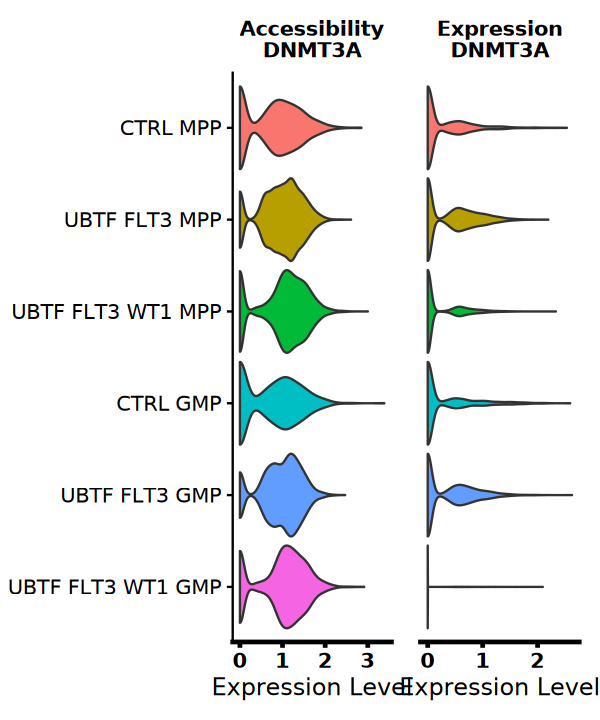

In [ ]:
# --- ATAC plot ---
p_atac <- VlnPlot(
  object = atac_subset,
  features = "DNMT3A",
  pt.size = 0,
  group.by = "dnmt3a_plot"
) +
  coord_flip() +
  ggtitle("Accessibility\nDNMT3A") +
  scale_fill_manual(values = reversed_colors) +
  theme(
    axis.title.y = element_blank(),
    axis.text.y = element_text(hjust = 1, angle = 0),
    axis.text.x = element_text(hjust = 0.5, angle = 0, face = "bold"),
    axis.line.x = element_line(size = 1),
    axis.ticks.x = element_line(size = 1),
    plot.title = element_text(face = "bold", hjust = 0.5, size = 12),  # reduced title size
    legend.position = "none"
  )

# --- RNA plot ---
p_rna <- VlnPlot(
  object = rna_subset,
  features = "DNMT3A",
  pt.size = 0,
  group.by = "dnmt3a_plot"
) +
  coord_flip() +
  ggtitle("Expression\nDNMT3A") +
  scale_fill_manual(values = reversed_colors) +
  theme(
    axis.title.y = element_blank(),
    axis.text.y = element_blank(),
    axis.ticks.y = element_blank(),
    axis.line.y = element_blank(),
    axis.text.x = element_text(hjust = 0.5, angle = 0, face = "bold"),
    axis.line.x = element_line(size = 1),
    axis.ticks.x = element_line(size = 1),
    plot.title = element_text(face = "bold", hjust = 0.5, size = 12),  # reduced title size
    legend.position = "none"
  )
(p_atac + p_rna) + patchwork::plot_layout(ncol = 2)

## rna and atac dysregulation DEGs

In [ ]:
## UBTF-FLT3 vs CTRL MPPs

In [ ]:
# Split by cell type
#atac_split <- split(DEP_UBTF_FLT3_CTRL_filtered, DEP_UBTF_FLT3_CTRL_filtered$cell_type)
atac_split <- DEP_UBTF_FLT3_CTRL_filtered
rna_split <- split(DEG_UBTF_FLT3_wt1wt_CTRL_filtered, DEG_UBTF_FLT3_wt1wt_CTRL_filtered$cell_type)

# Merge and rename columns for each cell type
merged_list <- lapply(names(atac_split), function(celltype) {
  atac_df <- atac_split[[celltype]]
  rna_df  <- rna_split[[celltype]]

  cat(sprintf("\n🔍 Cell type: %s\n", celltype))
  cat("  ATAC columns: ", paste(colnames(atac_df), collapse = ", "), "\n")
  cat("  RNA columns:  ", paste(colnames(rna_df), collapse = ", "), "\n")

  if (!"avg_log2FC" %in% colnames(atac_df) || !"avg_log2FC" %in% colnames(rna_df)) {
    warning(sprintf("Missing 'avg_log2FC' in one of the datasets for: %s", celltype))
    return(NULL)
  }

  atac_df <- dplyr::rename(atac_df, avg_log2FC_atac = avg_log2FC)
  rna_df  <- dplyr::rename(rna_df, avg_log2FC_rna = avg_log2FC)

  merged <- inner_join(atac_df, rna_df, by = c("gene_label" = "gene"))
  return(merged)
})

# Name each list element
names(merged_list) <- names(atac_split)


🔍 Cell type: B
  ATAC columns:  p_val, avg_log2FC, pct.1, pct.2, p_val_adj, peak, gene_label, cell_type 
  RNA columns:   p_val, avg_log2FC, pct.1, pct.2, p_val_adj, gene, cell_type, comparison.1, comparison.2 

🔍 Cell type: CD14+ monocyte
  ATAC columns:  p_val, avg_log2FC, pct.1, pct.2, p_val_adj, peak, gene_label, cell_type 
  RNA columns:   p_val, avg_log2FC, pct.1, pct.2, p_val_adj, gene, cell_type, comparison.1, comparison.2 

🔍 Cell type: CD16+ monocyte
  ATAC columns:  p_val, avg_log2FC, pct.1, pct.2, p_val_adj, peak, gene_label, cell_type 
  RNA columns:   p_val, avg_log2FC, pct.1, pct.2, p_val_adj, gene, cell_type, comparison.1, comparison.2 

🔍 Cell type: CD4+ T
  ATAC columns:  p_val, avg_log2FC, pct.1, pct.2, p_val_adj, peak, gene_label, cell_type 
  RNA columns:   p_val, avg_log2FC, pct.1, pct.2, p_val_adj, gene, cell_type, comparison.1, comparison.2 

🔍 Cell type: CD8+ T
  ATAC columns:  p_val, avg_log2FC, pct.1, pct.2, p_val_adj, peak, gene_label, cell_type 
  RNA colu

Warning message in inner_join(., label_position_df, by = c("pathway", "quadrant")):
"Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 10 of `x` matches multiple rows in `y`.
ℹ Row 2 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning."


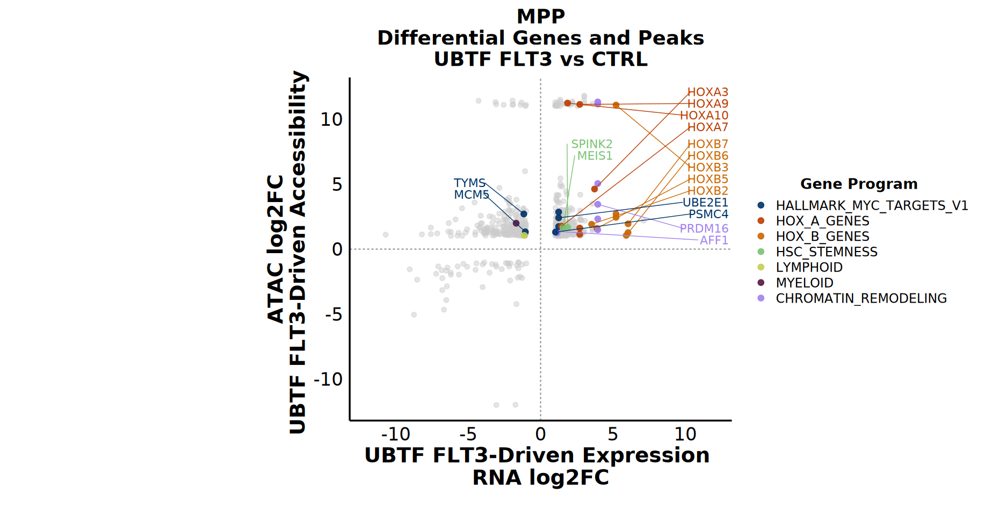

In [ ]:
options(repr.plot.width = 15.5, repr.plot.height = 8)

# === Define pathways and colors ===
ordered_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2",
  "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES",
  "HSC_STEMNESS", "LYMPHOID", "MYELOID", "CHROMATIN_REMODELING"
)

pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS"            = "#7AC273",
  "LYMPHOID"                = "#C2CE51",
  "MYELOID"                 = "#581845",
  "CHROMATIN_REMODELING"   = "#A280F0"
)

# === Define quadrant per gene ===
assign_quadrant <- function(rna, atac) {
  case_when(
    rna >= 0 & atac >= 0 ~ "Q1",
    rna < 0  & atac >= 0 ~ "Q2",
    rna < 0  & atac <  0 ~ "Q3",
    rna >= 0 & atac <  0 ~ "Q4"
  )
}

# === Gene-to-pathway mapping ===
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway$pathway <- as.character(gene_to_pathway$pathway)
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# === Merge RNA + ATAC ===
merged_list <- lapply(names(atac_split), function(celltype) {
  atac_df <- atac_split[[celltype]]
  rna_df  <- rna_split[[celltype]]
  
  if (!"avg_log2FC" %in% colnames(atac_df) || !"avg_log2FC" %in% colnames(rna_df)) return(NULL)
  
  atac_df <- rename(atac_df, avg_log2FC_atac = avg_log2FC)
  rna_df  <- rename(rna_df, avg_log2FC_rna = avg_log2FC)
  
  inner_join(atac_df, rna_df, by = c("gene_label" = "gene")) %>%
    left_join(gene_to_pathway, by = "gene_label") %>%
    mutate(
      pathway = ifelse(is.na(pathway), "None", pathway),
      color = ifelse(pathway == "None", "grey70", pathway_colors[pathway])
    )
})
names(merged_list) <- names(atac_split)

# === Focus on MPP ===
plot_df <- merged_list[["MPP"]] %>%
  filter(!is.na(avg_log2FC_rna) & !is.na(avg_log2FC_atac)) %>%
  filter(pathway %in% ordered_pathways) %>%
  mutate(quadrant = assign_quadrant(avg_log2FC_rna, avg_log2FC_atac))

sig_pathway_genes <- plot_df

# === Define label positions per (pathway, quadrant) ===
label_position_df <- tibble::tribble(
  ~pathway, ~quadrant, ~label_x, ~y_start, ~y_spacing,
  "HALLMARK_MYC_TARGETS_V1", "Q1",  13,  4.5, -0.9,
  "HALLMARK_MYC_TARGETS_V1", "Q2", -6,  6, -0.9,
  "HOX_A_GENES",             "Q1", 13, 13, -0.9,
  "HOX_B_GENES",             "Q1", 13,  9, -0.9,
  "HSC_STEMNESS",    "Q1",  5,  9, -0.9,
  "MHC_CLASS_I_II_GENES",    "Q1",  3,  9, -0.9,
  "CHROMATIN_REMODELING",   "Q1",  13,  2.5, -0.9,
  "CHROMATIN_REMODELING",   "Q2", -8,  6, -0.9,
  "CHROMATIN_REMODELING",   "Q3", -8, -2, -0.9,
  "HSC_STEMNESS",            "Q1",  5,  6, -0.9
  # add more combinations as needed
)

# === Label all CHROMATIN_REMODELING genes ===
chromatin_remodeling_genes <- sig_pathway_genes %>%
  filter(pathway == "CHROMATIN_REMODELING")

# === Merge label positions for CHROMATIN_REMODELING (all quadrants) ===
sig_pathway_labeled <- sig_pathway_genes %>%
  filter(pathway != "CHROMATIN_REMODELING") %>%
  bind_rows(chromatin_remodeling_genes) %>%
  inner_join(label_position_df, by = c("pathway", "quadrant")) %>%
  distinct(pathway, quadrant, gene_label, .keep_all = TRUE) %>%
  group_by(pathway, quadrant) %>%
  arrange(desc(abs(avg_log2FC_rna))) %>%
mutate(
  label_y       = y_start + row_number() * y_spacing,
  label_side    = ifelse(avg_log2FC_rna < 0, "right", "left"),
  hjust_val     = ifelse(label_side == "right", 0, 1),
  label_x_fixed = label_x,
  label_width   = 0.53 * nchar(gene_label),
  segment_xend  = case_when(
    label_side == "left"  ~ label_x_fixed - label_width,  # connect to right edge of label on left
    label_side == "right" ~ label_x_fixed + label_width   # connect to left edge of label on right
  )
) %>%
  ungroup()


# === Plot ===
ggplot() +
  geom_point(data = merged_list[["MPP"]],
             aes(x = avg_log2FC_rna, y = avg_log2FC_atac),
             color = "grey80", alpha = 0.5, size = 2) +
  geom_point(data = sig_pathway_genes,
             aes(x = avg_log2FC_rna, y = avg_log2FC_atac, color = pathway),
             alpha = 0.9, size = 2.5) +
  geom_segment(data = sig_pathway_labeled,
               aes(x = avg_log2FC_rna, y = avg_log2FC_atac,
                   xend = segment_xend, yend = label_y, color = pathway),
               size = 0.3, show.legend = FALSE) +
  geom_text(data = sig_pathway_labeled,
            aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
            size = 4.5, show.legend = FALSE) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "gray60") +
  geom_vline(xintercept = 0, linetype = "dashed", color = "gray60") +
  coord_cartesian(xlim = c(-12, 12), ylim = c(-12, 12)) +
  scale_color_manual(
    values = pathway_colors,
    breaks = ordered_pathways,
    name = "Gene Program"
  ) +
  labs(
    x = "UBTF FLT3-Driven Expression \nRNA log2FC",
    y = "ATAC log2FC\nUBTF FLT3-Driven Accessibility ",
    title = "MPP\n Differential Genes and Peaks \nUBTF FLT3 vs CTRL"
  ) +
  theme_minimal(base_size = 16) +
  theme(
    panel.grid = element_blank(),
    axis.line = element_line(color = "black"),
    plot.title = element_text(hjust = 0.5, face = "bold", size = 22),
    legend.title = element_text(face = "bold", size = 16),
    legend.text = element_text(size = 14),
    legend.position = "right",
    axis.title.x = element_text(size = 23, face = "bold"),
    axis.title.y = element_text(size = 23, face = "bold"),
    axis.text.x  = element_text(size = 20, color = "black"),
    axis.text.y  = element_text(size = 20, color = "black"),
    plot.margin = margin(t = 10, r = 30, b = 30, l = 300)
  ) +
  guides(color = guide_legend(
    title.position = "top",
    title.hjust = 0.5,
    nrow = 8,
    byrow = TRUE
  ))

✅ Significantly differentially expressed in:
[1] "GMP" "HSC" "MPP"

❌ Not significantly differentially expressed in:
character(0)

--- Significant entries ---
# A tibble: 5 × 8
      p_val avg_log2FC pct.1 pct.2 p_val_adj peak           gene_label cell_type
      <dbl>      <dbl> <dbl> <dbl>     <dbl> <chr>          <chr>      <chr>    
1 0.0170        -0.229 0.281 0.285         1 chr22-3539956… MCM5       GMP      
2 0.0531         0.177 0.314 0.266         1 chr22-3540982… MCM5       GMP      
3 0.205         -0.718 0.186 0.281         1 chr22-3540982… MCM5       HSC      
4 0.605         -0.235 0.256 0.281         1 chr22-3539956… MCM5       HSC      
5 0.0000113     -0.294 0.269 0.28          1 chr22-3539956… MCM5       MPP      
📌 Highlighting first significant peak for MCM5 in GMP 


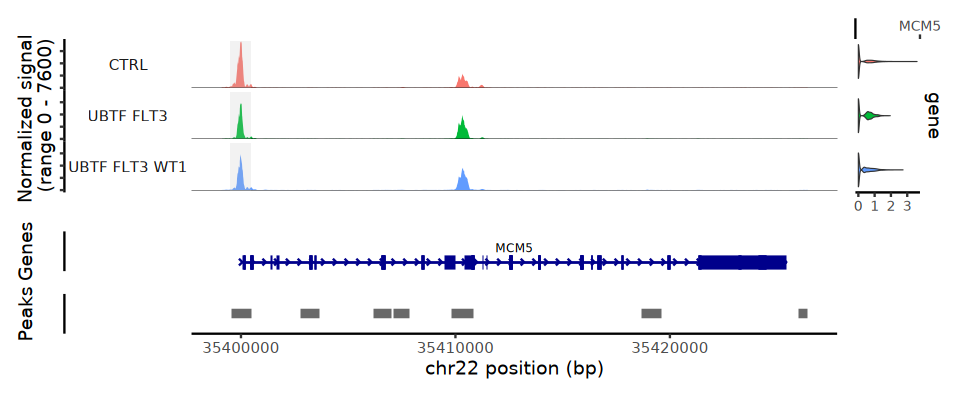

In [ ]:
# Define gene of interest and cell types
options(repr.plot.width = 8, repr.plot.height = 3.3)
gene <- "MCM5"
cell_types <- c("HSC", "MPP", "GMP")
filtered_var_name <- "DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt"

# Extract group levels and define color mapping
group_levels <- levels(factor(atac_merged$WT1_comut))
# Adjust color map to only include present groups
group_colors <- group_colors[names(group_colors) %in% levels(atac_merged$tmp_patient_id)]


# Add temporary column for splitting
atac_merged$tmp_patient_id <- factor(atac_merged$WT1_comut, levels = names(group_colors))

# Load differential peak objects
dep_comparison <- get(filtered_var_name)
dep_comparison_nonsig <- get(gsub("_filtered$", "", filtered_var_name))

# Identify significant peaks for the gene
sig_hits <- lapply(names(dep_comparison), function(celltype) {
  df <- dep_comparison[[celltype]]
  df$cell_type <- celltype
  df %>% filter(gene_label == gene)
}) %>% bind_rows() %>%
  filter(cell_type %in% cell_types)

# Report significance results
cat("Significantly differentially expressed in:\n")
print(unique(sig_hits$cell_type))

cat("\nNot significantly differentially expressed in:\n")
print(setdiff(cell_types, unique(sig_hits$cell_type)))

cat("\n--- Significant entries ---\n")
print(sig_hits)

# Define highlighted region from first significant peak (if available)
regions_highlight <- NULL
if (nrow(sig_hits) > 0) {
  coords <- str_split(sig_hits$peak[1], "-", simplify = TRUE)
  chr <- coords[1]
  start <- as.numeric(coords[2])
  end <- as.numeric(coords[3])
  
  gene_coords <- LookupGeneCoords(atac_merged, gene)
  if (chr %in% as.character(seqnames(gene_coords))) {
    regions_highlight <- GRanges(seqnames = chr, ranges = IRanges(start, end))
    cat("📌 Highlighting first significant peak for", gene, "in", sig_hits$cell_type[1], "\n")
  } else {
    warning("Chromosome mismatch between peak and gene coordinates.")
  }
} else {
  cat("No significant peak found — skipping highlight.\n")
}

# Plot coverage
CoveragePlot(
  object = atac_merged,
  region = gene,
  region.highlight = regions_highlight,
  extend.upstream = 1000,
  extend.downstream = 1000,
  heights = c(coverage = 1.5, gene = 0, peaks = .1),
  group.by = "WT1_comut",
  features = "MCM5",
  #scale.factor = 1e4 #need?
  #split.by = "tmp_patient_id",
  #cols = group_colors 
  # links = TRUE  # uncomment if Cicero links are added
)

# WT1 comutation

In [ ]:
# Split by cell type
#atac_split <- split(DEP_UBTF_FLT3_CTRL_filtered, DEP_UBTF_FLT3_CTRL_filtered$cell_type)
atac_split <- DEP_UBTF_FLT3_WT1mut_vs_UBTF_FLT3_WT1wt_filtered
rna_split <- split(DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered, DEG_UBTF_FLT3_wt1mut_vs_UBTF_FLT3_wt1wt_filtered$cell_type)

# Merge and rename columns for each cell type
merged_list <- lapply(names(atac_split), function(celltype) {
  atac_df <- atac_split[[celltype]]
  rna_df  <- rna_split[[celltype]]

  cat(sprintf("\n🔍 Cell type: %s\n", celltype))
  cat("  ATAC columns: ", paste(colnames(atac_df), collapse = ", "), "\n")
  cat("  RNA columns:  ", paste(colnames(rna_df), collapse = ", "), "\n")

  if (!"avg_log2FC" %in% colnames(atac_df) || !"avg_log2FC" %in% colnames(rna_df)) {
    warning(sprintf("Missing 'avg_log2FC' in one of the datasets for: %s", celltype))
    return(NULL)
  }

  atac_df <- dplyr::rename(atac_df, avg_log2FC_atac = avg_log2FC)
  rna_df  <- dplyr::rename(rna_df, avg_log2FC_rna = avg_log2FC)

  merged <- inner_join(atac_df, rna_df, by = c("gene_label" = "gene"))
  return(merged)
})

# Name each list element
names(merged_list) <- names(atac_split)

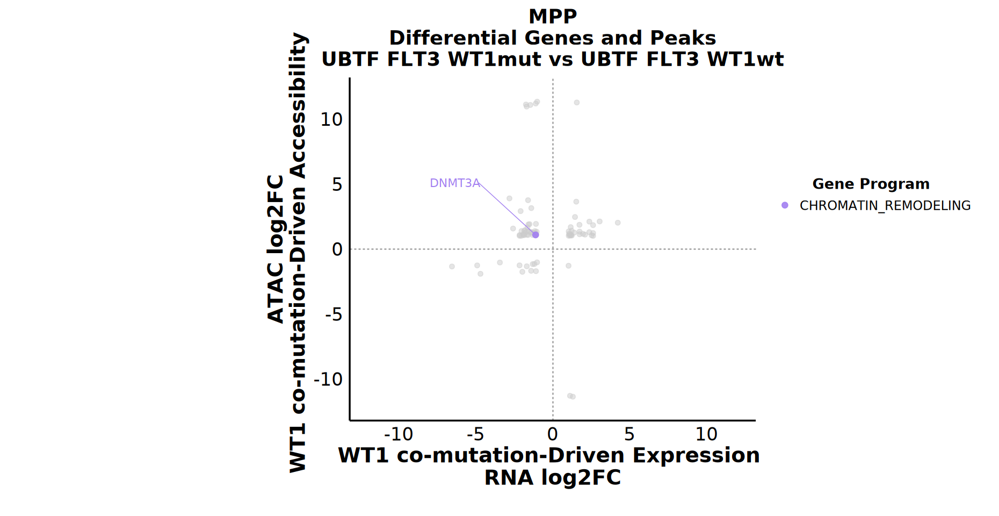

In [ ]:
options(repr.plot.width = 15.5, repr.plot.height = 8)

# === Define pathways and colors ===
ordered_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2",
  "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES",
  "HSC_STEMNESS", "LYMPHOID", "MYELOID", "CHROMATIN_REMODELING"
)

pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS"            = "#7AC273",
  "LYMPHOID"                = "#C2CE51",
  "MYELOID"                 = "#581845",
  "CHROMATIN_REMODELING"   = "#A280F0"
)

# === Define quadrant per gene ===
assign_quadrant <- function(rna, atac) {
  case_when(
    rna >= 0 & atac >= 0 ~ "Q1",
    rna < 0  & atac >= 0 ~ "Q2",
    rna < 0  & atac <  0 ~ "Q3",
    rna >= 0 & atac <  0 ~ "Q4"
  )
}

# === Gene-to-pathway mapping ===
gene_sets_subset <- gene_sets[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway$pathway <- as.character(gene_to_pathway$pathway)
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# === Merge RNA + ATAC ===
merged_list <- lapply(names(atac_split), function(celltype) {
  atac_df <- atac_split[[celltype]]
  rna_df  <- rna_split[[celltype]]
  
  if (!"avg_log2FC" %in% colnames(atac_df) || !"avg_log2FC" %in% colnames(rna_df)) return(NULL)
  
  atac_df <- rename(atac_df, avg_log2FC_atac = avg_log2FC)
  rna_df  <- rename(rna_df, avg_log2FC_rna = avg_log2FC)
  
  inner_join(atac_df, rna_df, by = c("gene_label" = "gene")) %>%
    left_join(gene_to_pathway, by = "gene_label") %>%
    mutate(
      pathway = ifelse(is.na(pathway), "None", pathway),
      color = ifelse(pathway == "None", "grey70", pathway_colors[pathway])
    )
})
names(merged_list) <- names(atac_split)

# === Focus on MPP ===
plot_df <- merged_list[["MPP"]] %>%
  filter(!is.na(avg_log2FC_rna) & !is.na(avg_log2FC_atac)) %>%
  filter(pathway %in% ordered_pathways) %>%
  mutate(quadrant = assign_quadrant(avg_log2FC_rna, avg_log2FC_atac))

sig_pathway_genes <- plot_df

# === Define label positions per (pathway, quadrant) ===
label_position_df <- tibble::tribble(
  ~pathway, ~quadrant, ~label_x, ~y_start, ~y_spacing,
  "HALLMARK_MYC_TARGETS_V1", "Q1",  13,  4.5, -0.9,
  "HALLMARK_MYC_TARGETS_V1", "Q2", -6,  6, -0.9,
  "HOX_A_GENES",             "Q1", 13, 13, -0.9,
  "HOX_B_GENES",             "Q1", 13,  9, -0.9,
  "HSC_STEMNESS",    "Q1",  5,  9, -0.9,
  "MHC_CLASS_I_II_GENES",    "Q1",  3,  9, -0.9,
  "CHROMATIN_REMODELING",   "Q1",  13,  2.5, -0.9,
  "CHROMATIN_REMODELING",   "Q2", -8,  6, -0.9,
  "CHROMATIN_REMODELING",   "Q3", -8, -2, -0.9,
  "HSC_STEMNESS",            "Q1",  5,  6, -0.9
  # add more combinations as needed
)

# === Label all CHROMATIN_REMODELING genes ===
chromatin_remodeling_genes <- sig_pathway_genes %>%
  filter(pathway == "CHROMATIN_REMODELING")

# === Merge label positions for CHROMATIN_REMODELING (all quadrants) ===
sig_pathway_labeled <- sig_pathway_genes %>%
  filter(pathway != "CHROMATIN_REMODELING") %>%
  bind_rows(chromatin_remodeling_genes) %>%
  inner_join(label_position_df, by = c("pathway", "quadrant")) %>%
  distinct(pathway, quadrant, gene_label, .keep_all = TRUE) %>%
  group_by(pathway, quadrant) %>%
  arrange(desc(abs(avg_log2FC_rna))) %>%
mutate(
  label_y       = y_start + row_number() * y_spacing,
  label_side    = ifelse(avg_log2FC_rna < 0, "right", "left"),
  hjust_val     = ifelse(label_side == "right", 0, 1),
  label_x_fixed = label_x,
  label_width   = 0.53 * nchar(gene_label),
  segment_xend  = case_when(
    label_side == "left"  ~ label_x_fixed - label_width,  # connect to right edge of label on left
    label_side == "right" ~ label_x_fixed + label_width   # connect to left edge of label on right
  )
) %>%
  ungroup()


# === Plot ===
ggplot() +
  geom_point(data = merged_list[["MPP"]],
             aes(x = avg_log2FC_rna, y = avg_log2FC_atac),
             color = "grey80", alpha = 0.5, size = 2) +
  geom_point(data = sig_pathway_genes,
             aes(x = avg_log2FC_rna, y = avg_log2FC_atac, color = pathway),
             alpha = 0.9, size = 2.5) +
  geom_segment(data = sig_pathway_labeled,
               aes(x = avg_log2FC_rna, y = avg_log2FC_atac,
                   xend = segment_xend, yend = label_y, color = pathway),
               size = 0.3, show.legend = FALSE) +
  geom_text(data = sig_pathway_labeled,
            aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
            size = 4.5, show.legend = FALSE) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "gray60") +
  geom_vline(xintercept = 0, linetype = "dashed", color = "gray60") +
  coord_cartesian(xlim = c(-12, 12), ylim = c(-12, 12)) +
  scale_color_manual(
    values = pathway_colors,
    breaks = ordered_pathways,
    name = "Gene Program"
  ) +
  labs(
    x = "WT1 co-mutation-Driven Expression \nRNA log2FC",
    y = "ATAC log2FC\nWT1 co-mutation-Driven Accessibility ",
    title = "MPP\n Differential Genes and Peaks \nUBTF FLT3 WT1mut vs UBTF FLT3 WT1wt"
  ) +
  theme_minimal(base_size = 16) +
  theme(
    panel.grid = element_blank(),
    axis.line = element_line(color = "black"),
    plot.title = element_text(hjust = 0.5, face = "bold", size = 22),
    legend.title = element_text(face = "bold", size = 16),
    legend.text = element_text(size = 14),
    legend.position = "right",
    axis.title.x = element_text(size = 23, face = "bold"),
    axis.title.y = element_text(size = 23, face = "bold"),
    axis.text.x  = element_text(size = 20, color = "black"),
    axis.text.y  = element_text(size = 20, color = "black"),
    plot.margin = margin(t = 10, r = 30, b = 30, l = 300)
  ) +
  guides(color = guide_legend(
    title.position = "top",
    title.hjust = 0.5,
    nrow = 8,
    byrow = TRUE
  ))

In [ ]:
## add other genes

In [284]:
# Extract and filter relevant columns
mpp_df <- merged_list[["MPP"]] %>%
  filter(!is.na(avg_log2FC_rna) & !is.na(avg_log2FC_atac)) %>%
  dplyr::select(cell_type.x, gene_label, avg_log2FC_atac, avg_log2FC_rna)

# Create the list of quadrant-specific data frames
MPP_UBTF_FLT3WTmut_vs_wt1 <- list(
  Q1_df = mpp_df %>% filter(avg_log2FC_rna >= 0, avg_log2FC_atac >= 0),
  Q2_df = mpp_df %>% filter(avg_log2FC_rna <  0, avg_log2FC_atac >= 0),
  Q3_df = mpp_df %>% filter(avg_log2FC_rna <  0, avg_log2FC_atac <  0),
  Q4_df = mpp_df %>% filter(avg_log2FC_rna >= 0, avg_log2FC_atac <  0)
)

# To access one quadrant:
MPP_UBTF_FLT3WTmut_vs_wt1[["Q1_df"]]

cell_type.x,gene_label,avg_log2FC_atac,avg_log2FC_rna
<chr>,<chr>,<dbl>,<dbl>
MPP,ARPC5L,11.275244,1.565529
MPP,ELN,1.838082,2.623887
MPP,AGXT,3.645579,1.530218
MPP,ST7,2.110517,2.380634
MPP,SH3BP4,1.686146,1.168017
MPP,AIF1L,2.464959,1.448708
MPP,TMCC3,2.123456,3.050573
MPP,ZFPM2-AS1,2.026302,4.230006
MPP,SKI,1.406653,1.227291


In [289]:
MPP_UBTF_FLT3WTmut_vs_wt1[["Q4_df"]]

cell_type.x,gene_label,avg_log2FC_atac,avg_log2FC_rna
<chr>,<chr>,<dbl>,<dbl>
MPP,FOS,-11.361751,1.307868
MPP,JUNB,-11.291784,1.124085
MPP,MYO9B,-1.285639,1.029037


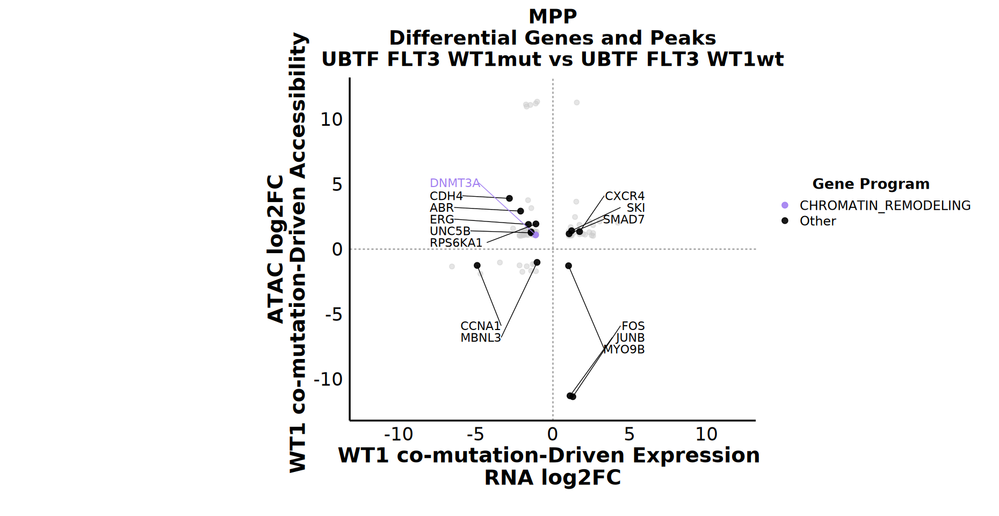

In [ ]:
options(repr.plot.width = 15.5, repr.plot.height = 8)

# === Genes to temporarily annotate as "Other" ===
other_genes <- c("CXCR4", "SMAD7", "SKI", "CDH4", "PPARGC1", "ERG", "ABR", 
                 "RPS6KA1", "UNC5B", "CCNA1", "JUNB", "FOS", "MYO9B", "MBNL3")

# Add "Other" gene set manually
gene_sets2 <- gene_sets
gene_sets2[["Other"]] <- other_genes

# Update ordered pathways to include "Other"
ordered_pathways <- c(ordered_pathways, "Other")

# === Define pathways and colors ===
ordered_pathways <- c(
  "HALLMARK_MYC_TARGETS_V1", "HALLMARK_MYC_TARGETS_V2",
  "HOX_A_GENES", "HOX_B_GENES", "MHC_CLASS_I_II_GENES",
  "HSC_STEMNESS", "LYMPHOID", "MYELOID", "CHROMATIN_REMODELING", "Other"
)

pathway_colors <- c(
  "HALLMARK_MYC_TARGETS_V1" = "#003366",
  "HALLMARK_MYC_TARGETS_V2" = "#005F73",
  "HOX_A_GENES"             = "#BB3E03",
  "HOX_B_GENES"             = "#CA6702",
  "MHC_CLASS_I_II_GENES"    = "#F7B2AD",
  "HSC_STEMNESS"            = "#7AC273",
  "LYMPHOID"                = "#C2CE51",
  "MYELOID"                 = "#581845",
  "CHROMATIN_REMODELING"   = "#A280F0",
  "Other" = "black"
)

# === Define quadrant per gene ===
assign_quadrant <- function(rna, atac) {
  case_when(
    rna >= 0 & atac >= 0 ~ "Q1",
    rna < 0  & atac >= 0 ~ "Q2",
    rna < 0  & atac <  0 ~ "Q3",
    rna >= 0 & atac <  0 ~ "Q4"
  )
}

# === Gene-to-pathway mapping ===
gene_sets_subset <- gene_sets2[ordered_pathways]
gene_to_pathway <- stack(gene_sets_subset)
colnames(gene_to_pathway) <- c("gene_label", "pathway")
gene_to_pathway$pathway <- as.character(gene_to_pathway$pathway)
gene_to_pathway <- gene_to_pathway %>% distinct(gene_label, .keep_all = TRUE)

# === Merge RNA + ATAC ===
merged_list <- lapply(names(atac_split), function(celltype) {
  atac_df <- atac_split[[celltype]]
  rna_df  <- rna_split[[celltype]]
  
  if (!"avg_log2FC" %in% colnames(atac_df) || !"avg_log2FC" %in% colnames(rna_df)) return(NULL)
  
  atac_df <- rename(atac_df, avg_log2FC_atac = avg_log2FC)
  rna_df  <- rename(rna_df, avg_log2FC_rna = avg_log2FC)
  
  inner_join(atac_df, rna_df, by = c("gene_label" = "gene")) %>%
    left_join(gene_to_pathway, by = "gene_label") %>%
    mutate(
      pathway = ifelse(is.na(pathway), "None", pathway),
      color = ifelse(pathway == "None", "grey70", pathway_colors[pathway])
    )
})
names(merged_list) <- names(atac_split)

# === Focus on MPP ===
plot_df <- merged_list[["MPP"]] %>%
  filter(!is.na(avg_log2FC_rna) & !is.na(avg_log2FC_atac)) %>%
  filter(pathway %in% ordered_pathways) %>%
  mutate(quadrant = assign_quadrant(avg_log2FC_rna, avg_log2FC_atac))

sig_pathway_genes <- plot_df

# === Define label positions per (pathway, quadrant) ===
label_position_df <- tibble::tribble(
  ~pathway, ~quadrant, ~label_x, ~y_start, ~y_spacing,
  "HALLMARK_MYC_TARGETS_V1", "Q1",  13,  4.5, -0.9,
  "HALLMARK_MYC_TARGETS_V1", "Q2", -6,  6, -0.9,
  "HOX_A_GENES",             "Q1", 13, 13, -0.9,
  "HOX_B_GENES",             "Q1", 13,  9, -0.9,
  "HSC_STEMNESS",    "Q1",  5,  9, -0.9,
  "MHC_CLASS_I_II_GENES",    "Q1",  3,  9, -0.9,
  "CHROMATIN_REMODELING",   "Q1",  13,  2.5, -0.9,
  "CHROMATIN_REMODELING",   "Q2", -8,  6, -0.9,
  "CHROMATIN_REMODELING",   "Q3", -8, -2, -0.9,
  "HSC_STEMNESS",            "Q1",  5,  6, -0.9,
  "Other" , "Q1", 6,5, -0.9,
  "Other" , "Q2", -8,5, -0.9,
  "Other" , "Q3", -6,-5, -0.9,
  "Other" , "Q4", 6,-5, -0.9,
  # add more combinations as needed
)

# === Label all CHROMATIN_REMODELING genes ===
chromatin_remodeling_genes <- sig_pathway_genes %>%
  filter(pathway == "CHROMATIN_REMODELING")

# === Merge label positions for CHROMATIN_REMODELING (all quadrants) ===
sig_pathway_labeled <- sig_pathway_genes %>%
  filter(pathway != "CHROMATIN_REMODELING") %>%
  bind_rows(chromatin_remodeling_genes) %>%
  inner_join(label_position_df, by = c("pathway", "quadrant")) %>%
  distinct(pathway, quadrant, gene_label, .keep_all = TRUE) %>%
  group_by(pathway, quadrant) %>%
  arrange(desc(abs(avg_log2FC_rna))) %>%
mutate(
  label_y       = y_start + row_number() * y_spacing,
  label_side    = ifelse(avg_log2FC_rna < 0, "right", "left"),
  hjust_val     = ifelse(label_side == "right", 0, 1),
  label_x_fixed = label_x,
  label_width   = 0.53 * nchar(gene_label),
  segment_xend  = case_when(
    label_side == "left"  ~ label_x_fixed - label_width,  # connect to right edge of label on left
    label_side == "right" ~ label_x_fixed + label_width   # connect to left edge of label on right
  )
) %>%
  ungroup()


# === Plot ===
ggplot() +
  geom_point(data = merged_list[["MPP"]],
             aes(x = avg_log2FC_rna, y = avg_log2FC_atac),
             color = "grey80", alpha = 0.5, size = 2) +
  geom_point(data = sig_pathway_genes,
             aes(x = avg_log2FC_rna, y = avg_log2FC_atac, color = pathway),
             alpha = 0.9, size = 2.5) +
  geom_segment(data = sig_pathway_labeled,
               aes(x = avg_log2FC_rna, y = avg_log2FC_atac,
                   xend = segment_xend, yend = label_y, color = pathway),
               size = 0.3, show.legend = FALSE) +
  geom_text(data = sig_pathway_labeled,
            aes(x = label_x_fixed, y = label_y, label = gene_label, color = pathway, hjust = hjust_val),
            size = 4.5, show.legend = FALSE) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "gray60") +
  geom_vline(xintercept = 0, linetype = "dashed", color = "gray60") +
  coord_cartesian(xlim = c(-12, 12), ylim = c(-12, 12)) +
  scale_color_manual(
    values = pathway_colors,
    breaks = ordered_pathways,
    name = "Gene Program"
  ) +
  labs(
    x = "WT1 co-mutation-Driven Expression \nRNA log2FC",
    y = "ATAC log2FC\nWT1 co-mutation-Driven Accessibility ",
    title = "MPP\n Differential Genes and Peaks \nUBTF FLT3 WT1mut vs UBTF FLT3 WT1wt"
  ) +
  theme_minimal(base_size = 16) +
  theme(
    panel.grid = element_blank(),
    axis.line = element_line(color = "black"),
    plot.title = element_text(hjust = 0.5, face = "bold", size = 22),
    legend.title = element_text(face = "bold", size = 16),
    legend.text = element_text(size = 14),
    legend.position = "right",
    axis.title.x = element_text(size = 23, face = "bold"),
    axis.title.y = element_text(size = 23, face = "bold"),
    axis.text.x  = element_text(size = 20, color = "black"),
    axis.text.y  = element_text(size = 20, color = "black"),
    plot.margin = margin(t = 10, r = 30, b = 30, l = 300)
  ) +
  guides(color = guide_legend(
    title.position = "top",
    title.hjust = 0.5,
    nrow = 8,
    byrow = TRUE
  ))